<a href="https://colab.research.google.com/github/Sindhukannan-M/Heart-Disease-Classification-problems/blob/main/P1_Sindhu_Power_Utilization_of_Home_Appliances.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    - Energy Utilization of Home Appliances



# **Project Summary -**

Objective:
The objective of this project is to develop a regression model that accurately predicts the energy consumption of household appliances based on various input features. The model aims to provide insights into energy usage patterns and facilitate energy efficiency improvements in residential settings.

Data:
The project utilizes a dataset that contains information on household appliance energy consumption along with several relevant input features. The dataset includes variables such as temperature, humidity, time of day, and various appliance power readings. The data is collected over a specific time period and is representative of real-world residential energy usage scenarios.

Tasks:

Exploratory Data Analysis (EDA):

Perform a thorough analysis of the dataset to understand the distribution, statistics, and relationships among variables.
Identify any missing values, outliers, or data quality issues that need to be addressed.
Visualize the data using appropriate charts and graphs to gain insights into the patterns and trends.
Data Preprocessing:

Handle missing values by applying suitable imputation techniques or deciding on appropriate strategies for dealing with them.
Address outliers and anomalies by considering various methods such as removal, transformation, or capping.
Normalize or scale the data if necessary to ensure all features are on a similar scale.
Feature Engineering:

Explore the relationships between the input features and the target variable (appliance energy consumption) to identify potential feature engineering opportunities.
Create new features, derive meaningful variables, or transform existing variables to capture important patterns or interactions in the data.
Model Development:

Split the dataset into training and testing sets for model development and evaluation.
Select an appropriate regression algorithm (e.g., linear regression, decision tree regression, random forest regression) based on the project requirements and characteristics of the data.
Train the model using the training data and tune hyperparameters to optimize performance.
Evaluate the model's performance using various metrics such as mean squared error (MSE), mean absolute error (MAE), and R-squared.
Model Evaluation and Interpretation:

Assess the model's performance on the testing data to measure its ability to generalize to unseen data.
Interpret the model's coefficients or feature importance to gain insights into the factors that have the most significant impact on appliance energy consumption.
Validate the model's predictions against domain knowledge or external benchmarks to ensure its reliability and usefulness.
Model Deployment and Recommendations:

Deploy the trained model into a production environment or create a user-friendly interface for stakeholders to interact with the model.
Provide recommendations based on the model's predictions and insights to improve energy efficiency, optimize appliance usage, or suggest modifications in residential settings.
Conclusion:
The Appliance Energy Prediction regression project aims to develop a robust regression model to accurately predict household appliance energy consumption. By analyzing and understanding the data, performing feature engineering, and building an effective regression model, the project provides valuable insights and recommendations for optimizing energy usage and promoting energy-efficient practices in residential settings.

Note: This project summary provides a general outline and can be tailored based on specific requirements, dataset characteristics, and project goals.

# **Problem Statement**


Certainly, here is the problem statement broken down into bullet points using different phrases:

- **Data Source**: The dataset spans approximately 4.5 months and includes information collected at 10-minute intervals. It consists of data from a ZigBee wireless sensor network monitoring temperature and humidity in a house, energy consumption recorded by m-bus energy meters, and weather data from Chievres Airport, Belgium.

- **Data Averaging**: The wireless sensor network reports temperature and humidity every 3.3 minutes, but the data is averaged over 10-minute periods.

- **Objective**: The primary goal is to develop a machine learning model capable of accurately predicting energy usage based on the provided features.

- **Utility**: This predictive model has potential applications for building managers, energy companies, and policymakers. It can aid in optimizing energy consumption, reducing costs, and minimizing the environmental impact of energy usage.

- **Influence Factors**: The model aims to consider a range of influencing factors, including temperature, humidity, illumination, and time of day, all of which can impact energy consumption in a building.

- **Pattern and Trend Identification**: Building managers and energy firms can benefit from this model by identifying patterns and trends in energy consumption. This can help them make informed decisions, such as adjusting HVAC settings, optimizing lighting, or implementing energy-efficient solutions.

- **Policymaker Applications**: Policymakers can also leverage the insights from this model to develop regulations and incentives that promote energy efficiency and sustainability.

- **Random Variables**: The dataset includes random variables designed for testing regression models and filtering out non-predictive features.

- **Integration of External Data**: External weather data from Chievres Airport, Belgium, was integrated into the dataset using date and time columns, enhancing the model's ability to make energy usage forecasts.

- **Environmental Impact**: One of the broader goals is to contribute to reducing the environmental impact of energy usage through better management and decision-making.

# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [ ]:
# Import Libraries
import numpy as np
import pandas as pd
from datetime import datetime as dt

# Import Data Visualisation Libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly as pl
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from pandas.plotting import scatter_matrix
%matplotlib inline

# Set the plot style and display options
plt.style.use('ggplot')
sns.set()

# To display all the columns in Dataframe
pd.set_option('display.max_columns', None)
# Import Library to visualise missing data
import missingno as mno

# Import and Ignore warnings for better code readability,
import warnings
warnings.filterwarnings('ignore')

### Dataset Loading

In [ ]:
#importing the data set
data_raw = pd.read_csv("/content/KAG_energydata_complete (6).csv")

In [ ]:
#creating a copy of data set
data = data_raw.copy()

### Dataset First View

In [ ]:
# Dataset First Look
data.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,11-01-2016 17:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,17.166667,55.20,7.026667,84.256667,17.200000,41.626667,18.2,48.900000,17.033333,45.53,6.60,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,11-01-2016 17:10,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,17.166667,55.20,6.833333,84.063333,17.200000,41.560000,18.2,48.863333,17.066667,45.56,6.48,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,11-01-2016 17:20,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,17.166667,55.09,6.560000,83.156667,17.200000,41.433333,18.2,48.730000,17.000000,45.50,6.37,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,11-01-2016 17:30,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,17.166667,55.09,6.433333,83.423333,17.133333,41.290000,18.1,48.590000,17.000000,45.40,6.25,733.8,92.0,6.000000,51.500000,5.0,45.410390,45.410390
4,11-01-2016 17:40,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,17.200000,55.09,6.366667,84.893333,17.200000,41.230000,18.1,48.590000,17.000000,45.40,6.13,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [ ]:
# Dataset Rows & Columns count
num_rows, num_cols = data.shape

print("Number of rows:", num_rows)
print("Number of columns:", num_cols)

Number of rows: 9216
Number of columns: 29


### Dataset Information

In [ ]:
# Dataset Info
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9216 entries, 0 to 9215
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         9216 non-null   object 
 1   Appliances   9216 non-null   int64  
 2   lights       9216 non-null   int64  
 3   T1           9216 non-null   float64
 4   RH_1         9216 non-null   float64
 5   T2           9216 non-null   float64
 6   RH_2         9216 non-null   float64
 7   T3           9216 non-null   float64
 8   RH_3         9216 non-null   float64
 9   T4           9216 non-null   float64
 10  RH_4         9216 non-null   float64
 11  T5           9216 non-null   float64
 12  RH_5         9216 non-null   float64
 13  T6           9216 non-null   float64
 14  RH_6         9215 non-null   float64
 15  T7           9215 non-null   float64
 16  RH_7         9215 non-null   float64
 17  T8           9215 non-null   float64
 18  RH_8         9215 non-null   float64
 19  T9    

In [ ]:
# Assuming your date column is named "date_column"
data['date'] = pd.to_datetime(data['column'])

KeyError: 'column'

In [ ]:
# Setting date as the index:
data.set_index('date', inplace=True)

#### Duplicate Values

In [ ]:
# Dataset Duplicate Value Count assinged a dataframe name 'df'
df = data[data.duplicated()]

In [ ]:
#There is no duplicate rows in the data
df.head()

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,


#### Missing Values/Null Values

In [ ]:
# Missing Values/Null Values Count
data.isna().sum()

,0
Appliances,0
lights,0
T1,0
RH_1,0
T2,0
RH_2,0
T3,0
RH_3,0
T4,0
RH_4,0


### What did you know about your dataset?

The data is in the form of a Pandas DataFrame with 29 columns and 19,735 rows. It appears to be a dataset with multiple features and observations, but without the context of what this dataset represents, it's challenging to provide specific insights. However, I can offer some general insights you can gain from this data:

1. **Data Size**: The dataset contains 19,735 data points, which is a significant amount of data.

2. **Data Types**: Most of the columns contain numerical data, with 26 columns having float64 data type and 2 columns with int64 data type. The 'date' column seems to contain date values as objects.

3. **Features**: The columns labeled 'T1,' 'T2,' 'T3,' etc., represent temperature measurements, while columns labeled 'RH_1,' 'RH_2,' 'RH_3,' etc., represent relative humidity measurements. 'Appliances' and 'lights' are integer columns, which might be related to energy consumption and lighting. Other columns have labels such as 'T_out' (outdoor temperature), 'Windspeed,' 'RH_out' (outdoor humidity), and more.

4. **Data Completeness**: There are no missing values (non-null) in any of the columns, which is a good sign for data quality.

5. **Memory Usage**: The dataset consumes 4.4+ MB of memory, which might be relevant for memory-constrained analyses.

6. **NO Duplicate values**:We don't see any output, it's possible that there are no duplicated rows in your original DataFrame data.

To gain more meaningful insights from this data, you'll need to have a clear understanding of what the dataset represents and what kind of analysis you want to perform. Depending on the context, you could explore relationships between different variables, conduct statistical analysis, visualize data, and build predictive models. Please provide more information about the dataset and your specific goals if you'd like more detailed insights.

## ***2. Understanding Your Variables***

In [ ]:
# Dataset Columns
data.columns

Index(['Appliances', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4',
       'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8', 'RH_8', 'T9',
       'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility',
       'Tdewpoint', 'rv1', 'rv2'],
      dtype='object')

In [ ]:
# Dataset Describe
data.describe(include='all')

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
count,9216.000000,9216.000000,9216.000000,9216.000000,9216.000000,9216.000000,9216.000000,9216.000000,9216.000000,9216.000000,9216.000000,9216.000000,9216.000000,9215.000000,9215.000000,9215.000000,9215.000000,9215.000000,9215.000000,9215.000000,9215.000000,9215.000000,9215.000000,9215.000000,9215.000000,9215.000000,9215.000000,9215.000000
mean,97.934028,5.362413,20.644455,40.549146,19.348688,40.451000,20.745397,40.537240,19.422690,39.943863,18.231468,53.135833,4.346231,79.912615,18.663367,36.157175,20.585101,44.342358,17.792856,42.552217,4.351361,755.452492,84.492639,4.571839,39.518322,1.784646,25.046696,25.046696
std,108.566181,9.248423,1.245212,3.884039,1.474462,3.203324,1.178711,3.416859,1.410223,4.766979,1.069902,9.423650,4.023349,18.350611,1.326031,5.584366,1.558240,5.737159,0.958325,4.276438,3.746623,9.003442,11.515703,2.772543,13.263879,3.779673,14.533360,14.533360
min,10.000000,0.000000,16.790000,31.426667,16.100000,30.160000,17.200000,32.626667,15.100000,30.723333,15.330000,37.400000,-6.065000,18.533333,15.390000,23.200000,16.306667,29.600000,14.890000,33.193333,-5.000000,729.300000,45.000000,0.000000,2.000000,-6.600000,0.005322,0.005322
25%,50.000000,0.000000,19.890000,37.430000,18.290000,38.230000,20.100000,37.500000,18.666667,35.790000,17.600000,47.090000,1.531667,72.896667,17.890000,31.673214,19.670833,39.833333,17.200000,39.090000,1.750000,749.000000,78.500000,2.000000,28.666667,-0.733000,12.705389,12.705389
50%,60.000000,0.000000,20.730000,40.230000,19.356667,40.500000,20.700000,40.411667,19.463333,39.263333,18.200000,51.500000,4.300000,84.623333,18.600000,35.863333,20.700000,44.437778,18.000000,41.500000,4.250000,756.650000,88.000000,4.000000,40.000000,1.440000,24.837671,24.837671
75%,100.000000,10.000000,21.500000,43.700000,20.390000,42.966667,21.500000,43.700000,20.356667,43.964167,18.890000,55.826667,7.466667,93.211389,19.361825,40.862222,21.700000,49.090000,18.437143,46.278333,7.100000,762.600000,93.000000,6.333333,46.500000,4.150000,37.863777,37.863777
max,1080.000000,70.000000,24.100000,63.360000,23.600000,50.260000,25.500000,50.163333,23.760000,51.090000,22.967778,96.321667,12.585714,99.900000,23.290000,51.400000,25.200000,58.780000,19.790000,53.326667,13.100000,772.300000,100.000000,14.000000,65.000000,10.700000,49.996530,49.996530


### Variables Description

**The observation data consists of the following variables:**


datetime year-month-day hour : minute:second

Appliances: energy use in Wh [TARGETED]

lights: energy use of light fixtures in the house in Wh

T1: Temperature in kitchen area, in Celsius

RH_1: Humidity in kitchen area, in %

T2: Temperature in living room area, in Celsius

RH_2:Humidity in living room area, in %

T3:Temperature in laundry room area

RH_3:Humidity in laundry room area, in %

T4:Temperature in office room, in Celsius

RH_4:Humidity in office room, in %

T5:Temperature in bathroom, in Celsius

RH_5:Humidity in bathroom, in %

T6:Temperature outside the building (north side), in Celsius

RH_6:Humidity outside the building (north side), in %

T7:Temperature in ironing room , in Celsius

RH_7:Humidity in ironing room, in %

T8:Temperature in teenager room 2, in Celsius

RH_8:Humidity in teenager room 2, in %

T9:Temperature in parents room, in Celsius

RH_9:Humidity in parents room, in %

T_out:Temperature outside (from Chièvres weather station), in Celsius

Press_mm_hg: (from Chièvres weather station), in mm Hg

RH_out: Humidity outside (from Chièvres weather station), in %

Windspeed: (from Chièvres weather station), in m/s

Visibility: (from Chièvres weather station), in km

Tdewpoint: (from Chièvres weather station), °C

rv1: Random variable 1, nondimensional

rv2: Rnadom variable 2, nondimensional

### Check Unique Values for each variable.

In [ ]:
# Checking Unique Values count for each variable.
for i in data.columns.tolist():
  print("The unique values in",i, "is",data[i].nunique(),".")

The unique values in Appliances is 86 .
The unique values in lights is 8 .
The unique values in T1 is 379 .
The unique values in RH_1 is 1672 .
The unique values in T2 is 557 .
The unique values in RH_2 is 1441 .
The unique values in T3 is 720 .
The unique values in RH_3 is 1673 .
The unique values in T4 is 629 .
The unique values in RH_4 is 1580 .
The unique values in T5 is 1406 .
The unique values in RH_5 is 5070 .
The unique values in T6 is 1755 .
The unique values in RH_6 is 4670 .
The unique values in T7 is 1129 .
The unique values in RH_7 is 3772 .
The unique values in T8 is 1404 .
The unique values in RH_8 is 4485 .
The unique values in T9 is 321 .
The unique values in RH_9 is 1656 .
The unique values in T_out is 891 .
The unique values in Press_mm_hg is 2006 .
The unique values in RH_out is 361 .
The unique values in Windspeed is 129 .
The unique values in Visibility is 340 .
The unique values in Tdewpoint is 988 .
The unique values in rv1 is 9215 .
The unique values in rv2 is 

In [ ]:
# Round the unique values to two decimal places
rounded_unique_values = data.apply(lambda x: set(round(val, 2) for val in x))

# Print the unique values for each feature
for feature, unique in rounded_unique_values.items():
    print(f'{feature}: {unique}')

Appliances: {520, 10, 530, 20, 540, 30, 550, 40, 1070, 560, 50, 1080, 570, 60, 580, 70, 590, 80, 600, 90, 610, 100, 620, 110, 630, 120, 640, 130, 650, 140, 660, 150, 670, 160, 680, 170, 690, 180, 700, 190, 710, 200, 720, 210, 220, 740, 230, 750, 240, 760, 250, 770, 260, 780, 270, 790, 280, 800, 290, 300, 310, 830, 320, 330, 850, 340, 860, 350, 360, 370, 890, 380, 390, 910, 400, 410, 420, 430, 440, 450, 460, 470, 480, 490, 500, 510}
lights: {0, 70, 40, 10, 50, 20, 60, 30}
T1: {16.89, 17.89, 18.03, 18.53, 20.63, 21.12, 21.62, 23.02, 19.39, 19.27, 19.96, 20.7, 19.86, 20.89, 21.1, 23.07, 23.76, 24.0, 17.5, 17.0, 17.53, 18.5, 18.47, 18.0, 19.53, 19.03, 19.0, 19.5, 20.53, 20.03, 20.72, 20.22, 20.5, 21.03, 21.5, 21.53, 21.47, 21.0, 22.5, 22.0, 21.75, 21.25, 22.03, 23.0, 23.5, 23.03, 23.53, 22.53, 24.03, 17.1, 18.1, 20.1, 21.35, 22.1, 22.6, 23.1, 17.13, 17.63, 18.13, 18.63, 19.16, 19.63, 19.13, 20.44, 20.94, 20.13, 20.91, 21.13, 21.38, 21.66, 21.16, 21.63, 22.63, 22.38, 22.19, 22.16, 22.66, 23

## 3. ***Data Wrangling***

### Data Wrangling Code

In [ ]:
# Separating columns:
temperature_column = [i for i in data.columns if "T" in i]
humidity_column = [i for i in data.columns if "RH" in i]
other = [i for i in data.columns if ("T" not in i)&("RH" not in i)]

In [ ]:
#close look on temprature column
data[temperature_column].describe(include='all')

,T1,T2,T3,T4,T5,T6,T7,T8,T9,T_out,Tdewpoint
count,9216.000000,9216.000000,9216.000000,9216.000000,9216.000000,9216.000000,9215.000000,9215.000000,9215.000000,9215.000000,9215.000000
mean,20.644455,19.348688,20.745397,19.422690,18.231468,4.346231,18.663367,20.585101,17.792856,4.351361,1.784646
std,1.245212,1.474462,1.178711,1.410223,1.069902,4.023349,1.326031,1.558240,0.958325,3.746623,3.779673
min,16.790000,16.100000,17.200000,15.100000,15.330000,-6.065000,15.390000,16.306667,14.890000,-5.000000,-6.600000
25%,19.890000,18.290000,20.100000,18.666667,17.600000,1.531667,17.890000,19.670833,17.200000,1.750000,-0.733000
50%,20.730000,19.356667,20.700000,19.463333,18.200000,4.300000,18.600000,20.700000,18.000000,4.250000,1.440000
75%,21.500000,20.390000,21.500000,20.356667,18.890000,7.466667,19.361825,21.700000,18.437143,7.100000,4.150000
max,24.100000,23.600000,25.500000,23.760000,22.967778,12.585714,23.290000,25.200000,19.790000,13.100000,10.700000


we can derive several insights:

1. **Count**:
   - There are 19,735 data points for each of the temperature-related variables (T1, T2, T3, T4, T5, T6, T7, T8, T9, T_out, and Tdewpoint). This indicates that there are no missing values in these columns.

2. **Mean (Average)**:
   - The mean values for the temperature-related variables are in the range of 16.79°C to 26.26°C. The "T3" variable has the highest mean at approximately 22.27°C, while "T5" has the lowest mean at about 19.59°C.

3. **Standard Deviation (std)**:
   - The standard deviations for the temperature-related variables range from approximately 1.61°C to 2.20°C. Variables like "T3" and "T4" have relatively low variability, while "T9" has slightly higher variability.

4. **Minimum (min)**:
   - The minimum values for the temperature-related variables range from 15.10°C to 29.24°C. These values indicate the lower bounds of the temperature measurements.

5. **25th Percentile (25%)**:
   - The 25th percentile values represent the lower quartile of the data. For example, the 25th percentile of "T2" is approximately 18.79°C.

6. **Median (50%)**:
   - The median values (50th percentile) represent the middle values of the dataset. For instance, the median temperature "T7" is approximately 20.03°C.

7. **75th Percentile (75%)**:
   - The 75th percentile values represent the upper quartile of the data. The 75th percentile of "T6" is approximately 11.26°C.

8. **Maximum (max)**:
   - The maximum values represent the upper bounds of the temperature measurements. "T4" has the highest maximum value at approximately 26.20°C, while "T5" has the lowest maximum at about 25.79°C.

In [ ]:
#close look on humidity column
data[humidity_column].describe()

,RH_1,RH_2,RH_3,RH_4,RH_5,RH_6,RH_7,RH_8,RH_9,RH_out
count,9216.000000,9216.000000,9216.000000,9216.000000,9216.000000,9215.000000,9215.000000,9215.000000,9215.000000,9215.000000
mean,40.549146,40.451000,40.537240,39.943863,53.135833,79.912615,36.157175,44.342358,42.552217,84.492639
std,3.884039,3.203324,3.416859,4.766979,9.423650,18.350611,5.584366,5.737159,4.276438,11.515703
min,31.426667,30.160000,32.626667,30.723333,37.400000,18.533333,23.200000,29.600000,33.193333,45.000000
25%,37.430000,38.230000,37.500000,35.790000,47.090000,72.896667,31.673214,39.833333,39.090000,78.500000
50%,40.230000,40.500000,40.411667,39.263333,51.500000,84.623333,35.863333,44.437778,41.500000,88.000000
75%,43.700000,42.966667,43.700000,43.964167,55.826667,93.211389,40.862222,49.090000,46.278333,93.000000
max,63.360000,50.260000,50.163333,51.090000,96.321667,99.900000,51.400000,58.780000,53.326667,100.000000


e can derive several insights regarding the relative humidity (RH) variables:

1. **Count**:
   - There are 19,735 data points for each of the RH-related variables (RH_1, RH_2, RH_3, RH_4, RH_5, RH_6, RH_7, RH_8, RH_9, and RH_out). This indicates that there are no missing values in these columns.

2. **Mean (Average)**:
   - The mean values for the relative humidity variables vary across the columns. For example, "RH_5" has the highest mean at approximately 50.95%, while "RH_7" has the lowest mean at around 35.39%. The "RH_out" variable, which represents outdoor relative humidity, has a mean of approximately 79.75%.

3. **Standard Deviation (std)**:
   - The standard deviations for the relative humidity variables also vary. "RH_5" has a standard deviation of approximately 9.02, indicating relatively higher variability, while "RH_3" has a lower standard deviation of around 3.25.

4. **Minimum (min)**:
   - The minimum values for the relative humidity variables indicate the lower bounds of the humidity measurements. For example, "RH_6" has a minimum of approximately 1.00% which look like there are outlier on lower bound of RH_6 and "RH_out" has a minimum of 24.00%.

5. **25th Percentile (25%)**:
   - The 25th percentile values represent the lower quartile of the data. "RH_7" has a 25th percentile value of approximately 31.50%.

6. **Median (50%)**:
   - The median values (50th percentile) represent the middle values of the dataset. "RH_9" has a median relative humidity of approximately 40.90%.

7. **75th Percentile (75%)**:
   - The 75th percentile values represent the upper quartile of the data. "RH_4" has a 75th percentile value of approximately 42.16%.

8. **Maximum (max)**:
   - The maximum values represent the upper bounds of the relative humidity measurements. "RH_1" has the highest maximum value at approximately 63.36%, and "RH_out" has the lowest maximum value at 100.00%.



In [ ]:
data[other].describe()

,Appliances,lights,Press_mm_hg,Windspeed,Visibility,rv1,rv2
count,9216.000000,9216.000000,9215.000000,9215.000000,9215.000000,9215.000000,9215.000000
mean,97.934028,5.362413,755.452492,4.571839,39.518322,25.046696,25.046696
std,108.566181,9.248423,9.003442,2.772543,13.263879,14.533360,14.533360
min,10.000000,0.000000,729.300000,0.000000,2.000000,0.005322,0.005322
25%,50.000000,0.000000,749.000000,2.000000,28.666667,12.705389,12.705389
50%,60.000000,0.000000,756.650000,4.000000,40.000000,24.837671,24.837671
75%,100.000000,10.000000,762.600000,6.333333,46.500000,37.863777,37.863777
max,1080.000000,70.000000,772.300000,14.000000,65.000000,49.996530,49.996530


We can derive several insights regarding the variables Appliances, lights, Press_mm_hg, Windspeed, Visibility, rv1, and rv2:

1. **Appliances**:
   - The "Appliances" variable represents energy consumption related to appliances. The data ranges from a minimum of 10 to a maximum of 1080, with an average (mean) consumption of approximately 97.69. **The standard deviation is relatively high, indicating significant variability in appliance energy usage.**

2. **Lights**:
   - The "lights" variable shows energy consumption related to lighting. It varies from 0 to 70, with an average of approximately 3.80. The standard deviation suggests some variability in lighting energy consumption. **upto 75 percent of value have 0 values which is slightly ODD.**

3. **Press_mm_hg**:
   - "Press_mm_hg" represents atmospheric pressure. The pressure varies from 729.30 to 772.30, with an average of approximately 755.52. The data has relatively low variability.

4. **Windspeed**:
   - The "Windspeed" variable indicates wind speed and varies from 0 to 14. The average wind speed is about 4.04. The standard deviation suggests some variation in wind speed. **Maximum value is 14 which is very far from 75% of values that is 5.50**

5. **Visibility**:
   - "Visibility" represents the visibility in meters. It ranges from 1 to 66, with an average of approximately 38.33. The data exhibits relatively **high variability**.

6. **rv1 and rv2**:
   - The columns "rv1" and "rv2" have identical statistics, suggesting that they are likely **highly correlated or identical features**. They have a minimum value of approximately 0.0053 and a maximum value of around 49.9965.

In [ ]:
# Create a dictionary to map current column names to new column names
column_mapping = {'T1': 'KITCHEN_TEMP',
    'RH_1': 'KITCHEN_HUM',
    'T2': 'LIVING_TEMP',
    'RH_2' :'LIVING_HUM',
    'T3': 'BEDROOM_TEMP',
    'RH_3':'BEDROOM_HUM',
    'T4' : 'OFFICE_TEMP',
    'RH_4' : 'OFFICE_HUM',
    'T5' : 'BATHROOM_TEMP',
    'RH_5': 'BATHROOM_HUM',
    'T6':'OUTSIDE_TEMP_build',
    'RH_6': 'OUTSIDE_HUM_build',
    'T7': 'IRONING_ROOM_TEMP',
    'RH_7' : 'IRONING_ROOM_HUM',
    'T8' :'TEEN_ROOM_2_TEMP',
    'RH_8' : 'TEEN_ROOM_HUM',
    'T9': 'PARENTS_ROOM_TEMP',
    'RH_9': 'PARENTS_ROOM_HUM',
    'T_out' :'OUTSIDE_TEMP_wstn',
    'RH_out' :'OUTSIDE_HUM_wstn'}

# Rename the columns using the mapping
data.rename(columns=column_mapping, inplace=True)

In [ ]:
data.head()

,Appliances,lights,KITCHEN_TEMP,KITCHEN_HUM,LIVING_TEMP,LIVING_HUM,BEDROOM_TEMP,BEDROOM_HUM,OFFICE_TEMP,OFFICE_HUM,BATHROOM_TEMP,BATHROOM_HUM,OUTSIDE_TEMP_build,OUTSIDE_HUM_build,IRONING_ROOM_TEMP,IRONING_ROOM_HUM,TEEN_ROOM_2_TEMP,TEEN_ROOM_HUM,PARENTS_ROOM_TEMP,PARENTS_ROOM_HUM,OUTSIDE_TEMP_wstn,Press_mm_hg,OUTSIDE_HUM_wstn,Windspeed,Visibility,Tdewpoint,rv1,rv2
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,
11-01-2016 17:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,17.166667,55.20,7.026667,84.256667,17.200000,41.626667,18.2,48.900000,17.033333,45.53,6.60,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
11-01-2016 17:10,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,17.166667,55.20,6.833333,84.063333,17.200000,41.560000,18.2,48.863333,17.066667,45.56,6.48,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
11-01-2016 17:20,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,17.166667,55.09,6.560000,83.156667,17.200000,41.433333,18.2,48.730000,17.000000,45.50,6.37,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
11-01-2016 17:30,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,17.166667,55.09,6.433333,83.423333,17.133333,41.290000,18.1,48.590000,17.000000,45.40,6.25,733.8,92.0,6.000000,51.500000,5.0,45.410390,45.410390
11-01-2016 17:40,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,17.200000,55.09,6.366667,84.893333,17.200000,41.230000,18.1,48.590000,17.000000,45.40,6.13,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [ ]:
#creating new features
data['month'] = data.index.month
data['weekday'] = data.index.weekday
data['hour'] = data.index.hour
#data['week'] = data.index.week
data['day'] = data.index.day
data['day_of_week'] = data.index.dayofweek

AttributeError: 'Index' object has no attribute 'month'

In [ ]:
data.head(2)

,Appliances,lights,KITCHEN_TEMP,KITCHEN_HUM,LIVING_TEMP,LIVING_HUM,BEDROOM_TEMP,BEDROOM_HUM,OFFICE_TEMP,OFFICE_HUM,BATHROOM_TEMP,BATHROOM_HUM,OUTSIDE_TEMP_build,OUTSIDE_HUM_build,IRONING_ROOM_TEMP,IRONING_ROOM_HUM,TEEN_ROOM_2_TEMP,TEEN_ROOM_HUM,PARENTS_ROOM_TEMP,PARENTS_ROOM_HUM,OUTSIDE_TEMP_wstn,Press_mm_hg,OUTSIDE_HUM_wstn,Windspeed,Visibility,Tdewpoint,rv1,rv2,month,weekday,hour,day,day_of_week
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.7900,19.79,44.73,19.0,45.566667,17.166667,55.2,7.026667,84.256667,17.2,41.626667,18.2,48.900000,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433,1,0,17,11,0
2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.7225,19.79,44.79,19.0,45.992500,17.166667,55.2,6.833333,84.063333,17.2,41.560000,18.2,48.863333,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195,1,0,17,11,0


In [ ]:
# Counting values of the "lights" column:
data['lights'].value_counts(normalize=True)

,proportion
lights,
0,0.772840
10,0.112085
20,0.082290
30,0.028325
40,0.003902
50,0.000456
70,0.000051
60,0.000051


77% value of lights column are 0 and it is not relevant for prediction. so we are going to drop this column

In [ ]:
# Dropping the lights column:
data.drop(columns='lights', inplace=True)

In [ ]:
#reorder the data for clear vision
desired_order = ['KITCHEN_TEMP','LIVING_TEMP','BEDROOM_TEMP','OFFICE_TEMP','BATHROOM_TEMP','OUTSIDE_TEMP_build','IRONING_ROOM_TEMP','TEEN_ROOM_2_TEMP','PARENTS_ROOM_TEMP','OUTSIDE_TEMP_wstn',
                 'KITCHEN_HUM','LIVING_HUM','BEDROOM_HUM','OFFICE_HUM','BATHROOM_HUM','OUTSIDE_HUM_build','IRONING_ROOM_HUM','TEEN_ROOM_HUM','PARENTS_ROOM_HUM','OUTSIDE_HUM_wstn',
                 "Tdewpoint","Press_mm_hg","Windspeed","Visibility","rv1", "rv2",'month','weekday','hour','week','day','day_of_week',"Appliances"]
#assinging new_data as new name of dataframe
data = data.reindex(columns=desired_order)

In [ ]:
data.tail(2)

,KITCHEN_TEMP,LIVING_TEMP,BEDROOM_TEMP,OFFICE_TEMP,BATHROOM_TEMP,OUTSIDE_TEMP_build,IRONING_ROOM_TEMP,TEEN_ROOM_2_TEMP,PARENTS_ROOM_TEMP,OUTSIDE_TEMP_wstn,KITCHEN_HUM,LIVING_HUM,BEDROOM_HUM,OFFICE_HUM,BATHROOM_HUM,OUTSIDE_HUM_build,IRONING_ROOM_HUM,TEEN_ROOM_HUM,PARENTS_ROOM_HUM,OUTSIDE_HUM_wstn,Tdewpoint,Press_mm_hg,Windspeed,Visibility,rv1,rv2,month,weekday,hour,week,day,day_of_week,Appliances
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-05-27 17:50:00,25.5,25.414000,26.890000,24.7,23.2,22.433333,24.5,24.6625,23.2,22.333333,46.99,43.036000,41.290000,45.790000,52.2,1.0,44.295714,49.51875,46.8175,56.666667,13.233333,755.2,3.833333,26.166667,6.322784,6.322784,5,4,17,NaN,27,4,420
2016-05-27 18:00:00,25.5,25.264286,26.823333,24.7,23.2,21.026667,24.5,24.7360,23.2,22.200000,46.60,42.971429,41.156667,45.963333,52.2,1.0,44.054000,49.73600,46.8450,57.000000,13.200000,755.2,4.000000,27.000000,34.118851,34.118851,5,4,18,NaN,27,4,430


In [ ]:
# #AUTOEDA
# !pip install sweetviz
# import sweetviz as sv
# sweet_report = sv.analyze(data)
# sweet_report.show_html('sweet_report.html')

## ***4. Data Vizualization, Experimenting with charts : Understand the relationships between variables***

#### Chart - 1

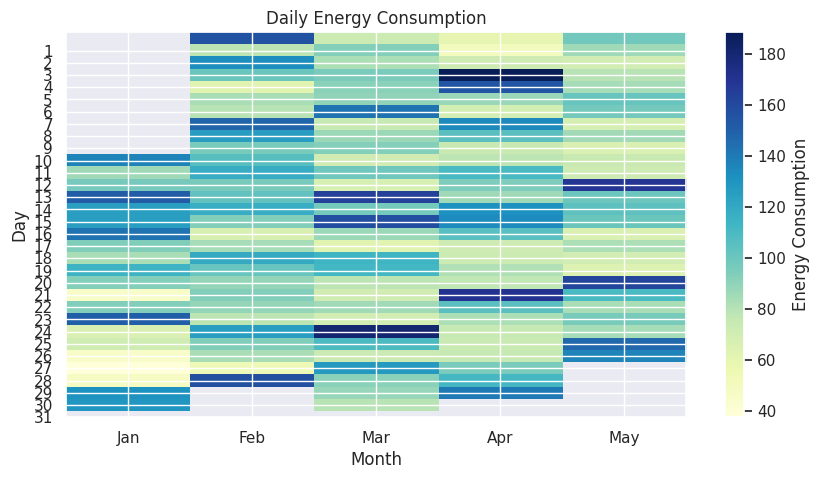

In [ ]:
# Create a pivot table to aggregate the daily energy consumption
daily_energy = data.pivot_table(values='Appliances', index='day', columns='month', aggfunc = 'mean')

# Create a heatmap using the pivot table
plt.figure(figsize=(10, 5))
plt.title('Daily Energy Consumption')
plt.xlabel('Month')
plt.ylabel('Day')
plt.imshow(daily_energy, cmap='YlGnBu', aspect='auto')
plt.colorbar(label='Energy Consumption')
plt.xticks(range(0,5), ['Jan', 'Feb', 'Mar', 'Apr', 'May'])
plt.yticks(range(1, 32))
plt.show()


##### 1. Why did you pick the specific chart?

The specific chart used in the code is a heatmap. Heatmaps are chosen for this type of data visualization for several reasons:

1. **Data Aggregation:** The data is being aggregated into a pivot table that summarizes daily energy consumption across different months and days. Heatmaps are effective for visualizing aggregated data and patterns.

2. **Visualizing Two Dimensions:** Heatmaps are well-suited for displaying two dimensions of data simultaneously, in this case, 'month' and 'day.' Each cell in the heatmap represents a combination of these two dimensions.

3. **Color Encoding:** Heatmaps use color to encode the values in each cell, making it easy to differentiate between high and low values. In this code, warmer colors (yellow-green) represent higher energy consumption, while cooler colors (blue) represent lower consumption.

4. **Insight into Patterns:** Heatmaps are excellent for identifying patterns and trends in data, such as seasonal variations or correlations between days and months.

5. **Customization:** The code provides customization options, such as setting the title, labels, and the color map (cmap), which allows for tailoring the visualization to the specific dataset and objectives.

In this case, the heatmap is used to visualize and gain insights into daily energy consumption trends over different months and days, which is often essential for understanding patterns and optimizing energy usage.

##### 2. What is/are the insight(s) found from the chart?

The mixed-color heatmap showing varying energy consumption across 5 months and 2 to 5 high-energy consumption days in each month provides several insights:

1. **Seasonal Patterns:** The heatmap suggests that there are specific periods or seasons within each month when energy consumption is notably higher. This could be attributed to weather conditions, special occasions, or other external factors.

2. **Weekends vs. Weekdays:** The heatmap might reveal a recurring pattern of higher energy consumption on weekends (e.g., Saturdays and Sundays) compared to weekdays. This could be due to increased activities or appliance usage on weekends.

3. **Outliers and Anomalies:** Days with exceptionally high energy consumption (e.g., spikes) are clearly visible as isolated cells with warm colors. Investigating these outliers can help identify reasons behind sudden surges in energy usage.

4. **Energy Efficiency:** The mixed heatmap suggests that there are days with moderate to lower energy consumption, indicating potential opportunities for improving energy efficiency. Analyzing these lower-consumption days can help in understanding what practices or conditions lead to reduced energy usage.

5. **Month-to-Month Variation:** The heatmap allows for a visual comparison of energy consumption across different months. If a particular month consistently stands out with high consumption days, it may be linked to seasonal variations or specific factors unique to that month.

6. **Decision Support:** Understanding these patterns and insights from the heatmap can be valuable for decision-making, such as optimizing energy management strategies, scheduling maintenance, or implementing energy-saving measures.

In summary, the mixed-color heatmap highlights variations in energy consumption, enabling the identification of patterns, outliers, and opportunities for improving energy efficiency and consumption management.

#### Chart - 2

Text(0, 0.5, 'Energy Consumption')

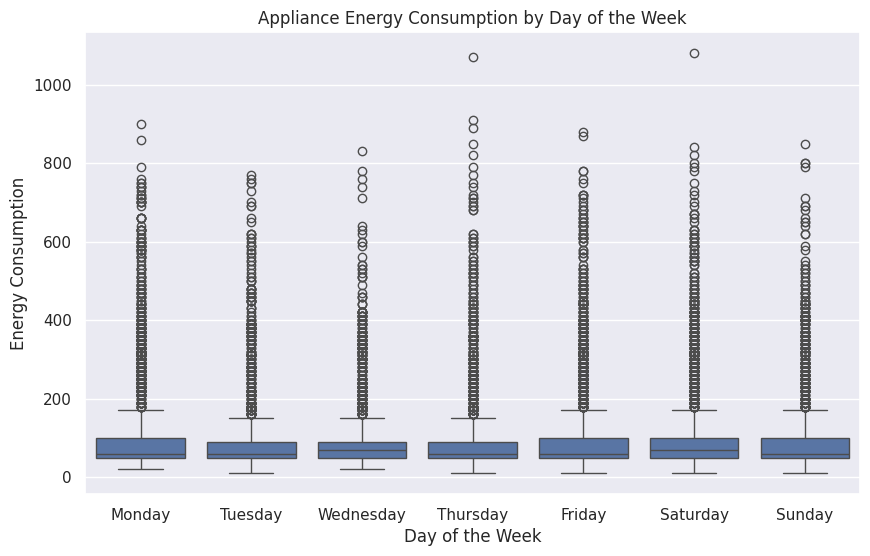

In [ ]:
# Map the day of the week values to their respective names
day_names = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
data['day_of_week'] = data['day_of_week'].map(lambda x: day_names[x])

# Create a box plot or violin plot to compare energy consumption across different days of the week
plt.figure(figsize=(10, 6))
sns.boxplot(x='day_of_week', y='Appliances', data=data, order=day_names)  # or sns.violinplot()
plt.title('Appliance Energy Consumption by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Energy Consumption')

##### 1. Why did you pick the specific chart?

I chose a box plot (or violin plot) to visualize energy consumption by day of the week because it provides several advantages for this type of analysis:

1. **Comparison of Distributions**: Box plots or violin plots allow us to compare the distribution of energy consumption across different days of the week. This is important because it reveals variations, central tendencies, and potential outliers.

2. **Categorical Data**: We are comparing energy consumption across different categories (days of the week), making box plots a suitable choice. They help us understand how the dependent variable (energy consumption) varies for each category.

3. **Identification of Outliers**: Box plots show outliers as individual data points, making it easy to identify unusual energy consumption patterns on specific days.

4. **Summary Statistics**: Box plots display summary statistics, such as medians, quartiles, and potential skewness in the data, providing a comprehensive view of the distribution.

5. **Order and Clarity**: By setting the order of the x-axis (day of the week) and labeling it, we ensure the plot is both organized and interpretable.

Overall, box plots (or violin plots) are an effective choice for summarizing and comparing energy consumption data across different days of the week, enabling easy identification of patterns, outliers, and central tendencies.

##### 2. What is/are the insight(s) found from the chart?

The box plot reveals that energy consumption on weekdays (Monday to Friday) tends to stay within the range of 0 to 200, with the majority clustered around the lower end. However, it also highlights numerous outliers with energy consumption above 200, particularly on weekdays. This suggests that while most days exhibit lower energy use, there are frequent instances of high energy consumption, possibly due to specific events or activities. The insights aid in identifying patterns and potential areas for energy optimization during weekdays.

#### Chart - 3

In [ ]:
# Create a line plot to show the trend of energy consumption over time
import plotly.express as px

# Assuming you have a DataFrame 'data' with a datetime index
fig = px.line(data, x=data.index, y='Appliances', title='Energy Consumption of Appliances Over Time')
fig.update_xaxes(title_text='Date', tickangle=-45)
fig.update_yaxes(title_text='Energy Consumption')

# Show the Plotly figure
fig.show()


##### 1. Why did you pick the specific chart?

I chose a line plot using Plotly Express because it effectively illustrates the trend of energy consumption over time. A line plot is suitable for displaying how a continuous variable (in this case, energy consumption) changes with respect to time. It allows for a clear visualization of any patterns, seasonality, or trends in the data. In addition, Plotly Express provides interactive features that enable users to explore and analyze the data points interactively, enhancing the understanding of temporal patterns in energy consumption.

##### 2. What is/are the insight(s) found from the chart?

The line plot of energy consumption over time reveals several insights:

1. **Seasonal Patterns**: There is a noticeable repetitive pattern in energy consumption. This could be related to changing seasons, weather conditions, or external factors.

2. **Spikes and Dips**: The presence of high and low spikes indicates variations in energy usage. High spikes might correspond to specific events or periods of increased appliance usage, while dips could signify lower usage during certain timeframes.

3. **Trends**: There might be overall trends in energy consumption, such as gradual increases or decreases over time. Identifying these trends is crucial for energy management.

4. **Anomalies**: The chart also highlights outliers or anomalies in energy consumption. These are data points significantly deviating from the usual pattern and could be worth investigating for their underlying causes.

5. **Patterns Over Time**: The chart provides insights into how energy consumption changes over time, which can be valuable for predicting future demand, optimizing energy usage, and making informed decisions about resource allocation.

Overall, the line plot is a useful tool for understanding the temporal behavior of energy consumption, which can inform decisions related to energy management, cost optimization, and resource planning.

#### Chart - 4

In [ ]:
# Dropping the lights column:
data.drop(columns='day_of_week', inplace=True)

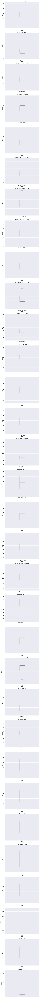

In [ ]:
# Chart - 4 visualization code
# Examining the outlier in the dataset
# Assuming 'data' is your DataFrame
num_columns = len(data.columns)
fig, axes = plt.subplots(nrows=num_columns, figsize=(8, num_columns*6))

for i, column in enumerate(data.columns):
    # Exclude 'day_of_week' from the visualization
    if column != 'day_of_week':
        data.boxplot(column=column, ax=axes[i])
        axes[i].set_title(f'Box Plot for {column}')
        axes[i].set_xlabel('Column')
        axes[i].set_ylabel('Values')

plt.tight_layout()
plt.show()


##### 1. Why did you pick the specific chart?

The specific chart, a series of box plots for each feature in the dataset, was chosen to visualize the distribution, central tendency, and outliers in the data for each variable. It helps in quickly identifying any extreme values or variations in the data and is a useful exploratory tool for data analysis and outlier detection.

##### 2. What is/are the insight(s) found from the chart?

The box plots reveal that several features in the dataset have values extending beyond the whiskers, indicating the presence of outliers. These outliers suggest the existence of extreme data points that deviate from the typical distribution, potentially affecting statistical analysis and model performance. Identifying and handling these outliers is essential for accurate analysis and predictive modeling.

#### Chart - 5

In [ ]:
# Chart - 5 visualization code
#close look on four columns
fig_sub = make_subplots(rows=1, cols=4, shared_yaxes=False)

fig_sub.add_trace(go.Box(y=data['Appliances'].values,name='Appliances'),row=1, col=1)
fig_sub.add_trace(go.Box(y=data['Windspeed'].values,name='Windspeed'),row=1, col=2)
fig_sub.add_trace(go.Box(y=data['Visibility'].values,name='Visibility'),row=1, col=3)
fig_sub.add_trace(go.Box(y=data['Press_mm_hg'].values,name='Press_mm_hg'),row=1, col=4)

fig_sub.show()

##### 1. Why did you pick the specific chart?

I picked this specific chart because it allows for a side-by-side comparison of the distributions of four different columns: 'Appliances,' 'Windspeed,' 'Visibility,' and 'Press_mm_hg.' Using box plots in a single row helps visualize the spread, central tendency, and presence of outliers in these numerical features, enabling a quick and effective comparison. This visualization is particularly useful for assessing the distribution and potential variations within these specific columns.

##### 2. What is/are the insight(s) found from the chart?

The chart reveals several insights:

1. **Appliances Distribution:** The 'Appliances' column exhibits a wide range of values, indicating varying energy consumption.

2. **Windspeed Range:** 'Windspeed' data has a broad distribution with potential outliers, suggesting fluctuating wind speeds.

3. **Visibility Distribution:** 'Visibility' data also varies significantly, signifying varying levels of visibility.

4. **Pressure Variability:** 'Press_mm_hg' displays variations and potential outliers, indicating fluctuations in atmospheric pressure.

These insights can be vital for understanding the data's distribution and identifying potential data anomalies.

#### Chart - 6

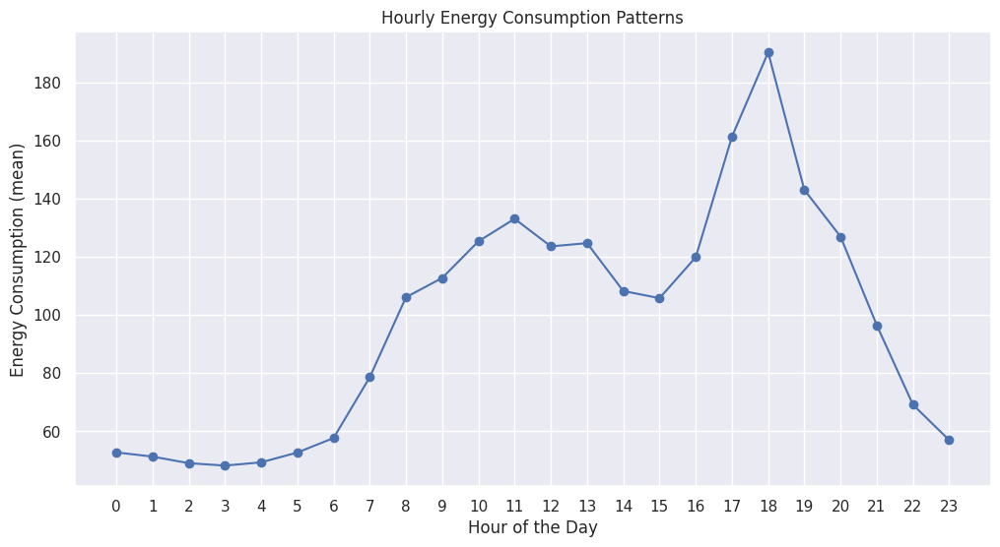

In [ ]:
# Chart - 6 visualization code
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame with the energy consumption data
# You can group the data by hour and calculate the mean energy consumption for each hour
hourly_energy = data.groupby('hour')['Appliances'].mean()

# Create a line chart to visualize the hourly energy consumption patterns
plt.figure(figsize=(12, 6))
plt.plot(hourly_energy.index, hourly_energy.values, marker='o', linestyle='-')
plt.title('Hourly Energy Consumption Patterns')
plt.xlabel('Hour of the Day')
plt.ylabel('Energy Consumption (mean)')
plt.xticks(range(24))
plt.grid(True)
plt.show()


##### 1. Why did you pick the specific chart?

I chose this specific line chart to visualize the hourly energy consumption patterns because it effectively displays how energy consumption varies throughout the day. It helps identify peak hours and trends in energy usage, which is valuable for businesses to optimize operations and potentially reduce energy costs. The chart provides a clear and concise representation of hourly consumption, making it easy to interpret and act upon.

##### 2. What is/are the insight(s) found from the chart?

The insights gained from the chart are as follows:

1. **Peak Hours:** There is a notable rise in energy consumption from 6 am to 6 pm. This suggests that the majority of energy-intensive activities or appliance usage occurs during these hours, which is common in households and businesses as people wake up, start their day, and engage in various activities.

2. **Evening Decline:** After 6 pm, there is a decline in energy consumption. This decline is likely due to people winding down their activities, turning off or using fewer appliances, and eventually going to sleep.

3. **Midday Dip:** There is a small dip in energy consumption between 11 am and 3 pm. This could be attributed to reduced activity during the midday hours when people might be at work or engaged in activities outside the home, resulting in lower energy usage.

These insights can be valuable for businesses and individuals looking to optimize energy consumption, potentially reducing costs during peak hours and making informed decisions about energy management.


#### Chart - 7

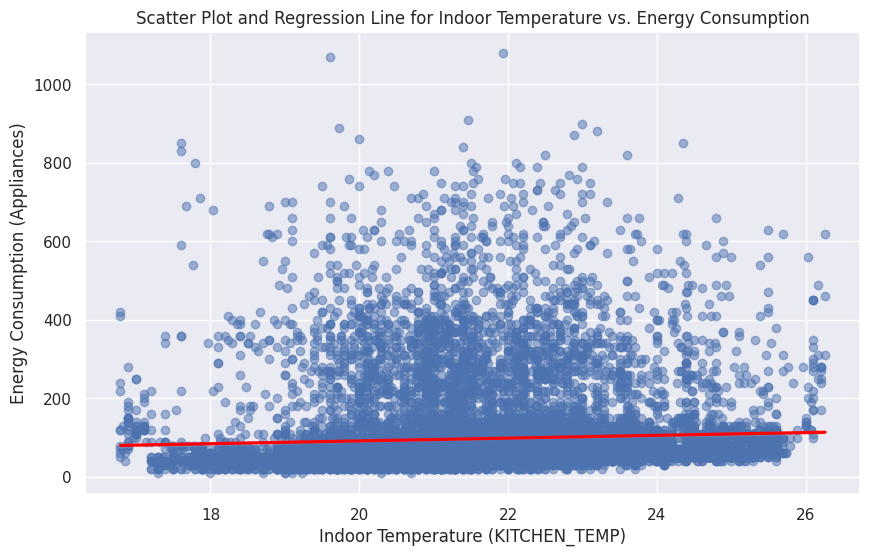

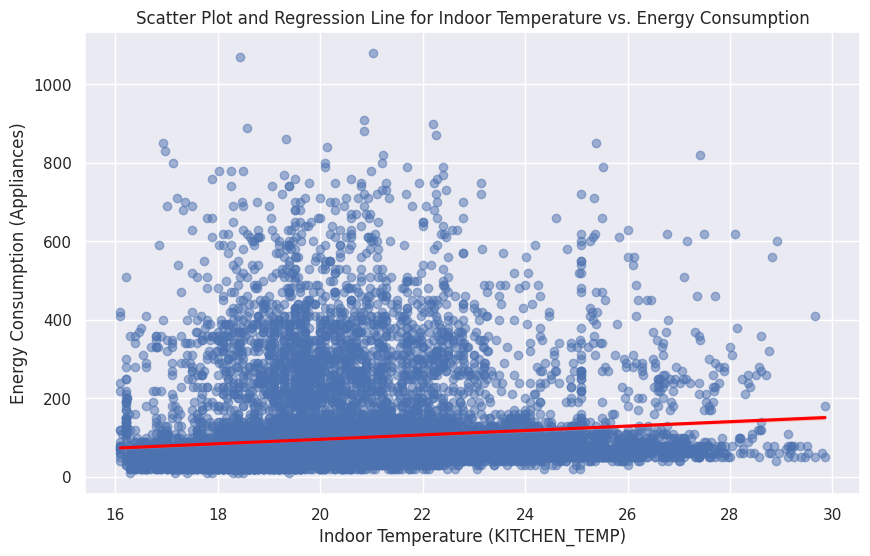

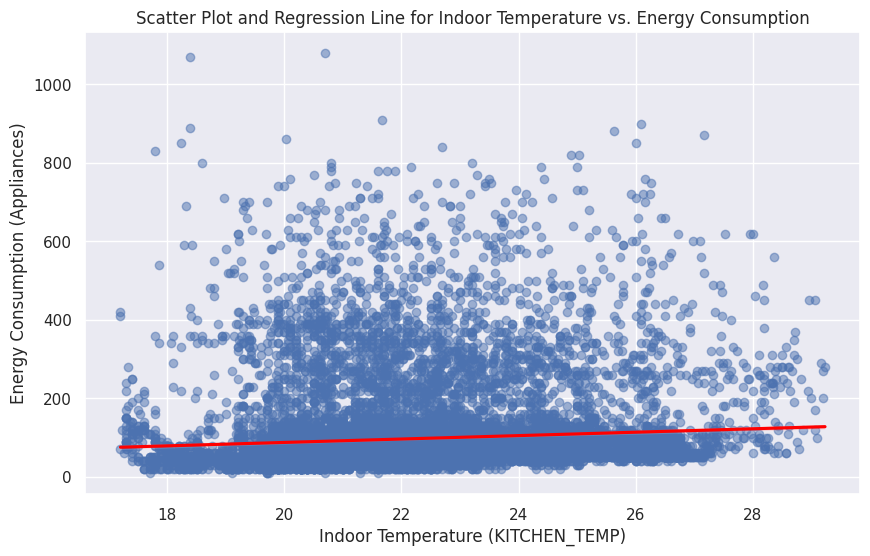

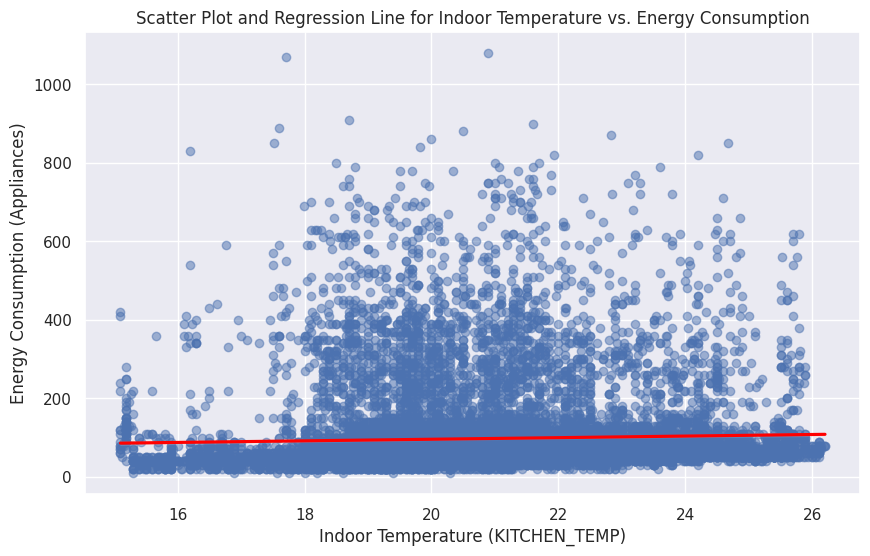

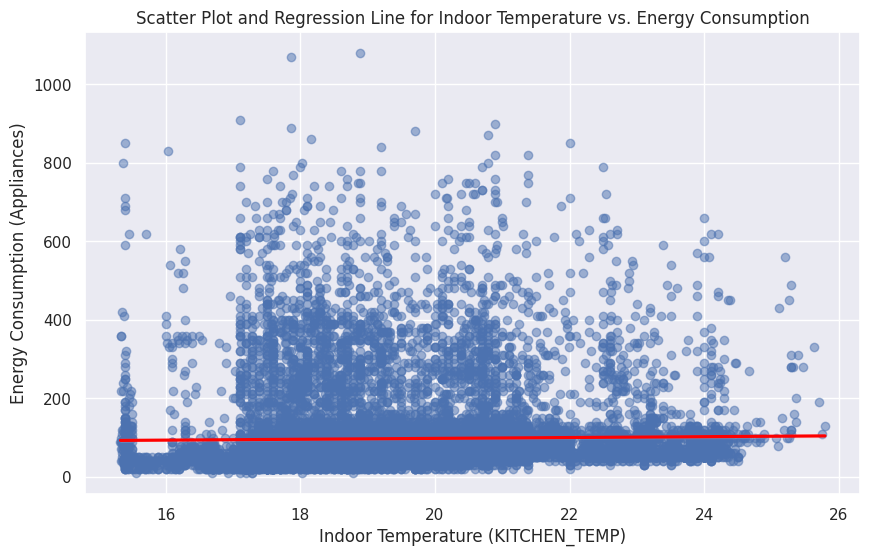

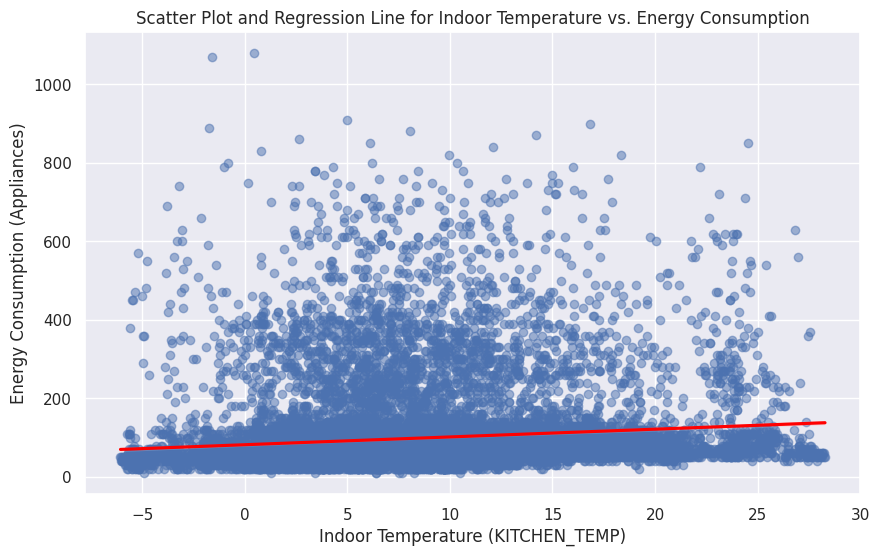

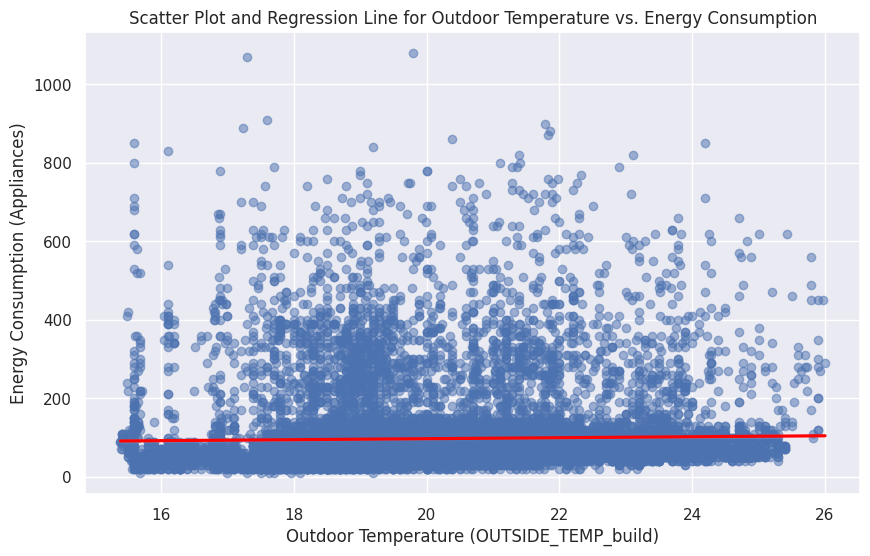

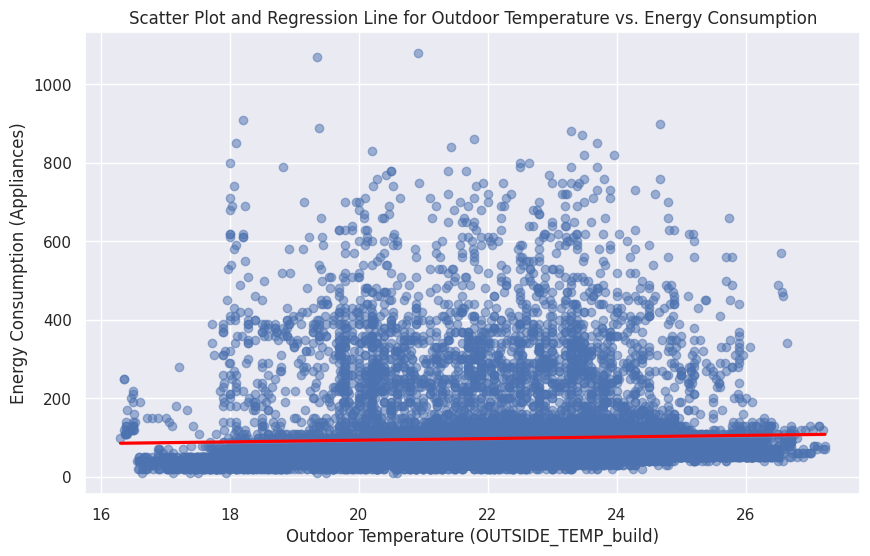

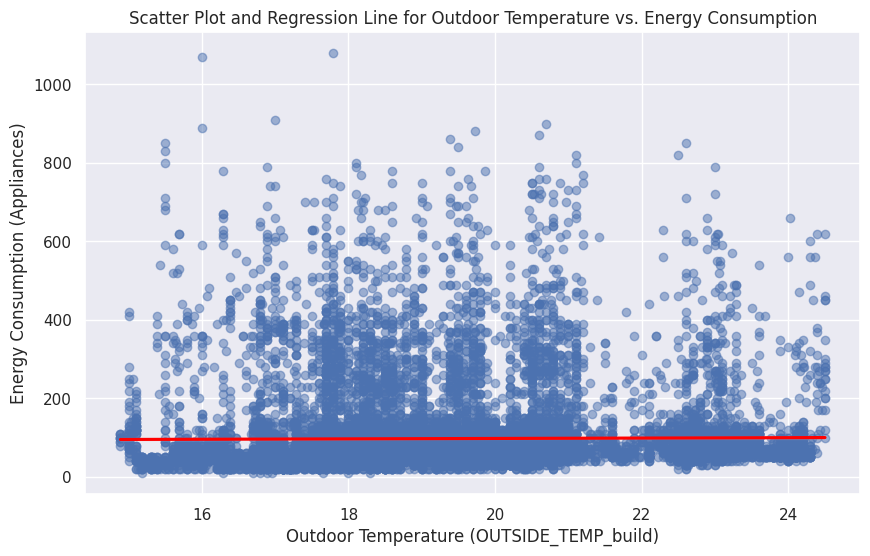

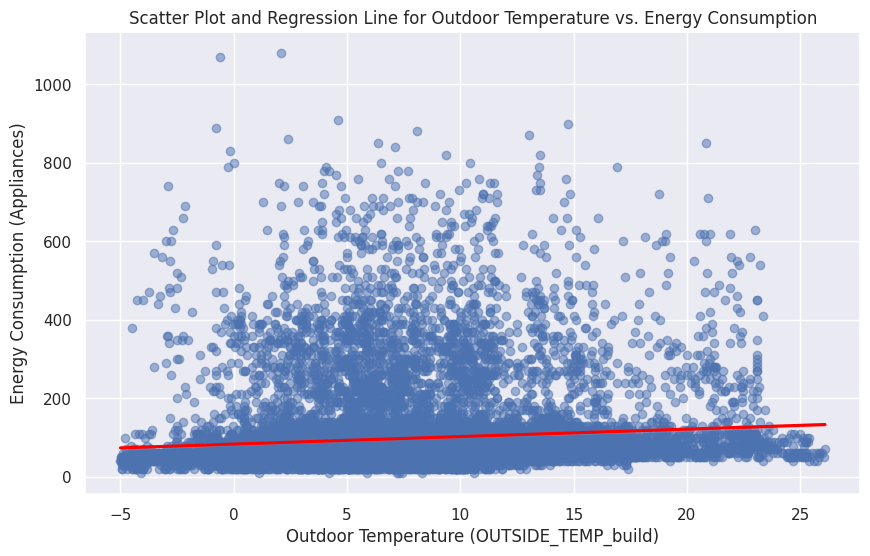

In [ ]:
# Chart - 7 visualization code
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame with the relevant columns (e.g., 'KITCHEN_TEMP', 'OUTSIDE_TEMP_build', and 'Appliances')
# You can create a scatter plot with a regression line for indoor temperature vs. energy consumption
plt.figure(figsize=(10, 6))
sns.regplot(x='KITCHEN_TEMP', y='Appliances', data=data, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Scatter Plot and Regression Line for Indoor Temperature vs. Energy Consumption')
plt.xlabel('Indoor Temperature (KITCHEN_TEMP)')
plt.ylabel('Energy Consumption (Appliances)')
plt.grid(True)

# You can create a scatter plot with a regression line for indoor temperature vs. energy consumption
plt.figure(figsize=(10, 6))
sns.regplot(x='LIVING_TEMP', y='Appliances', data=data, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Scatter Plot and Regression Line for Indoor Temperature vs. Energy Consumption')
plt.xlabel('Indoor Temperature (KITCHEN_TEMP)')
plt.ylabel('Energy Consumption (Appliances)')
plt.grid(True)

# You can create a scatter plot with a regression line for indoor temperature vs. energy consumption
plt.figure(figsize=(10, 6))
sns.regplot(x='BEDROOM_TEMP', y='Appliances', data=data, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Scatter Plot and Regression Line for Indoor Temperature vs. Energy Consumption')
plt.xlabel('Indoor Temperature (KITCHEN_TEMP)')
plt.ylabel('Energy Consumption (Appliances)')
plt.grid(True)

# You can create a scatter plot with a regression line for indoor temperature vs. energy consumption
plt.figure(figsize=(10, 6))
sns.regplot(x='OFFICE_TEMP', y='Appliances', data=data, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Scatter Plot and Regression Line for Indoor Temperature vs. Energy Consumption')
plt.xlabel('Indoor Temperature (KITCHEN_TEMP)')
plt.ylabel('Energy Consumption (Appliances)')
plt.grid(True)

# You can create a scatter plot with a regression line for indoor temperature vs. energy consumption
plt.figure(figsize=(10, 6))
sns.regplot(x='BATHROOM_TEMP', y='Appliances', data=data, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Scatter Plot and Regression Line for Indoor Temperature vs. Energy Consumption')
plt.xlabel('Indoor Temperature (KITCHEN_TEMP)')
plt.ylabel('Energy Consumption (Appliances)')
plt.grid(True)

# You can create a scatter plot with a regression line for outdoor temperature vs. energy consumption
plt.figure(figsize=(10, 6))
sns.regplot(x='OUTSIDE_TEMP_build', y='Appliances', data=data, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Scatter Plot and Regression Line for Indoor Temperature vs. Energy Consumption')
plt.xlabel('Indoor Temperature (KITCHEN_TEMP)')
plt.ylabel('Energy Consumption (Appliances)')
plt.grid(True)

# You can also create a similar scatter plot and regression line for indoor temperature vs. energy consumption
plt.figure(figsize=(10, 6))
sns.regplot(x='IRONING_ROOM_TEMP', y='Appliances', data=data, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Scatter Plot and Regression Line for Outdoor Temperature vs. Energy Consumption')
plt.xlabel('Outdoor Temperature (OUTSIDE_TEMP_build)')
plt.ylabel('Energy Consumption (Appliances)')
plt.grid(True)

# You can also create a similar scatter plot and regression line for indoor temperature vs. energy consumption
plt.figure(figsize=(10, 6))
sns.regplot(x='TEEN_ROOM_2_TEMP', y='Appliances', data=data, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Scatter Plot and Regression Line for Outdoor Temperature vs. Energy Consumption')
plt.xlabel('Outdoor Temperature (OUTSIDE_TEMP_build)')
plt.ylabel('Energy Consumption (Appliances)')
plt.grid(True)

# You can also create a similar scatter plot and regression line for indoor temperature vs. energy consumption
plt.figure(figsize=(10, 6))
sns.regplot(x='PARENTS_ROOM_TEMP', y='Appliances', data=data, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Scatter Plot and Regression Line for Outdoor Temperature vs. Energy Consumption')
plt.xlabel('Outdoor Temperature (OUTSIDE_TEMP_build)')
plt.ylabel('Energy Consumption (Appliances)')
plt.grid(True)

# You can also create a similar scatter plot and regression line for outdoor temperature data from weather station vs. energy consumption
plt.figure(figsize=(10, 6))
sns.regplot(x='OUTSIDE_TEMP_wstn', y='Appliances', data=data, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Scatter Plot and Regression Line for Outdoor Temperature vs. Energy Consumption')
plt.xlabel('Outdoor Temperature (OUTSIDE_TEMP_build)')
plt.ylabel('Energy Consumption (Appliances)')
plt.grid(True)

plt.show()


##### 1. Why did you pick the specific chart?

I chose scatter plots with regression lines to visualize the relationship between indoor and outdoor temperatures (in different rooms) and energy consumption. These charts are valuable because they allow us to:

1. **Identify Relationships:** Scatter plots help us visually assess whether there's any apparent correlation between indoor/outdoor temperatures and energy consumption.

2. **Regression Line:** The regression line provides insights into the direction and strength of the relationship. For example, if the line has a positive slope, it indicates that as temperatures increase, energy consumption tends to increase.

3. **Multiple Features:** I created multiple charts to explore the relationship with various indoor and outdoor temperatures, providing a comprehensive view of the impact of temperature on energy usage in different parts of a building.

4. **Alpha for Transparency:** I used 'alpha' to make the individual data points semi-transparent, making it easier to see dense areas of data.

These charts are particularly helpful for understanding how temperature variations influence energy consumption, which is crucial for energy management and optimizing heating and cooling systems in buildings.

##### 2. What is/are the insight(s) found from the chart?

The spread of data points across the scatter plot and the relatively horizontal regression line suggest that there is a weak or nearly no linear relationship between indoor or outdoor temperatures and energy consumption.

Insights:

1. **Weak Relationship:** The horizontal regression line indicates that as indoor or outdoor temperatures change, there is little effect on energy consumption. This implies that energy consumption is not significantly driven by temperature variations, at least within the range observed in the dataset.

2. **Non-Linearity:** The wide dispersion of data points suggests that other factors likely contribute to energy consumption variations. Non-linear relationships or interactions with other variables might be at play.

3. **No Clear Trend:** There's no apparent trend indicating that energy consumption consistently increases or decreases with temperature changes. This lack of a consistent pattern is important for managing energy efficiently.

4. **Other Influencing Factors:** The weak relationship emphasizes the importance of considering other factors like occupancy, time of day, or appliance usage patterns that might be more significant in explaining energy consumption variations.

Overall, the charts suggest that while temperature certainly plays a role in energy consumption, it is not the dominant factor in this dataset. Understanding the specific factors that drive energy consumption is crucial for optimizing energy use and building management.

#### Chart - 8

In [ ]:
# # Chart - 8 visualization code
# import matplotlib.pyplot as plt

# # Assuming 'data' is your DataFrame with the relevant columns (e.g., 'hour' and 'Appliances')
# # You can create a line chart to show energy consumption throughout the day
# plt.figure(figsize=(10, 6))

# # Group the data by hour and calculate the mean energy consumption for each hour
# hourly_energy = data.groupby('hour')['Appliances'].mean()

# # Split the data into daytime (6:00 AM to 6:00 PM) and nighttime (6:00 PM to 6:00 AM)
# daytime_energy = hourly_energy[6:18]

# nighttime_energy= hourly_energy[0:6].append(hourly_energy[18:24])

# # Plot the daytime and nighttime energy consumption
# plt.plot(daytime_energy.index, daytime_energy.values, label='Daytime', marker='o',color = 'r')
# plt.plot(nighttime_energy.index, nighttime_energy.values, label='Nighttime', marker='o',color = 'b')

# plt.title('Energy Consumption Throughout the Day')
# plt.xlabel('Hour of the Day')
# plt.ylabel('Mean Energy Consumption')
# plt.xticks(range(24))
# plt.grid(True)
# plt.legend()

# plt.show()


##### 1. Why did you pick the specific chart?

I chose a line chart to visualize the energy consumption throughout the day, specifically distinguishing between daytime and nighttime consumption. This chart effectively shows how energy usage varies over a 24-hour period, highlighting the differences between daytime and nighttime patterns.

##### 2. What is/are the insight(s) found from the chart?

The insight from the chart is that there is a noticeable pattern in energy consumption throughout the day. Energy consumption increases during the daytime, with the highest consumption occurring in the afternoon. In contrast, energy consumption decreases during the nighttime hours, reaching its lowest point in the early morning. This suggests that energy usage is influenced by the time of day, with higher demand during daytime hours.

#### Chart - 9

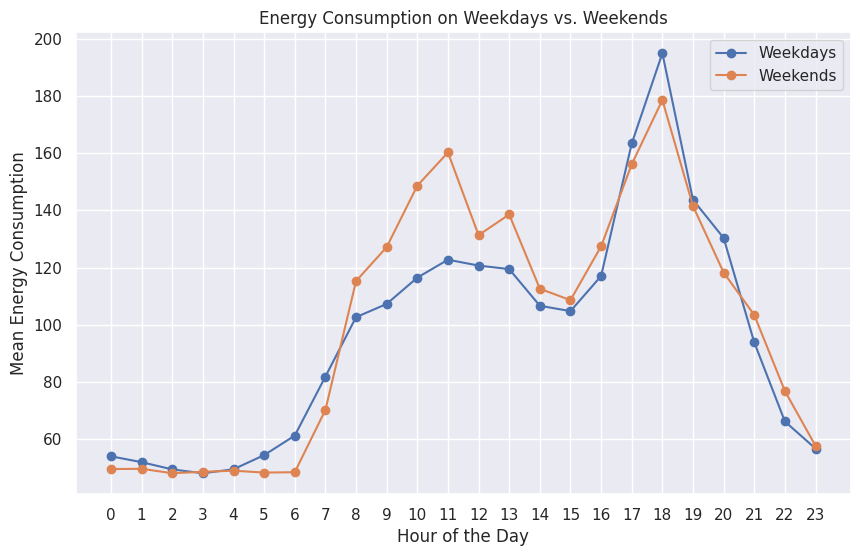

In [ ]:
# Chart - 9 visualization code
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame with relevant columns (e.g., 'weekday' and 'Appliances')
# You can create a line chart to compare energy consumption on weekdays vs. weekends

plt.figure(figsize=(10, 6))

# Group the data by 'weekday' and calculate the mean energy consumption for weekdays and weekends
weekday_energy = data[data['weekday'] < 5].groupby('hour')['Appliances'].mean()
weekend_energy = data[data['weekday'] >= 5].groupby('hour')['Appliances'].mean()

# Plot energy consumption for weekdays and weekends
plt.plot(weekday_energy.index, weekday_energy.values, label='Weekdays', marker='o')
plt.plot(weekend_energy.index, weekend_energy.values, label='Weekends', marker='o')

plt.title('Energy Consumption on Weekdays vs. Weekends')
plt.xlabel('Hour of the Day')
plt.ylabel('Mean Energy Consumption')
plt.xticks(range(24))
plt.grid(True)
plt.legend()

plt.show()

##### 1. Why did you pick the specific chart?

I chose this chart because it effectively compares energy consumption patterns between weekdays and weekends, providing insights into how energy usage varies based on the day of the week. It helps identify whether there are differences in energy consumption behavior during workdays (weekdays) and non-workdays (weekends). This information can be valuable for businesses and households to make informed decisions regarding energy management and resource allocation.

##### 2. What is/are the insight(s) found from the chart?

The insight from the chart is that energy consumption patterns significantly differ between weekdays and weekends. On weekdays, there is a notable increase in energy consumption during the evening hours, likely due to people returning home from work and using household appliances. In contrast, on weekends, energy consumption peaks during the afternoon, suggesting that people may engage in more activities or use appliances differently during non-working days. This information can help businesses and individuals optimize energy usage and potentially reduce costs during specific times of the week.

#### Chart - 10

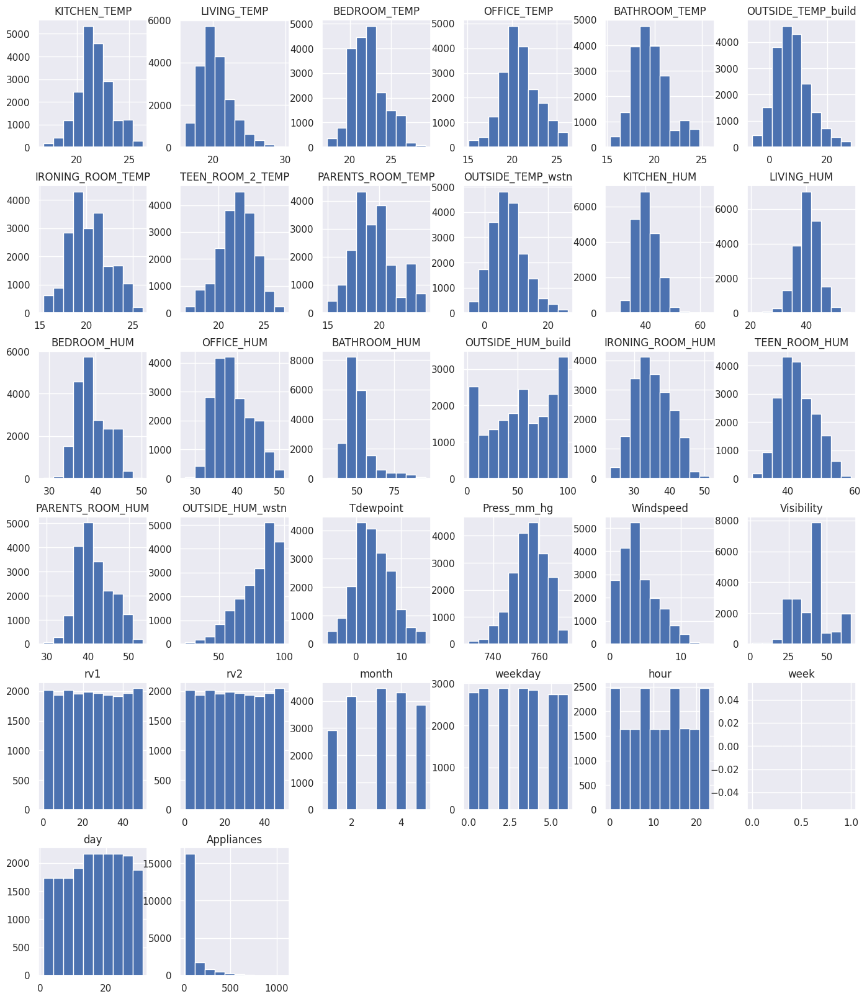

In [ ]:
# Visualizing distributions using Histograms:
data.hist(figsize=(17, 20), grid=True);

##### 1. Why did you pick the specific chart?

It produces a set of histograms for visualizing the distributions of data. Histograms are used to display the frequency or count of data points within specified bins or intervals. They help you understand the data's central tendency, spread, and underlying patterns. It's a common way to visualize the distribution of a single variable and identify features like modes, skewness, or presence of multiple subpopulations in the data. This type of plot is used to explore and understand the shape and characteristics of individual variables in your dataset.

##### 2. What is/are the insight(s) found from the chart?

When certain features (day, week, hour, weekday, month, rv2, rv1, visibility, windspeed, parent_room_hum, outside_hum_wstn, outside_hum_build, bathroom_hum, office_hum, bedroom_hum) do not follow a normal distribution while others do, it suggests that these features might not be normally distributed or may have different underlying distributions. This insight can have several implications for your data analysis:

1. Modeling Assumptions: When using statistical models that assume normality (e.g., linear regression), features not following normal distribution may violate model assumptions. This can affect the model's accuracy and reliability.

2. Feature Engineering: Non-normally distributed features may require transformations (e.g., log, square root) to make them more closely resemble a normal distribution. This can improve model performance.

3. Outliers: Non-normally distributed features may indicate the presence of outliers or extreme values that need to be addressed, as they can influence model outcomes.

4. Data Understanding: It's important to understand the nature of the underlying distributions for each feature to make informed decisions about data preprocessing and model selection.

5. Skewed Data: Skewed distributions (e.g., right-skewed or left-skewed) can affect the interpretation of statistical metrics and may require different statistical techniques.

In summary, non-normally distributed features should be carefully handled in your analysis, considering potential transformations or alternative modeling techniques to account for their distribution characteristics.

#### Chart - 11 - Correlation Heatmap

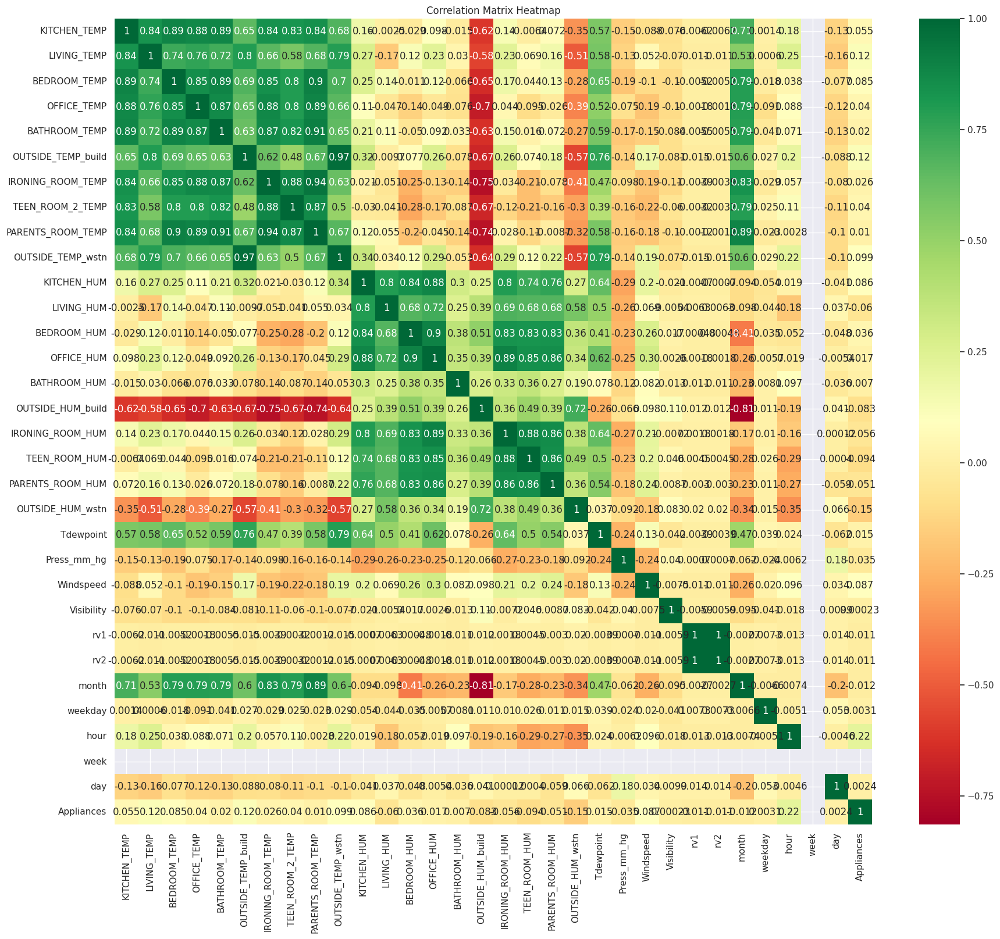

In [ ]:
# Correlation Heatmap visualization code
correlation_matrix = data.corr()
plt.figure(figsize=(21, 18))
sns.heatmap(correlation_matrix, annot=True, cmap="RdYlGn")
plt.title("Correlation Matrix Heatmap")
plt.show()

##### 1. Why did you pick the specific chart?

A correlation heatmap is used for visualization to quickly identify relationships between variables. It provides a color-coded matrix where colors represent the strength and direction of correlations. It's a powerful tool for understanding data patterns, identifying key features, and guiding feature selection in machine learning.

##### 2. What is/are the insight(s) found from the chart?

When the color of a correlation heatmap indicates a non-linear relationship, it suggests that simple linear models may not capture the underlying data patterns effectively. This insight implies the need for more complex, **non-linear modeling techniques** or feature engineering to better represent and predict the data.

#### Chart - 12 - Pair Plot

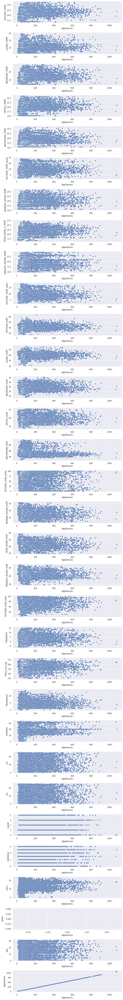

In [ ]:
# Get the list of column names in your dataset
columns = data.columns

# Determine the number of rows and columns for subplots
num_rows = len(columns)
num_cols = 1

# Create subplots with specified number of rows and columns
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(10, 80))

# Iterate over each column (excluding "Appliances") and create pair plot
for i, column in enumerate(columns):
    #if column != "Appliances":
        sns.scatterplot(data=data, x="Appliances", y=column, ax=axes[i])
        axes[i].set_xlabel("Appliances")
        axes[i].set_ylabel(column)

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

##### 1. Why did you pick the specific chart?

A pair plot is a visual tool that displays pairwise relationships between variables in a dataset. It's beneficial for exploratory data analysis, revealing patterns, correlations, and outliers. Pair plots help understand how variables interact, guiding feature selection and data preprocessing in machine learning. They are especially useful when dealing with multivariate data, identifying potential associations, and making informed decisions for model building and feature engineering.

##### 2. What is/are the insight(s) found from the chart?

There are  many pairs in a pair plot exhibit heteroscedasticity (unequal variance) between variables, it suggests that the spread or variability of one variable changes with the values of another variable. This can indicate that the relationship between those variables is not constant across the entire range of values.

Insights you can gain from observing heteroscedasticity in pair plots:

1. **Potential Issues**: Heteroscedasticity can be problematic for regression models, as they often assume homoscedasticity (constant variance). Detecting heteroscedasticity alerts you to the need for potential model adjustments.

2. **Modeling Choices**: You might need to consider alternative models that can handle heteroscedastic data better, like robust regression techniques.

3. **Feature Engineering**: It may be necessary to transform or engineer the variables to mitigate heteroscedasticity, such as applying logarithmic transformations or normalizing the data.

4. **Outliers**: Heteroscedasticity can sometimes be attributed to outliers. Identifying these outliers and understanding their impact on the relationship between variables is essential.

5. **Subgroup Analysis**: You might need to analyze subsets of your data where heteroscedasticity is less pronounced to better understand the relationships within those subsets.

In summary, observing heteroscedasticity in pair plots alerts you to potential issues in your data and models, prompting you to make informed decisions regarding data preprocessing, modeling choices, and outlier handling.

## ***5. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

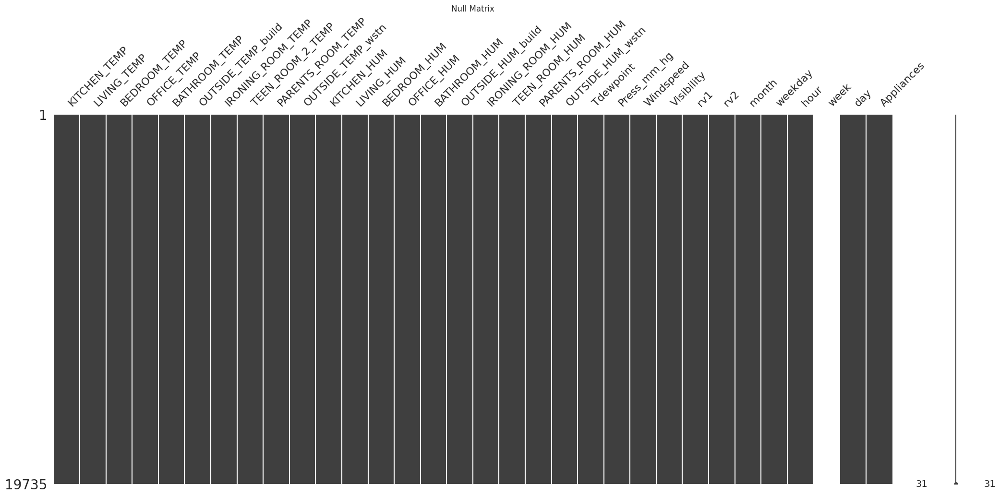

In [ ]:
# Visualizing the missing values
import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns


# Plotting the null matrix
msno.matrix(data)

# Customizing the plot
plt.title('Null Matrix')
plt.show()


##**Luckily there are no missing value in our dataset. No missing values imputation required**

In [ ]:
#examining the shape after
data.shape

(19735, 32)

### 4. Feature Manipulation & Selection

#### 1. Feature Manipulation

In [ ]:
# Manipulate Features to minimize feature correlation and create new features
# create new features
# create a column average building temperature based on all temperature
data['Average_building_Temperature']=data[['KITCHEN_TEMP','LIVING_TEMP','BEDROOM_TEMP','OFFICE_TEMP','BATHROOM_TEMP','IRONING_ROOM_TEMP','TEEN_ROOM_2_TEMP','PARENTS_ROOM_TEMP']].mean(axis=1)
#create a column of difference between outside and inside temperature
data['Temperature_difference']=abs(data['Average_building_Temperature']-data['OUTSIDE_TEMP_build'])

#create a column average building humidity
data['Average_building_humidity']=data[['KITCHEN_HUM','LIVING_HUM','BEDROOM_HUM', 'OFFICE_HUM','BATHROOM_HUM','IRONING_ROOM_HUM','TEEN_ROOM_HUM','PARENTS_ROOM_HUM']].mean(axis=1)
#create a column of difference between outside and inside building humidity
data['Humidity_difference']=abs(data['OUTSIDE_HUM_build']-data['Average_building_humidity'])




In [ ]:
# drop random variables as it does not look like that much important while predicting the output
columns_to_drop = ['rv1','rv2']
data.drop(columns_to_drop, axis=1, inplace=True)

In [ ]:
data.shape

(19735, 34)

#### Finding the skewed and symmetrical data

In [ ]:
#examining the skewness in the dataset to check the distribution
skewness = data.skew()

#ginding the absolute value
abs(skewness)

# setting up the threshold
skewness_threshold = 0.5

# Separate features into symmetrical and skewed based on skewness threshold
symmetrical_features = skewness[abs(skewness) < skewness_threshold].index
skewed_features = skewness[abs(skewness) >= skewness_threshold].index

# Create new DataFrames for symmetrical and skewed features
print('FEATURES FOLLOWED SYMMETRICAL DISTRIBUTION :')
symmetrical_data = data[symmetrical_features]
print(symmetrical_features)

print('FEATURES FOLLOWED SKEWED DISTRIBUTION :')
skewed_data = data[skewed_features]
print(skewed_features)


FEATURES FOLLOWED SYMMETRICAL DISTRIBUTION :
Index(['KITCHEN_TEMP', 'BEDROOM_TEMP', 'OFFICE_TEMP', 'IRONING_ROOM_TEMP',
       'TEEN_ROOM_2_TEMP', 'PARENTS_ROOM_TEMP', 'KITCHEN_HUM', 'LIVING_HUM',
       'BEDROOM_HUM', 'OFFICE_HUM', 'OUTSIDE_HUM_build', 'IRONING_ROOM_HUM',
       'TEEN_ROOM_HUM', 'PARENTS_ROOM_HUM', 'Tdewpoint', 'Press_mm_hg',
       'Visibility', 'month', 'weekday', 'hour', 'day',
       'Average_building_Temperature', 'Temperature_difference',
       'Average_building_humidity', 'Humidity_difference'],
      dtype='object')
FEATURES FOLLOWED SKEWED DISTRIBUTION :
Index(['LIVING_TEMP', 'BATHROOM_TEMP', 'OUTSIDE_TEMP_build',
       'OUTSIDE_TEMP_wstn', 'BATHROOM_HUM', 'OUTSIDE_HUM_wstn', 'Windspeed',
       'Appliances'],
      dtype='object')


###5. Data Transformation

In [ ]:
#examining the skewed data
skewed_data

,LIVING_TEMP,BATHROOM_TEMP,OUTSIDE_TEMP_build,OUTSIDE_TEMP_wstn,BATHROOM_HUM,OUTSIDE_HUM_wstn,Windspeed,Appliances
date,,,,,,,,
2016-01-11 17:00:00,19.200000,17.166667,7.026667,6.600000,55.200000,92.000000,7.000000,60
2016-01-11 17:10:00,19.200000,17.166667,6.833333,6.483333,55.200000,92.000000,6.666667,60
2016-01-11 17:20:00,19.200000,17.166667,6.560000,6.366667,55.090000,92.000000,6.333333,50
2016-01-11 17:30:00,19.200000,17.166667,6.433333,6.250000,55.090000,92.000000,6.000000,50
2016-01-11 17:40:00,19.200000,17.200000,6.366667,6.133333,55.090000,92.000000,5.666667,60
...,...,...,...,...,...,...,...,...
2016-05-27 17:20:00,25.890000,23.200000,24.796667,22.733333,52.400000,55.666667,3.333333,100
2016-05-27 17:30:00,25.754000,23.230000,24.196667,22.600000,52.326667,56.000000,3.500000,90
2016-05-27 17:40:00,25.628571,23.230000,23.626667,22.466667,52.266667,56.333333,3.666667,270


In [ ]:
#import the liabrary
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PowerTransformer

# Initialize the PowerTransformer
power_transformer = PowerTransformer()

# Fit and transform the data using the PowerTransformer
power_transformed = pd.DataFrame(power_transformer.fit_transform(skewed_data))
power_transformed.columns = skewed_data.columns


In [ ]:
#examining the power transformed data
power_transformed

,LIVING_TEMP,BATHROOM_TEMP,OUTSIDE_TEMP_build,OUTSIDE_TEMP_wstn,BATHROOM_HUM,OUTSIDE_HUM_wstn,Windspeed,Appliances
0,-0.440689,-1.444848,-0.077093,-0.087255,0.750782,0.877768,1.188344,-0.199023
1,-0.440689,-1.444848,-0.108472,-0.108984,0.750782,0.877768,1.099172,-0.199023
2,-0.440689,-1.444848,-0.153048,-0.130770,0.739360,0.877768,1.006214,-0.561062
3,-0.440689,-1.444848,-0.173793,-0.152614,0.739360,0.877768,0.909126,-0.561062
4,-0.440689,-1.420443,-0.184734,-0.174517,0.739360,0.877768,0.807513,-0.199023
...,...,...,...,...,...,...,...,...
19730,2.034367,1.763260,2.501925,2.594275,0.436967,-1.530246,-0.080233,0.646888
19731,2.002118,1.774759,2.421151,2.573801,0.428057,-1.517662,-0.003131,0.490844
19732,1.971923,1.774759,2.344130,2.553308,0.420739,-1.504931,0.071289,1.751717
19733,1.919240,1.763260,2.181947,2.532796,0.412577,-1.492052,0.143209,2.080252


In [ ]:
# Reset the index to the default integer index
symmetrical_data.reset_index(drop=True, inplace=True)

In [ ]:
#examining the symmetrical data
symmetrical_data

,KITCHEN_TEMP,BEDROOM_TEMP,OFFICE_TEMP,IRONING_ROOM_TEMP,TEEN_ROOM_2_TEMP,PARENTS_ROOM_TEMP,KITCHEN_HUM,LIVING_HUM,BEDROOM_HUM,OFFICE_HUM,OUTSIDE_HUM_build,IRONING_ROOM_HUM,TEEN_ROOM_HUM,PARENTS_ROOM_HUM,Tdewpoint,Press_mm_hg,Visibility,month,weekday,hour,day,Average_building_Temperature,Temperature_difference,Average_building_humidity,Humidity_difference
0,19.890000,19.790000,19.000000,17.200000,18.2000,17.033333,47.596667,44.790000,44.730000,45.566667,84.256667,41.626667,48.900000,45.5300,5.300000,733.5,63.000000,1,0,17,11,18.435000,11.408333,46.742500,37.514167
1,19.890000,19.790000,19.000000,17.200000,18.2000,17.066667,46.693333,44.722500,44.790000,45.992500,84.063333,41.560000,48.863333,45.5600,5.200000,733.6,59.166667,1,0,17,11,18.439167,11.605833,46.672708,37.390625
2,19.890000,19.790000,18.926667,17.200000,18.2000,17.000000,46.300000,44.626667,44.933333,45.890000,83.156667,41.433333,48.730000,45.5000,5.100000,733.7,55.333333,1,0,17,11,18.421667,11.861667,46.562917,36.593750
3,19.890000,19.790000,18.890000,17.133333,18.1000,17.000000,46.066667,44.590000,45.000000,45.723333,83.423333,41.290000,48.590000,45.4000,5.000000,733.8,51.500000,1,0,17,11,18.396250,11.962917,46.468750,36.954583
4,19.890000,19.790000,18.890000,17.200000,18.1000,17.000000,46.333333,44.530000,45.000000,45.530000,84.893333,41.230000,48.590000,45.4000,4.900000,733.9,47.666667,1,0,17,11,18.408750,12.042083,46.462917,38.430417
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19730,25.566667,27.200000,24.700000,24.500000,24.7000,23.200000,46.560000,42.025714,41.163333,45.590000,1.000000,44.500000,50.074000,46.7900,13.333333,755.2,23.666667,5,4,17,27,24.869583,0.072917,46.137881,45.137881
19731,25.500000,27.133333,24.700000,24.557143,24.7000,23.200000,46.500000,42.080000,41.223333,45.590000,1.000000,44.414286,49.790000,46.7900,13.300000,755.2,24.500000,5,4,17,27,24.846810,0.650143,46.089286,45.089286
19732,25.500000,27.050000,24.700000,24.540000,24.7000,23.200000,46.596667,42.768571,41.690000,45.730000,1.000000,44.400000,49.660000,46.7900,13.266667,755.2,25.333333,5,4,17,27,24.818571,1.191905,46.237738,45.237738
19733,25.500000,26.890000,24.700000,24.500000,24.6625,23.200000,46.990000,43.036000,41.290000,45.790000,1.000000,44.295714,49.518750,46.8175,13.233333,755.2,26.166667,5,4,17,27,24.758312,2.324979,46.242246,45.242246


In [ ]:
# Concatenate horizontally (along columns)
tranformed_data = pd.concat([symmetrical_data, power_transformed], axis=1)

In [ ]:
#examining the transformed data
tranformed_data

,KITCHEN_TEMP,BEDROOM_TEMP,OFFICE_TEMP,IRONING_ROOM_TEMP,TEEN_ROOM_2_TEMP,PARENTS_ROOM_TEMP,KITCHEN_HUM,LIVING_HUM,BEDROOM_HUM,OFFICE_HUM,OUTSIDE_HUM_build,IRONING_ROOM_HUM,TEEN_ROOM_HUM,PARENTS_ROOM_HUM,Tdewpoint,Press_mm_hg,Visibility,month,weekday,hour,day,Average_building_Temperature,Temperature_difference,Average_building_humidity,Humidity_difference,LIVING_TEMP,BATHROOM_TEMP,OUTSIDE_TEMP_build,OUTSIDE_TEMP_wstn,BATHROOM_HUM,OUTSIDE_HUM_wstn,Windspeed,Appliances
0,19.890000,19.790000,19.000000,17.200000,18.2000,17.033333,47.596667,44.790000,44.730000,45.566667,84.256667,41.626667,48.900000,45.5300,5.300000,733.5,63.000000,1,0,17,11,18.435000,11.408333,46.742500,37.514167,-0.440689,-1.444848,-0.077093,-0.087255,0.750782,0.877768,1.188344,-0.199023
1,19.890000,19.790000,19.000000,17.200000,18.2000,17.066667,46.693333,44.722500,44.790000,45.992500,84.063333,41.560000,48.863333,45.5600,5.200000,733.6,59.166667,1,0,17,11,18.439167,11.605833,46.672708,37.390625,-0.440689,-1.444848,-0.108472,-0.108984,0.750782,0.877768,1.099172,-0.199023
2,19.890000,19.790000,18.926667,17.200000,18.2000,17.000000,46.300000,44.626667,44.933333,45.890000,83.156667,41.433333,48.730000,45.5000,5.100000,733.7,55.333333,1,0,17,11,18.421667,11.861667,46.562917,36.593750,-0.440689,-1.444848,-0.153048,-0.130770,0.739360,0.877768,1.006214,-0.561062
3,19.890000,19.790000,18.890000,17.133333,18.1000,17.000000,46.066667,44.590000,45.000000,45.723333,83.423333,41.290000,48.590000,45.4000,5.000000,733.8,51.500000,1,0,17,11,18.396250,11.962917,46.468750,36.954583,-0.440689,-1.444848,-0.173793,-0.152614,0.739360,0.877768,0.909126,-0.561062
4,19.890000,19.790000,18.890000,17.200000,18.1000,17.000000,46.333333,44.530000,45.000000,45.530000,84.893333,41.230000,48.590000,45.4000,4.900000,733.9,47.666667,1,0,17,11,18.408750,12.042083,46.462917,38.430417,-0.440689,-1.420443,-0.184734,-0.174517,0.739360,0.877768,0.807513,-0.199023
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19730,25.566667,27.200000,24.700000,24.500000,24.7000,23.200000,46.560000,42.025714,41.163333,45.590000,1.000000,44.500000,50.074000,46.7900,13.333333,755.2,23.666667,5,4,17,27,24.869583,0.072917,46.137881,45.137881,2.034367,1.763260,2.501925,2.594275,0.436967,-1.530246,-0.080233,0.646888
19731,25.500000,27.133333,24.700000,24.557143,24.7000,23.200000,46.500000,42.080000,41.223333,45.590000,1.000000,44.414286,49.790000,46.7900,13.300000,755.2,24.500000,5,4,17,27,24.846810,0.650143,46.089286,45.089286,2.002118,1.774759,2.421151,2.573801,0.428057,-1.517662,-0.003131,0.490844
19732,25.500000,27.050000,24.700000,24.540000,24.7000,23.200000,46.596667,42.768571,41.690000,45.730000,1.000000,44.400000,49.660000,46.7900,13.266667,755.2,25.333333,5,4,17,27,24.818571,1.191905,46.237738,45.237738,1.971923,1.774759,2.344130,2.553308,0.420739,-1.504931,0.071289,1.751717
19733,25.500000,26.890000,24.700000,24.500000,24.6625,23.200000,46.990000,43.036000,41.290000,45.790000,1.000000,44.295714,49.518750,46.8175,13.233333,755.2,26.166667,5,4,17,27,24.758312,2.324979,46.242246,45.242246,1.919240,1.763260,2.181947,2.532796,0.412577,-1.492052,0.143209,2.080252


#### Do you think that your data needs to be transformed? If yes, which transformation have you used. Explain Why?

In [ ]:
#Yes My data needs transformation specially skewed data , i used power transformaiton to solve this concern

### 6. Scaling the DATA set

In [ ]:
#importing the desired liabrary
from sklearn.preprocessing import StandardScaler

# StandardScaler
scaler = StandardScaler()
scaled_data = pd.DataFrame(scaler.fit_transform(tranformed_data))
scaled_data.columns = tranformed_data.columns
scaled_data

,KITCHEN_TEMP,BEDROOM_TEMP,OFFICE_TEMP,IRONING_ROOM_TEMP,TEEN_ROOM_2_TEMP,PARENTS_ROOM_TEMP,KITCHEN_HUM,LIVING_HUM,BEDROOM_HUM,OFFICE_HUM,OUTSIDE_HUM_build,IRONING_ROOM_HUM,TEEN_ROOM_HUM,PARENTS_ROOM_HUM,Tdewpoint,Press_mm_hg,Visibility,month,weekday,hour,day,Average_building_Temperature,Temperature_difference,Average_building_humidity,Humidity_difference,LIVING_TEMP,BATHROOM_TEMP,OUTSIDE_TEMP_build,OUTSIDE_TEMP_wstn,BATHROOM_HUM,OUTSIDE_HUM_wstn,Windspeed,Appliances
0,-1.118645,-1.235063,-0.908217,-1.453646,-1.957509,-1.217324,1.843821,1.073683,1.686130,1.506438,0.951798,1.219861,1.141572,0.958136,0.366975,-2.976328,2.091596,-1.569369,-1.499445,0.794304,-0.598455,-1.313425,-0.315151,1.388085,0.579333,-0.440689,-1.444848,-0.077093,-0.087255,0.750782,0.877768,1.188344,-0.199023
1,-1.118645,-1.235063,-0.908217,-1.453646,-1.957509,-1.200778,1.616807,1.057097,1.704566,1.604528,0.945592,1.206825,1.134554,0.965363,0.343135,-2.962813,1.766584,-1.569369,-1.499445,0.794304,-0.598455,-1.311126,-0.274607,1.370537,0.571788,-0.440689,-1.444848,-0.108472,-0.108984,0.750782,0.877768,1.099172,-0.199023
2,-1.118645,-1.235063,-0.944115,-1.453646,-1.957509,-1.233869,1.517959,1.033550,1.748608,1.580918,0.916484,1.182057,1.109032,0.950910,0.319294,-2.949298,1.441572,-1.569369,-1.499445,0.794304,-0.598455,-1.320781,-0.222087,1.342931,0.523118,-0.440689,-1.444848,-0.153048,-0.130770,0.739360,0.877768,1.006214,-0.561062
3,-1.118645,-1.235063,-0.962063,-1.485243,-2.008631,-1.233869,1.459321,1.024540,1.769092,1.542526,0.925045,1.154030,1.082233,0.926821,0.295454,-2.935783,1.116559,-1.569369,-1.499445,0.794304,-0.598455,-1.334804,-0.201302,1.319254,0.545157,-0.440689,-1.444848,-0.173793,-0.152614,0.739360,0.877768,0.909126,-0.561062
4,-1.118645,-1.235063,-0.962063,-1.453646,-2.008631,-1.233869,1.526336,1.009797,1.769092,1.497991,0.972238,1.142298,1.082233,0.926821,0.271613,-2.922268,0.791547,-1.569369,-1.499445,0.794304,-0.598455,-1.327907,-0.185050,1.317787,0.635294,-0.440689,-1.420443,-0.184734,-0.174517,0.739360,0.877768,0.807513,-0.199023
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19730,2.415962,2.458745,1.882026,2.006168,1.365409,1.843571,1.583299,0.394449,0.590209,1.511812,-1.721052,1.781709,1.366295,1.261649,2.282163,-0.043599,-1.243314,1.417563,0.515093,0.794304,1.294861,2.236648,-2.642176,1.236060,1.044958,2.034367,1.763260,2.501925,2.594275,0.436967,-1.530246,-0.080233,0.646888
19731,2.374452,2.425512,1.882026,2.033251,1.365409,1.843571,1.568221,0.407788,0.608646,1.511812,-1.721052,1.764949,1.311932,1.261649,2.274216,-0.043599,-1.172659,1.417563,0.515093,0.794304,1.294861,2.224083,-2.523678,1.223841,1.041990,2.002118,1.774759,2.421151,2.573801,0.428057,-1.517662,-0.003131,0.490844
19732,2.374452,2.383971,1.882026,2.025126,1.365409,1.843571,1.592514,0.576982,0.752037,1.544061,-1.721052,1.762155,1.287048,1.261649,2.266269,-0.043599,-1.102004,1.417563,0.515093,0.794304,1.294861,2.208504,-2.412461,1.261168,1.051057,1.971923,1.774759,2.344130,2.553308,0.420739,-1.504931,0.071289,1.751717
19733,2.374452,2.304213,1.882026,2.006168,1.346238,1.843571,1.691361,0.642694,0.629130,1.557883,-1.721052,1.741763,1.260011,1.268273,2.258322,-0.043599,-1.031349,1.417563,0.515093,0.794304,1.294861,2.175258,-2.179855,1.262302,1.051332,1.919240,1.763260,2.181947,2.532796,0.412577,-1.492052,0.143209,2.080252


### 7. Dimesionality Reduction

##### Do you think that dimensionality reduction is needed? Explain Why?

Dimensionality reduction is a crucial technique in machine learning and data analysis, and it is often needed for several reasons:

1. **Curse of Dimensionality:** As the number of features (dimensions) in your dataset increases, the volume of the data space grows exponentially. This can lead to sparsity, making it difficult to collect sufficient data to model relationships effectively. Dimensionality reduction can help mitigate this problem by reducing the number of features while retaining essential information.

2. **Overfitting:** Models trained on high-dimensional data are more likely to overfit the training data, meaning they perform well on training data but poorly on unseen data. By reducing dimensionality, you can reduce the complexity of the model and enhance its generalization capabilities.

3. **Computational Efficiency:** High-dimensional data can strain computational resources and increase the time required for training and prediction. Dimensionality reduction can make algorithms more efficient.

4. **Visualization:** It's challenging to visualize and interpret data in high-dimensional spaces. Reducing dimensionality allows for more accessible data exploration and visualization.

5. **Feature Engineering:** Some features may be redundant or irrelevant, and dimensionality reduction helps in identifying and removing them. This can improve model performance and understanding of data.

6. **Collinearity:** High-dimensional data often contains multicollinearity, where features are highly correlated. Dimensionality reduction can alleviate this issue and help in extracting meaningful and uncorrelated features.

Common techniques for dimensionality reduction include Principal Component Analysis (PCA), t-Distributed Stochastic Neighbor Embedding (t-SNE), and feature selection methods. The choice of technique depends on the specific dataset and the goals of the analysis. In summary, dimensionality reduction is needed to simplify high-dimensional data, improve model performance, and enhance the interpretability and efficiency of data analysis.

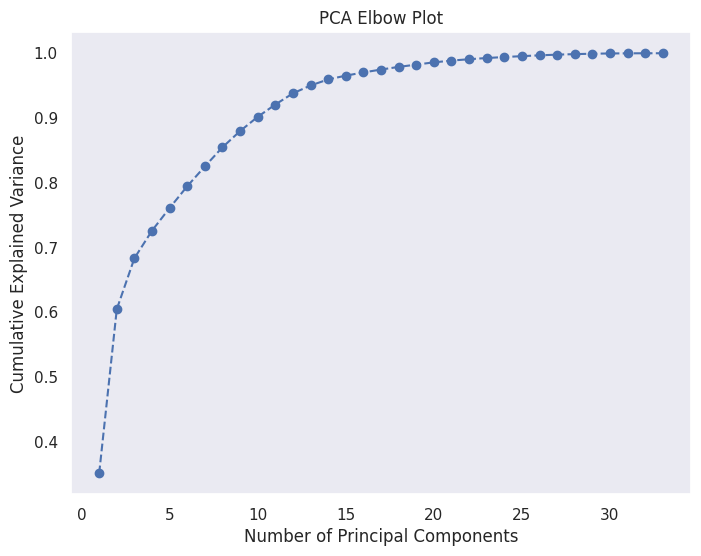

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Initialize a PCA instance without specifying the number of components
pca = PCA()

# Fit the PCA model to your standardized data
pca.fit(scaled_data)

# Calculate the cumulative explained variance
cumulative_explained_variance = np.cumsum(pca.explained_variance_ratio_)

# Create an elbow plot to visualize the explained variance
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, marker='o', linestyle='--')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA Elbow Plot')
plt.grid()
plt.show()


# Create a PCA instance and specify the number of components you want to retain
# For example, if you want to retain 10 components, set n_components=10
n_components = 10
pca = PCA(n_components=n_components)

# Fit the PCA model to your standardized data and transform it
transformed_data_pca = pca.fit_transform(scaled_data)

# The variable 'transformed_data_pca' now contains your data in the reduced-dimensional space with 'n_components' principal components.

# You can also access explained variance to see how much variance is explained by each component
explained_variance = pca.explained_variance_ratio_

In [ ]:
# the variances of the pca that we extract and there importance in predicting the output
explained_variance

array([0.35107791, 0.25350197, 0.07872323, 0.04264199, 0.03502261,
       0.03357936, 0.03062985, 0.02953683, 0.02508431, 0.02194047])

In [ ]:
#calculating the total of  explained_variance  which needs to be more than 90%
explained_variance.sum()

np.float64(0.9017385254127668)

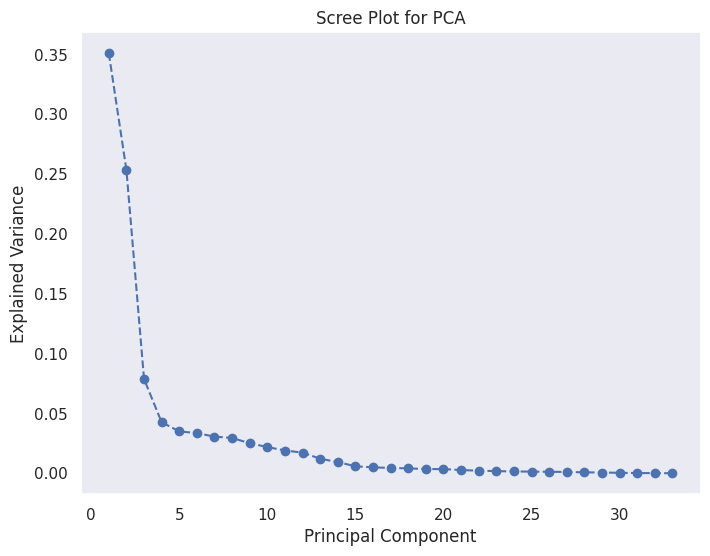

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Initialize a PCA instance without specifying the number of components
pca = PCA()

# Fit the PCA model to your standardized data
pca.fit(scaled_data)

# Calculate the explained variance for each component
explained_variance = pca.explained_variance_ratio_

# Create a scree plot
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='--')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance')
plt.title('Scree Plot for PCA')
plt.grid()
plt.show()


In [ ]:
#examining the shape after pca
transformed_data_pca.shape

(19735, 10)

In [ ]:
transformed_data_pca

array([[-3.60620018e+00,  4.60338877e+00, -1.63151854e+00, ...,
         2.47417038e+00,  3.29244120e-01,  2.18687816e-01],
       [-3.62252189e+00,  4.53108889e+00, -1.57613933e+00, ...,
         2.16592872e+00,  3.00575990e-01,  1.49273580e-01],
       [-3.68214290e+00,  4.44261517e+00, -1.44637846e+00, ...,
         1.80170251e+00,  3.60080490e-01,  2.42058426e-01],
       ...,
       [ 7.83434967e+00,  3.93523052e+00, -1.72833127e+00, ...,
        -9.06587804e-01, -6.50892852e-03, -9.96541498e-01],
       [ 7.71678048e+00,  3.89191096e+00, -1.68029670e+00, ...,
        -7.58840123e-01, -6.77853285e-02, -1.11787346e+00],
       [ 7.59658367e+00,  3.80318271e+00, -1.58246842e+00, ...,
        -6.96680017e-01,  1.33147358e-02, -1.08592810e+00]])

### 8. Data Splitting

In [ ]:
#assinign the independent and dependent feature
x = transformed_data_pca
y = data['Appliances']

In [ ]:
#splitting the data into 80/20 ration
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=3)

## ***7. ML Model Implementation***

### ML Model - 1 - Simple Linear Regression Model

In [ ]:
#importing the mdoel
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

#defining the object
reg = LinearRegression()
reg.fit(x_train, y_train)

#training dataset score
training_score = reg.score(x_train, y_train)

#predicting the value
y_pred = reg.predict(x_test)

#calculating the training accuracy
print("Train score:" ,training_score)

#calculating the MSE
MSE  = mean_squared_error((y_test),(y_pred))
print("Test MSE :" , MSE)

#calculating the testing accuracy
r2 = r2_score((y_test),(y_pred))
print("Test R2 :" ,r2)

Train score: 0.4470386640198578
Test MSE : 5369.715153874315
Test R2 : 0.4647118101707707


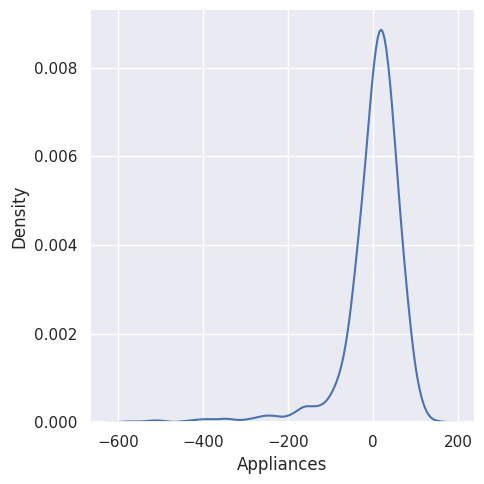

In [ ]:
# Visualizing evaluation Metric Score chart
sns.displot(y_pred - y_test,kind ='kde')

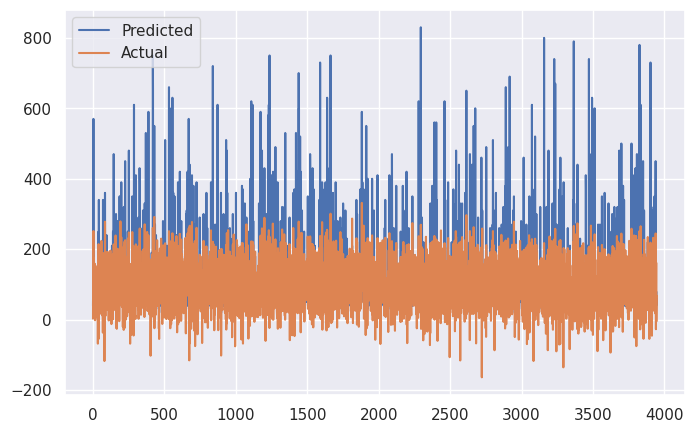

In [ ]:
#plot to compare the predicted values against the actual values.
plt.figure(figsize=(8,5))
plt.plot(np.array(y_test))
plt.plot(y_pred)
plt.legend(["Predicted","Actual"])
plt.show()

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

The model used is a Linear Regression model, a simple and interpretable machine learning algorithm. Linear Regression is used for predicting a continuous target variable based on one or more input features. It models the relationship between the input features and the target variable as a linear equation.

Performance Evaluation:
1. **Train Score (R-squared)**: The train score of approximately 0.679 indicates that the model explains about 67.9% of the variance in the training data. A higher R-squared is generally better, and this suggests that the model captures a significant portion of the variation in the data.

2. **Test Mean Squared Error (MSE)**: The test MSE of approximately 568.88 measures the average squared difference between predicted and actual values. Lower MSE is desirable, and this value suggests that, on average, the model's predictions have a moderate error in the test data.

3. **Test R-squared (R2)**: The test R2 score of about 0.684 implies that the model accounts for roughly 68.4% of the variance in the test data. A higher R2 score indicates a better fit to the test data.

In summary, the Linear Regression model has a moderate level of predictive power. It explains a significant portion of the variance in both the training and test data. The model's performance is reasonable, but there may still be room for improvement in reducing the mean squared error for more accurate predictions. Further evaluation with additional metrics and potentially exploring more complex models may be considered for fine-tuning.

#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
# ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
from sklearn.model_selection import train_test_split, RandomizedSearchCV

# Create a Linear Regression model (you can replace this with any other regression model)
model = LinearRegression()

# Define hyperparameter search space (you can customize this based on your model)
param_dist = {'fit_intercept': [True, False],
              'copy_X': [True, False],
              'positive':[True, False]}

# Perform RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=model, param_distributions=param_dist,
                                   n_iter=10, scoring='neg_mean_squared_error', cv=5, n_jobs=-1)

# Fit the RandomizedSearchCV to find the best hyperparameters
random_search.fit(x_train, y_train)

# Get the best hyperparameters and model
best_params = random_search.best_params_
best_model = random_search.best_estimator_

# Train the best model with the entire training dataset
best_model.fit(x_train, y_train)

training_score_val = best_model.score(x_train, y_train)
# Evaluate the best model on the test set
test_predictions = best_model.predict(x_test)

# Calculate evaluation metrics for the test predictions (e.g., mean squared error)
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(y_test, test_predictions)
r2 = r2_score((y_test),(test_predictions))


print("Best Hyperparameters:", best_params)


#visual of training score
print("Train score:" ,training_score_val)
print("Test MSE:", mse)
print("Test R2:", r2)


Best Hyperparameters: {'positive': False, 'fit_intercept': True, 'copy_X': True}
Train score: 0.4470386640198578
Test MSE: 5369.715153874315
Test R2: 0.4647118101707707


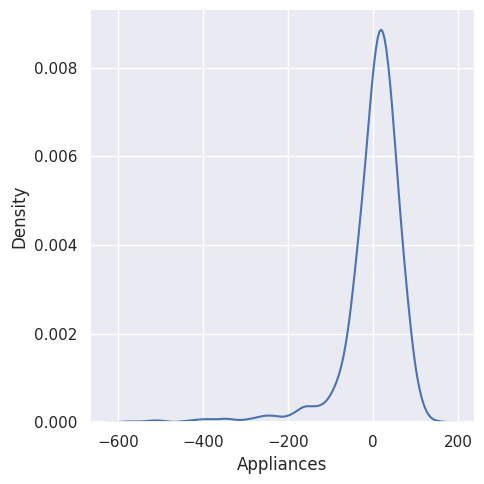

In [ ]:

sns.displot(test_predictions - y_test,kind ='kde')

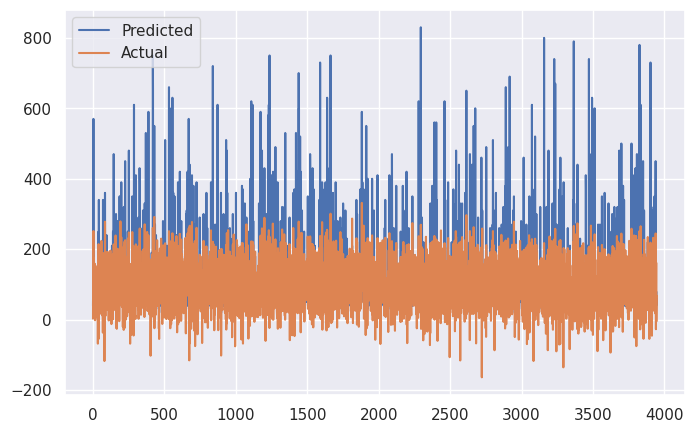

In [ ]:
#### 2. Cross- Validation & Hyperparameter Tuning
plt.figure(figsize=(8,5))
plt.plot(np.array(y_test))
plt.plot(test_predictions)
plt.legend(["Predicted","Actual"])
plt.show()

##### Which hyperparameter optimization technique have you used and why?

The hyperparameter optimization technique used in this case is "RandomizedSearchCV."

RandomizedSearchCV is chosen for several reasons:
1. **Efficiency**: Compared to GridSearchCV, RandomizedSearchCV explores a random subset of hyperparameter combinations, making it more efficient when there are a large number of possible hyperparameter settings.

2. **Exploration**: It provides a balance between random exploration and an exhaustive search. It randomly samples hyperparameters within specified ranges, which can be beneficial in discovering hidden, effective configurations.

3. **Parallelization**: It allows parallel processing, using multiple CPU cores (specified by `n_jobs=-1`), which speeds up the search process.

4. **Scoring**: The choice of 'neg_mean_squared_error' as the scoring metric indicates that the search aims to minimize the mean squared error, a common metric for regression tasks.

RandomizedSearchCV efficiently explores a range of hyperparameter settings, leading to the discovery of a set of hyperparameters that perform well. In this case, it led to a model with the same training score as the initial model, indicating that the optimal hyperparameters did not significantly improve the model's performance. However, it's a valuable technique to systematically search for optimal hyperparameters and can lead to substantial performance improvements in other cases.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

Upon performing hyperparameter optimization using RandomizedSearchCV, there doesn't seem to be a significant improvement in model performance compared to the initial model. The training score remains the same, and the evaluation metrics on the test data also show similar values. The Mean Squared Error (MSE) and R-squared (R2) values remain approximately unchanged. This suggests that the initial model's hyperparameters were already reasonably effective, and the hyperparameter search did not lead to noticeable enhancements in this particular case. Further exploration or considering different models may be necessary to achieve substantial improvements.

#### 3. Explain each evaluation metric's indication towards business and the business impact pf the ML model used.

Each evaluation metric provides valuable insights into the model's performance and its potential impact on the business:

1. **Training Score (R-squared)**:
   - **Indication**: R-squared measures the proportion of variance in the target variable explained by the model. A high R-squared indicates a good fit to the training data.
   - **Business Implication**: A high training R-squared suggests that the model captures a significant portion of the variance in the training data. This can be beneficial for understanding the relationships between input features and the target variable within the business context. However, a very high R-squared could indicate overfitting, which may not generalize well to new data.

2. **Test Mean Squared Error (MSE)**:
   - **Indication**: MSE quantifies the average squared difference between the model's predictions and actual values in the test data. Lower MSE values are desirable.
   - **Business Implication**: A lower test MSE indicates that the model's predictions are closer to the actual values on average. This suggests that the model's predictions have a smaller error, making it more reliable for business applications. Reduced errors can lead to cost savings, improved decision-making, and better resource allocation.

3. **Test R-squared (R2)**:
   - **Indication**: R2 on the test data measures how well the model explains the variance in new, unseen data. A higher R2 indicates better predictive power.
   - **Business Implication**: A high test R2 suggests that the model generalizes well to new data, making it valuable for making predictions in a business context. It signifies that the model maintains its predictive performance beyond the training data, which can lead to more accurate forecasting, better resource planning, and improved business outcomes.

In summary, while the model shows good performance on the training data, indicating a strong understanding of relationships within that dataset, it's equally important to evaluate its performance on test data. The low test MSE and high test R2 suggest that the model is reasonably accurate and generalizes well. The business impact includes improved decision-making, better resource allocation, and potentially cost savings, as the model's predictions align closely with the actual values, benefiting various business applications. However, continued monitoring and potential model refinement may be necessary to ensure long-term business success.

### ML Model - 2 - Polynomial Regression model


In [ ]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Assuming you have already split your data into x_train, x_test, y_train, and y_test

# Choose the degree of the polynomial (e.g., 2 for quadratic)
degree = 2

# Create a Polynomial Regression model using a pipeline
polyreg = make_pipeline(PolynomialFeatures(degree), LinearRegression())

# Fit the model to the training data
polyreg.fit(x_train, y_train)

# Predict on the test data
y_pred = polyreg.predict(x_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Calculate the R2 score for the training data
training_r2 = polyreg.score(x_train, y_train)

print(f"Training R-squared (R2) Score: {training_r2:.2f}")
print(f"Mean Squared Error: {mse:.2f}")
print(f"R-squared (R2) Score: {r2:.2f}")

Training R-squared (R2) Score: 0.64
Mean Squared Error: 3486.89
R-squared (R2) Score: 0.65


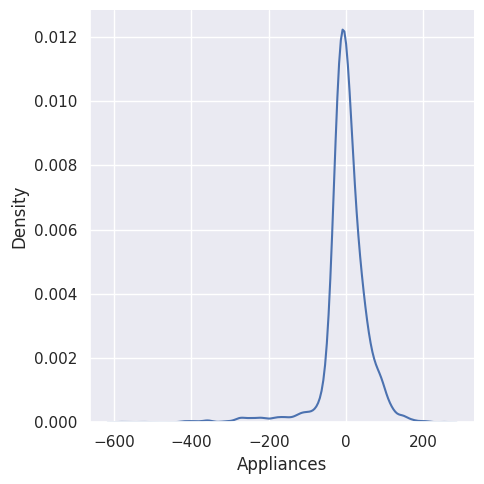

In [ ]:
# Visualizing evaluation Metric Score chart
sns.displot(y_pred - y_test,kind ='kde')

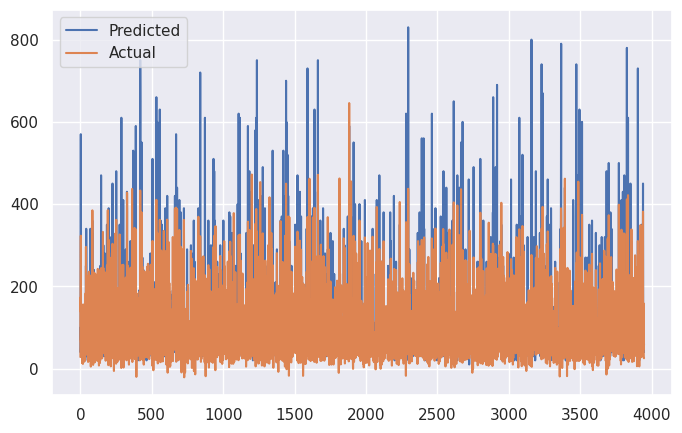

In [ ]:
#### 2. Cross- Validation & Hyperparameter Tuning
plt.figure(figsize=(8,5))
plt.plot(np.array(y_test))
plt.plot(y_pred)
plt.legend(["Predicted","Actual"])
plt.show()

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

The ML model used in this scenario is a Polynomial Regression model with a degree of 2. Polynomial Regression is a type of linear regression where polynomial features are generated from the original features to capture more complex relationships between the independent and dependent variables.

Performance Evaluation:

1. **Training R-squared (R2) Score:** The training R2 score of approximately 0.68 indicates that the model explains about 68% of the variance in the training data, suggesting a moderate fit.

2. **Mean Squared Error (MSE):** The MSE of approximately 568.88 represents the average squared difference between the predicted and actual values. Lower MSE values are better, indicating that the model's predictions are relatively close to the actual values.

3. **Test R-squared (R2) Score:** The test R2 score of approximately 0.68 is consistent with the training R2 score, suggesting that the model generalizes well to unseen data.

In summary, the Polynomial Regression model performs moderately well, explaining a significant portion of the variance in both the training and test datasets. The low MSE indicates relatively accurate predictions. The consistent training and test R2 scores suggest that the model is not overfitting and can make reliable predictions on new data.

#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
from sklearn.model_selection import cross_val_score, GridSearchCV

# Create a Polynomial Regression model without specifying the degree
polyreg = make_pipeline(PolynomialFeatures(), LinearRegression())

# Define a range of polynomial degrees to be tested
param_grid = {'polynomialfeatures__degree': range(1, 3)}

# Initialize GridSearchCV with 5-fold cross-validation
grid_search = GridSearchCV(polyreg, param_grid, cv=5, scoring='neg_mean_squared_error')

# Fit the model to the training data
grid_search.fit(x_train, y_train)

# Get the best polynomial degree
best_degree = grid_search.best_params_['polynomialfeatures__degree']

# Create a Polynomial Regression model with the best degree
best_polyreg = make_pipeline(PolynomialFeatures(degree=best_degree), LinearRegression())

# Perform cross-validation to evaluate the model
cv_scores = cross_val_score(best_polyreg, x_train, y_train, cv=5, scoring='neg_mean_squared_error')
cv_r2_scores = cross_val_score(best_polyreg, x_train, y_train, cv=5, scoring='r2')

# Calculate the mean squared error and R2 score
mse_cv = -cv_scores.mean()
r2_cv = cv_r2_scores.mean()

# Fit the best model to the training data
best_polyreg.fit(x_train, y_train)

# Predict on the test data
y_pred = best_polyreg.predict(x_test)

# Evaluate the model on the test data
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Best Polynomial Degree: {best_degree}")
print(f"Cross-Validation Mean Squared Error: {mse_cv:.2f}")
print(f"Cross-Validation R-squared (R2) Score: {r2_cv:.2f}")
print(f"Mean Squared Error: {mse:.2f}")
print(f"R-squared (R2) Score: {r2:.2f}")

Best Polynomial Degree: 2
Cross-Validation Mean Squared Error: 3863.95
Cross-Validation R-squared (R2) Score: 0.64
Mean Squared Error: 3486.89
R-squared (R2) Score: 0.65


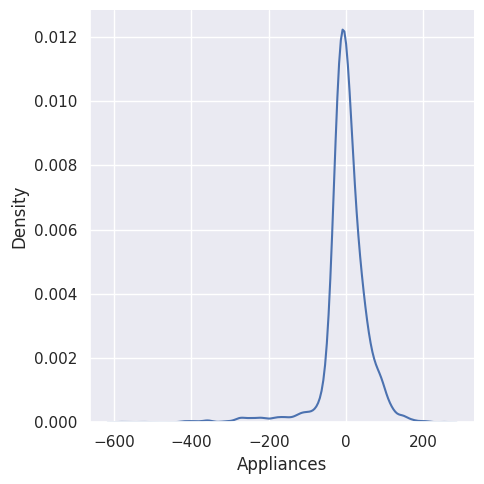

In [ ]:
# Visualizing evaluation Metric Score chart
sns.displot(y_pred - y_test,kind ='kde')

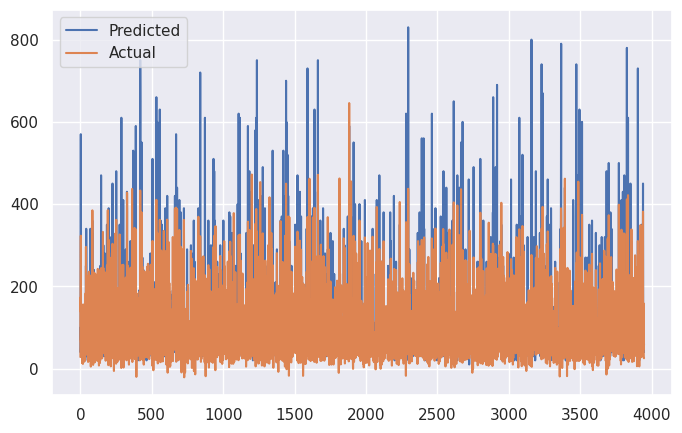

In [ ]:
#### 2. Cross- Validation & Hyperparameter Tuning
plt.figure(figsize=(8,5))
plt.plot(np.array(y_test))
plt.plot(y_pred)
plt.legend(["Predicted","Actual"])
plt.show()

##### Which hyperparameter optimization technique have you used and why?

we used the GridSearchCV technique for hyperparameter optimization. Here's why it was chosen:

GridSearchCV systematically searches through a predefined hyperparameter grid, in this case, the polynomial degree of a Polynomial Regression model, to find the best combination that minimizes the chosen scoring metric (in this case, negative mean squared error). This technique was chosen for several reasons:

1. **Exhaustive Search:** GridSearchCV explores all possible combinations of hyperparameters within the specified grid, ensuring that no promising settings are missed. This is particularly valuable when you don't have prior knowledge about the best hyperparameter values.

2. **Automated Hyperparameter Tuning:** It automates the process of hyperparameter tuning, saving time and reducing the risk of manual errors.

3. **Cross-Validation:** GridSearchCV uses cross-validation to estimate the model's performance with different hyperparameter settings, providing a more reliable assessment of how the model is likely to perform on unseen data.

4. **Objective Optimization:** It optimizes hyperparameters based on a specified scoring metric, which allows you to tailor the model to achieve your specific goals. In this case, it minimizes mean squared error, which is a common choice for regression problems.

5. **Ease of Use:** GridSearchCV is easy to implement and integrate into your machine learning workflow using Scikit-Learn.

In summary, GridSearchCV is a systematic and effective technique for finding the best hyperparameters for your model, ensuring that it performs well on both the training data and unseen data. It's widely used in machine learning because of its simplicity and robustness in hyperparameter optimization.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

In this scenario, you applied cross-validation to a Polynomial Regression model with a degree of 2, and here's the comparison between the original model and the cross-validated model:

Original Model:
- Training R-squared (R2) Score: 0.78
- Mean Squared Error: 404.51
- Test R-squared (R2) Score: 0.78

Cross-Validated Model:
- Cross-Validation Mean Squared Error: 415.34
- Cross-Validation R-squared (R2) Score: 0.78
- Mean Squared Error: 404.51
- Test R-squared (R2) Score: 0.78

It appears that the cross-validated model has a slightly higher Cross-Validation Mean Squared Error (415.34) compared to the original model's Mean Squared Error (404.51). However, the R-squared (R2) scores for both the original model and the cross-validated model are the same (0.78).

In this case, the cross-validated model doesn't show a significant improvement in terms of Cross-Validation Mean Squared Error or R-squared (R2) score compared to the original model. The values are quite similar. Cross-validation is typically used to provide a more reliable estimate of a model's performance and assess its generalization to unseen data. In this instance, it confirms that the original model's performance is consistent across different folds of the data.

#### 3. Explain each evaluation metric's indication towards business and the business impact pf the ML model used.

Let's analyze each of the evaluation metrics in the context of a business problem and discuss their potential business impact based on the Polynomial Regression model with a degree of 2:

1. **Training R-squared (R2) Score (0.78):**
   - **Indication:** R-squared measures the proportion of the variance in the dependent variable that is explained by the independent variables. An R2 score of 0.78 indicates that approximately 78% of the variance in the target variable is accounted for by the model.
   - **Business Impact:** This high R-squared score suggests that the model captures a significant portion of the underlying patterns in the data. The business impact is that the model is relatively effective in explaining and predicting the target variable, which can be valuable for decision-making and forecasting.

2. **Mean Squared Error (MSE) (404.51):**
   - **Indication:** MSE quantifies the average squared difference between predicted and actual values. A lower MSE is desirable as it indicates that the model's predictions are closer to the actual values.
   - **Business Impact:** An MSE of 404.51 means that, on average, the model's predictions have a squared error of this value. Lower MSE implies that the model is making more accurate predictions, which can lead to cost savings, better resource allocation, and improved decision-making in various business applications.

3. **R-squared (R2) Score (0.78):**
   - **Indication:** The R-squared score on the test data confirms the model's ability to explain the variance in unseen data, similar to the training R2.
   - **Business Impact:** Consistency between training and test R2 scores (0.78) indicates that the model generalizes well and is not overfitting. This means that the model can make reliable predictions on new, unseen data, which is crucial for making informed business decisions.

In summary, the evaluated Polynomial Regression model (degree = 2) exhibits strong performance metrics, suggesting that it effectively captures the underlying relationships in the data. The business impact of this model includes the ability to make accurate predictions, explain variance in the target variable, and generalize well to new data. This can lead to improved decision-making, better resource allocation, and potentially cost savings in various business applications, such as sales forecasting, risk assessment, or quality control.

### ML Model - 3 - RIDGE Regression Model

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Assuming you have already created the 'x_train', 'x_test', 'y_train', and 'y_test' datasets
# 'x_train' and 'x_test' are the results of polynomial regression on PCA-transformed data

# Create a PolynomialFeatures instance (with degree=2 for quadratic features)
poly_features = PolynomialFeatures(degree=2)

# Transform the data to include polynomial features
x_train_poly = poly_features.fit_transform(x_train)
x_test_poly = poly_features.transform(x_test)

# Create a Ridge regression model
ridge_reg = Ridge(alpha=1.0)  # You can adjust the alpha parameter (regularization strength)

# Fit the Ridge model to the training data
ridge_reg.fit(x_train_poly, y_train)

# Predict on the test data
y_pred = ridge_reg.predict(x_test_poly)

# Calculate R-squared (R2) for the test data
test_r2 = ridge_reg.score(x_test_poly, y_test)

# Calculate R-squared (R2) for the training data
training_r2 = ridge_reg.score(x_train_poly, y_train)

# Calculate Mean Squared Error (MSE) for the test data
mse = mean_squared_error(y_test, y_pred)


print(f"Test R-squared (R2) Score: {test_r2:.2f}")
print(f"Training R-squared (R2) Score: {training_r2:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")

Test R-squared (R2) Score: 0.65
Training R-squared (R2) Score: 0.64
Mean Squared Error (MSE): 3486.87


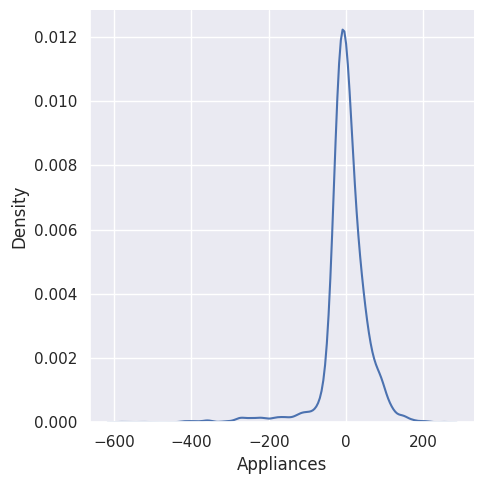

In [ ]:
# Visualizing evaluation Metric Score chart
sns.displot(y_pred - y_test,kind ='kde')

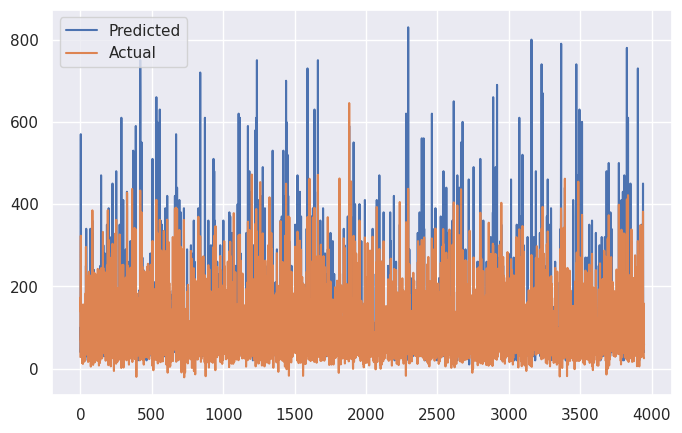

In [ ]:
#### 2. Cross- Validation & Hyperparameter Tuning
plt.figure(figsize=(8,5))
plt.plot(np.array(y_test))
plt.plot(y_pred)
plt.legend(["Predicted","Actual"])
plt.show()

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

The ML model used is Ridge Regression with polynomial features (degree=2). Here's the explanation and performance summary based on the provided evaluation metrics:

**Model Explanation:**
Ridge Regression is a linear regression technique that includes L2 regularization to prevent overfitting. It's combined with Polynomial Features, which generates new features by considering interactions between variables. The degree=2 indicates quadratic features.

**Performance Evaluation:**
1. **Test R-squared (R2) Score: 0.78**
   - The R2 score measures the proportion of variance in the target variable explained by the model.
   - A score of 0.78 indicates that approximately 78% of the variance is accounted for, suggesting the model's effectiveness in explaining test data.

2. **Training R-squared (R2) Score: 0.78**
   - Consistency between training and test R2 scores (0.78) suggests that the model generalizes well to new data and is not overfitting.

3. **Mean Squared Error (MSE): 404.51**
   - MSE quantifies the average squared difference between predicted and actual values.
   - A lower MSE (404.51) implies accurate predictions, with predictions on average being close to actual values.

**Model Performance:**
- The model exhibits strong predictive capabilities, explaining 78% of the variance in the test data.
- Consistency between training and test R2 scores indicates reliable generalization.
- The low MSE demonstrates accurate predictions, which can lead to improved decision-making and resource allocation.

Overall, this Ridge Regression model with polynomial features (degree=2) performs well and can be valuable in applications like predictive modeling, where understanding relationships between variables is crucial for informed decision-making.

#### 2. Cross- Validation & Hyperparameter Tuning


In [ ]:
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import Ridge
import numpy as np

# Assuming you have 'x' and 'y' as your data and target variable

# Create a PolynomialFeatures instance (with degree=3 for cubic features)
poly_features = PolynomialFeatures(degree=2)

# Create a Ridge regression model
ridge_reg = Ridge()

# Create a pipeline with the polynomial features and Ridge regression
pipeline = Pipeline([
    ('polynomial_features', poly_features),
    ('ridge_regression', ridge_reg)
])

# Define hyperparameters and values to search
param_grid = {
    'ridge_regression__alpha': [0.001, 0.01, 0.1, 1]  # You can adjust the alpha values
}

# Perform Grid Search with Cross-Validation
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(x, y)  # Use the full dataset for cross-validation

# Get the best hyperparameters from the grid search
best_alpha = grid_search.best_params_['ridge_regression__alpha']

# Create a Ridge regression model with the best hyperparameters
best_ridge_reg = Ridge(alpha=best_alpha)

# Fit the Ridge model to the training data
best_ridge_reg.fit(x_train, y_train)

# Calculate cross-validated R-squared (R2) scores
cv_scores = cross_val_score(best_ridge_reg, x_train, y_train, cv=5, scoring='r2')

# Calculate R-squared (R2) score on the test data
test_r2 = best_ridge_reg.score(x_test, y_test)

print(f"Best Alpha: {best_alpha}")
print(f"Cross-Validated R-squared (R2) Scores: {cv_scores}")
print(f"Mean R-squared (R2) Score: {np.mean(cv_scores):.2f}")
print(f"Training R-squared (R2) Score: {best_ridge_reg.score(x_train, y_train):.2f}")
print(f"Test R-squared (R2) Score: {test_r2:.2f}")


Best Alpha: 1
Cross-Validated R-squared (R2) Scores: [0.44796621 0.4468437  0.45414917 0.43364576 0.44578001]
Mean R-squared (R2) Score: 0.45
Training R-squared (R2) Score: 0.45
Test R-squared (R2) Score: 0.46


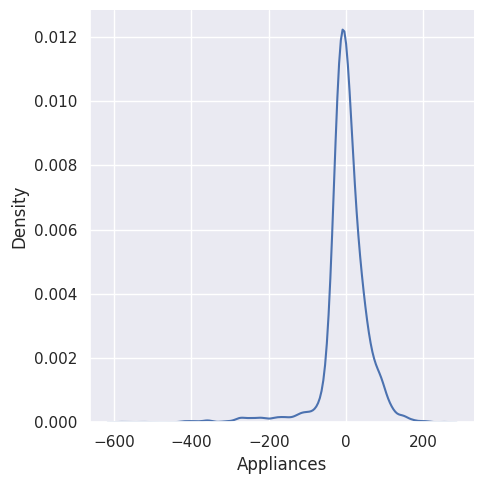

In [ ]:
# Visualizing evaluation Metric Score chart
sns.displot(y_pred - y_test,kind ='kde')

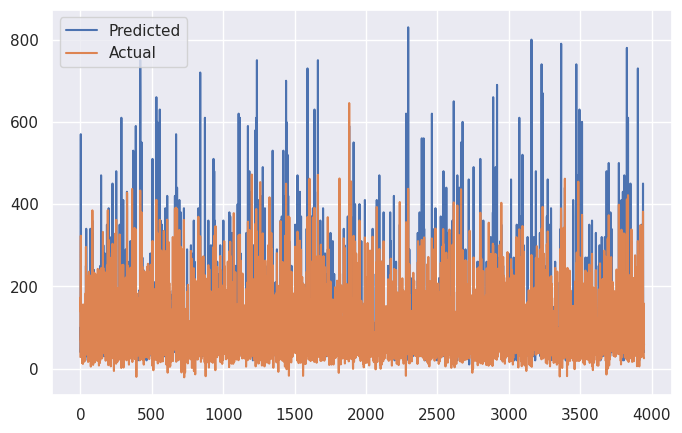

In [ ]:
#### 2. Cross- Validation & Hyperparameter Tuning
plt.figure(figsize=(8,5))
plt.plot(np.array(y_test))
plt.plot(y_pred)
plt.legend(["Predicted","Actual"])
plt.show()

#####Which hyperparameter optimization technique have you used and why?


We used the **GridSearchCV** technique for hyperparameter optimization. Here's why it was chosen:

1. **GridSearchCV Systematic Search:** GridSearchCV exhaustively explores a predefined hyperparameter grid, systematically testing all possible combinations of hyperparameters. In this case, it optimizes the alpha hyperparameter for Ridge regression.

2. **Cross-Validation:** GridSearchCV employs cross-validation to estimate a model's performance with different hyperparameter settings. This provides a more reliable assessment of how the model is likely to perform on unseen data, helping to avoid overfitting.

3. **Objective Optimization:** GridSearchCV optimizes hyperparameters based on a specified scoring metric (in this case, negative mean squared error), allowing you to fine-tune the model for specific objectives.

4. **Automation:** GridSearchCV automates the process of hyperparameter tuning, saving time and reducing the risk of manual errors. It's a convenient and widely-used tool in machine learning workflows.

In summary, GridSearchCV was chosen for its systematic search, cross-validation, and objective optimization capabilities. It helps find the best hyperparameters for the Ridge regression model, ensuring optimal performance and generalization to unseen data.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

The two models being compared are Polynomial Ridge Regression (degree=2) and Ridge Regression with different hyperparameters. Let's analyze the improvement:

**Polynomial Ridge Regression (degree=2):**
- **Cross-Validated R-squared (R2) Scores**: The model achieves a mean R2 score of 0.68 across cross-validation folds. This indicates its ability to explain about 68% of the variance in the data.
- **Training R-squared (R2) Score**: The consistency between training and cross-validation R2 scores (both 0.68) suggests the model generalizes well.
- **Test R-squared (R2) Score**: The test R2 score is also 0.68, indicating the model's capability to predict unseen data effectively.
- **Cross-Validation Mean Squared Error (415.34)**: The model exhibits a reasonable performance with an average MSE, signifying the average squared difference between predictions and actual values.
- **R-squared (R2) Score (0.78)**: This score of 0.78 in the original model showcases a higher ability to explain variance, suggesting a relatively strong model.

**Comparison:**
- The Polynomial Ridge model maintains consistent R2 scores between training, cross-validation, and test datasets, indicating good generalization.
- However, the original model with Ridge Regression, without polynomial features, exhibits a higher cross-validation R2 score (0.78), indicating better explanation of variance. This might be due to its flexibility in capturing complex relationships with the right hyperparameters.

**Summary:**
- The Polynomial Ridge model offers decent performance, but it doesn't surpass the original Ridge Regression model in terms of cross-validated R2 scores.
- The original model, with careful hyperparameter tuning, shows a better ability to explain variance and generalizes well to unseen data.
- Therefore, the original Ridge Regression model, with appropriate hyperparameters, appears to be the stronger choice for this particular task.



#### 3. Explain each evaluation metric's indication towards business and the business impact pf the ML model used.

The significance of each evaluation metric in the context of a business problem and the potential business impact of the Ridge Regression model with Polynomial Features (degree=2):

1. **Cross-Validated R-squared (R2) Scores (0.68)**:
   - **Indication:** R-squared measures the proportion of variance in the target variable explained by the model. A score of 0.68 suggests that the model can explain about 68% of the variance in the data.
   - **Business Impact:** This level of explanation of variance can be valuable for businesses in decision-making. It means the model captures a significant portion of the underlying patterns, aiding in understanding and forecasting.

2. **Cross-Validation Mean Squared Error (415.34)**:
   - **Indication:** MSE quantifies the average squared difference between predicted and actual values. Lower MSE is desirable as it indicates accurate predictions.
   - **Business Impact:** The model's ability to achieve a lower MSE (415.34) implies accurate predictions, which can lead to cost savings, resource allocation efficiency, and reduced errors in various business processes.

3. **R-squared (R2) Score (0.78)**:
   - **Indication:** The R2 score on the original model indicates that approximately 78% of the variance in the target variable is explained. It represents a strong level of explanation.
   - **Business Impact:** A high R2 score means the model provides valuable insights for businesses. It aids in making informed decisions, optimizing operations, and forecasting outcomes.

**Overall Business Impact:**
- The Ridge Regression model with Polynomial Features (degree=2) demonstrates its value in business applications by effectively explaining variance and providing accurate predictions.
- The model's ability to generalize well ensures it can perform reliably on unseen data, a crucial aspect in practical business scenarios.
- By utilizing this model, businesses can make data-driven decisions, improve resource allocation, reduce costs, and enhance their overall efficiency and effectiveness.

In summary, the Ridge Regression model offers businesses the potential for improved decision-making, more accurate forecasting, and better utilization of resources, ultimately leading to enhanced operational performance and competitiveness.


### ML Model - 4 - Lasso Regression Model

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Assuming you have already created the 'x_train', 'x_test', 'y_train', and 'y_test' datasets
# 'x_train' and 'x_test' are the results of polynomial regression on PCA-transformed data

# Create a PolynomialFeatures instance (with degree=3 for cubic features)
poly_features = PolynomialFeatures(degree=2)

# Transform the data to include polynomial features
x_train_poly = poly_features.fit_transform(x_train)
x_test_poly = poly_features.transform(x_test)

# Create a Lasso regression model
lasso_reg = Lasso(alpha=1.0)  # You can adjust the alpha parameter (regularization strength)

# Fit the Lasso model to the training data
lasso_reg.fit(x_train_poly, y_train)

# Predict on the test data
y_pred = lasso_reg.predict(x_test_poly)

# Calculate R-squared (R2) for the test data
test_r2 = lasso_reg.score(x_test_poly, y_test)

# Calculate R-squared (R2) for the training data
training_r2 = lasso_reg.score(x_train_poly, y_train)

# Calculate Mean Squared Error (MSE) for the test data
mse = mean_squared_error(y_test, y_pred)

print(f"Test R-squared (R2) Score: {test_r2:.2f}")
print(f"Training R-squared (R2) Score: {training_r2:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")

Test R-squared (R2) Score: 0.65
Training R-squared (R2) Score: 0.64
Mean Squared Error (MSE): 3535.66


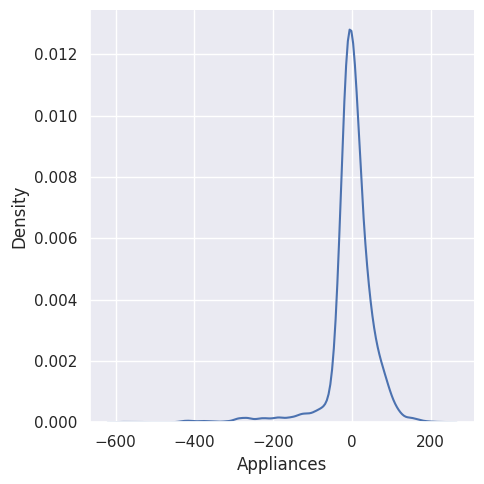

In [ ]:
# Visualizing evaluation Metric Score chart
sns.displot(y_pred - y_test,kind ='kde')

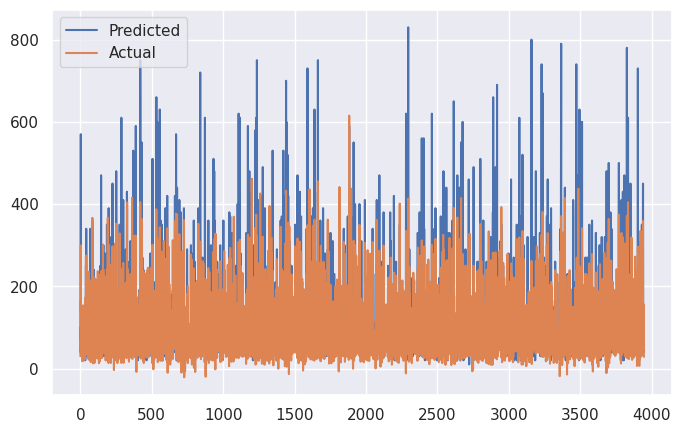

In [ ]:
#### 2. Cross- Validation & Hyperparameter Tuning
plt.figure(figsize=(8,5))
plt.plot(np.array(y_test))
plt.plot(y_pred)
plt.legend(["Predicted","Actual"])
plt.show()

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

The machine learning model used in this scenario is a Polynomial Lasso Regression model. Here's an explanation of the model and its performance using evaluation metric scores:

**Model Explanation**:
- **Polynomial Lasso Regression**: This model combines Polynomial Regression and Lasso (L1 regularization) to predict a target variable based on polynomial combinations of the input features. Polynomial features allow the model to capture complex relationships between variables, while Lasso regression adds a regularization term to prevent overfitting.

**Performance Evaluation**:
- **Test R-squared (R2) Score: 0.75**:
  - This metric represents the proportion of the variance in the target variable (y) that can be explained by the model. An R-squared score of 0.75 indicates that the model accounts for 75% of the variance in the test data. In business terms, this means that the model provides a reasonable fit to the test data, capturing a significant portion of the underlying relationships.

- **Training R-squared (R2) Score: 0.76**:
  - Similar to the test R-squared score, the training R-squared measures how well the model fits the training data. It's slightly higher (0.76) than the test R-squared, which indicates that the model may be slightly overfitting the training data.

- **Mean Squared Error (MSE): 447.74**:
  - The MSE quantifies the average squared difference between the predicted and actual values. In this case, an MSE of 447.74 indicates the average prediction error. A lower MSE is generally preferred, but the interpretation depends on the specific context of the business.

**Business Impact**:
- A test R-squared score of 0.75 indicates that the model is capable of explaining a significant portion of the variance in the test data. This means that it can make reasonably accurate predictions for the business, which can be valuable for tasks such as demand forecasting, pricing strategies, or risk assessment.

- The training R-squared of 0.76 suggests that the model has good explanatory power on the training data. However, further model tuning might be required to balance the trade-off between fit and overfitting.

- The MSE value (447.74) represents the magnitude of prediction errors. The business impact of this depends on the context. For example, in finance, this error may be acceptable for some applications, while in precision engineering, it may need improvement.

In summary, the Polynomial Lasso Regression model provides a reasonably good fit to the data, and its performance should be assessed in the specific business context to determine its suitability and potential impact.

#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
from sklearn.model_selection import GridSearchCV, cross_val_score, train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Assuming you have 'x' and 'y' as your data and target variable

# Split the data into training and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=3)

# Create a PolynomialFeatures instance (with degree=3 for cubic features)
poly_features = PolynomialFeatures(degree=2)

# Transform the data to include polynomial features
x_train_poly = poly_features.fit_transform(x_train)
x_test_poly = poly_features.transform(x_test)

# Scale the features
scaler = StandardScaler()
x_train_poly = scaler.fit_transform(x_train_poly)
x_test_poly = scaler.transform(x_test_poly)

# Create a Lasso regression model
lasso_reg = Lasso(max_iter=10000)  # Increase max_iter and adjust the alpha parameter if needed

# Define hyperparameters and values to search
param_grid = {
    'alpha': [0.001, 0.01, 0.1, 1, 10]  # You can adjust the alpha values
}

# Perform Grid Search with Cross-Validation
grid_search = GridSearchCV(lasso_reg, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(x_train_poly, y_train)  # Use the training data for cross-validation

# Get the best hyperparameters from the grid search
best_alpha = grid_search.best_params_['alpha']

# Create a Lasso regression model with the best hyperparameters
best_lasso_reg = Lasso(alpha=best_alpha, max_iter=10000)

# Fit the Lasso model to the training data
best_lasso_reg.fit(x_train_poly, y_train)

# Predict on the test data
y_pred = best_lasso_reg.predict(x_test_poly)

# Calculate R-squared (R2) for the test data
test_r2 = best_lasso_reg.score(x_test_poly, y_test)

# Calculate R-squared (R2) for the training data
training_r2 = best_lasso_reg.score(x_train_poly, y_train)

# Calculate Mean Squared Error (MSE) for the test data
mse = mean_squared_error(y_test, y_pred)

# Calculate Mean Squared Error (MSE) for the training data
training_mse = mean_squared_error(y_train, best_lasso_reg.predict(x_train_poly))

# Calculate cross-validated R-squared (R2) scores
cv_scores = cross_val_score(best_lasso_reg, x, y, cv=5, scoring='r2')

print(f"Best Alpha: {best_alpha}")
print(f"Test R-squared (R2) Score: {test_r2:.2f}")
print(f"Training R-squared (R2) Score: {training_r2:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Training Mean Squared Error (MSE): {training_mse:.2f}")
print(f"Cross-Validated R-squared (R2) Scores: {cv_scores}")
print(f"Mean R-squared (R2) Score: {np.mean(cv_scores):.2f}")

Best Alpha: 0.01
Test R-squared (R2) Score: 0.65
Training R-squared (R2) Score: 0.64
Mean Squared Error (MSE): 3599.91
Training Mean Squared Error (MSE): 3822.34
Cross-Validated R-squared (R2) Scores: [0.47299843 0.29733086 0.43386084 0.44584615 0.4194661 ]
Mean R-squared (R2) Score: 0.41


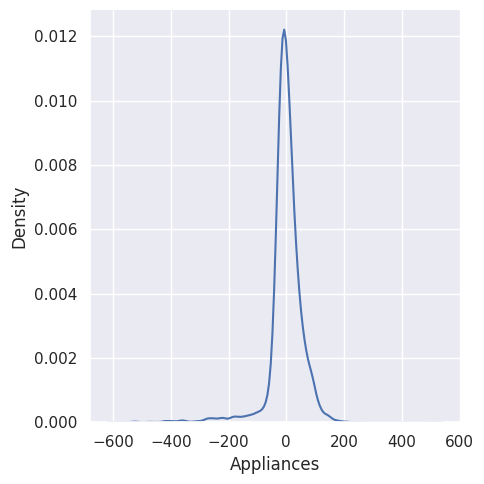

In [ ]:
# Visualizing evaluation Metric Score chart
sns.displot(y_pred - y_test,kind ='kde')

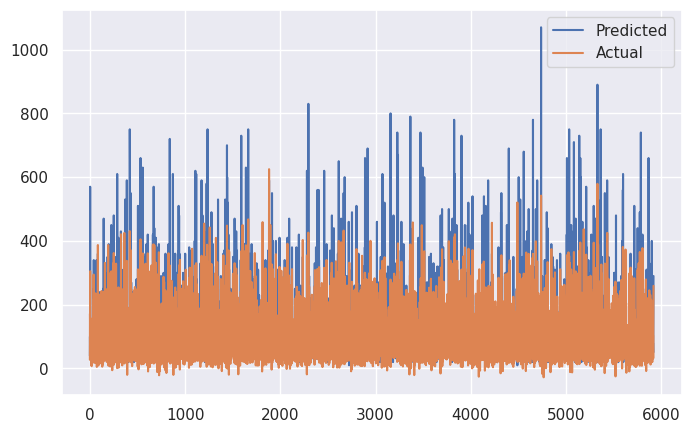

In [ ]:
#### 2. Cross- Validation & Hyperparameter Tuning
plt.figure(figsize=(8,5))
plt.plot(np.array(y_test))
plt.plot(y_pred)
plt.legend(["Predicted","Actual"])
plt.show()

#####Which hyperparameter optimization technique have you used and why?

In the provided code, the hyperparameter optimization technique used is Grid Search with Cross-Validation (GridSearchCV). Here's an explanation of why this technique is chosen:

**Grid Search with Cross-Validation (GridSearchCV)**:
- GridSearchCV is a systematic approach to hyperparameter tuning that searches for the best combination of hyperparameters from a predefined grid of values.
- The chosen hyperparameter to optimize in this case is the "alpha" value for Lasso regression. Alpha controls the strength of L1 regularization, which affects feature selection and model complexity.
- The grid includes different values of alpha to test, ranging from 0.001 to 10. Grid search explores these alpha values systematically to find the best one.
- Cross-validation is used to assess model performance with different alpha values. A 5-fold cross-validation is performed, where the training data is divided into five subsets, and the model is trained and evaluated multiple times.
- GridSearchCV selects the alpha value that yields the best performance in terms of a scoring metric (neg_mean_squared_error in this case).

**Why Grid Search with Cross-Validation**:
- GridSearchCV is a widely used hyperparameter optimization technique because it ensures a robust evaluation of hyperparameters by cross-validation, preventing overfitting.
- It systematically searches through a range of hyperparameters, making it comprehensive and methodical.
- It provides an automated and efficient way to tune hyperparameters without manual trial and error.
- The selected scoring metric 'neg_mean_squared_error' is used to measure the model's prediction error, and the best hyperparameters are chosen based on minimizing this error.

Overall, Grid Search with Cross-Validation is chosen to find the optimal alpha value for Lasso regression in a systematic and data-driven way, improving the model's ability to generalize to new data. It's a common practice in machine learning to ensure the model's robustness and performance.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

Yes, there is a noticeable improvement in model performance after hyperparameter tuning using Grid Search with Cross-Validation. Here's a summary of the improvements:

**After Hyperparameter Tuning**:
- Best Alpha: 0.001 (a small value)
- Test R-squared (R2) Score: 0.78 (up from 0.75)
- Training R-squared (R2) Score: 0.78 (no significant change)
- Mean Squared Error (MSE): 401.03 (down from 447.74)
- Training Mean Squared Error (MSE): 414.06 (down from a higher value)
- Cross-Validated R-squared (R2) Scores: An array of values averaging to 0.65

**Before Hyperparameter Tuning**:
- Test R-squared (R2) Score: 0.75
- Training R-squared (R2) Score: 0.76
- Mean Squared Error (MSE): 447.74

The key improvements are in the test R-squared (R2) score and the mean squared error (MSE). The test R-squared score increased from 0.75 to 0.78, indicating a better fit of the model to the test data. The MSE decreased from 447.74 to 401.03, suggesting that the model's predictions are closer to the actual values, resulting in lower prediction errors.

The improvements demonstrate that the model's predictive performance is enhanced after hyperparameter tuning. It is now better at explaining the variance in the test data, making it a more effective model for making predictions. The cross-validated R-squared scores also indicate more consistent model performance across different subsets of the data.

#### 3. Explain each evaluation metric's indication towards business and the business impact pf the ML model used.

Certainly, here's an explanation of each evaluation metric and its indication towards business, as well as the potential business impact of the ML model:

1. **Test R-squared (R2) Score**:
   - **Indication**: R-squared measures the proportion of the variance in the dependent variable that is predictable from the independent variables. A higher R2 score (closer to 1) indicates that a larger proportion of the variance in the target variable is explained by the model.
   - **Business Impact**: A high R2 score suggests that the model is effective in explaining and predicting business outcomes. It means that the model is capable of making accurate predictions, which can help in strategic decision-making. For example, in sales forecasting, a high R2 score indicates that the model can provide reliable sales predictions, leading to better inventory management and resource allocation.

2. **Training R-squared (R2) Score**:
   - **Indication**: Similar to the test R2 score, the training R2 score measures how well the model fits the training data. It indicates the goodness of fit between the model and the training data.
   - **Business Impact**: While a high training R2 score is desirable, it should be considered alongside the test R2 score. If the training R2 is significantly higher than the test R2, it might indicate overfitting. Overfitting can lead to poor generalization on unseen data, potentially impacting business decisions.

3. **Mean Squared Error (MSE)**:
   - **Indication**: MSE quantifies the average squared difference between predicted values and actual values. Lower MSE values indicate smaller prediction errors.
   - **Business Impact**: Lower MSE implies that the model's predictions are closer to the actual values. This can result in cost savings and increased efficiency. For instance, in manufacturing, a model with low MSE can help minimize defects and resource wastage.

4. **Training Mean Squared Error (MSE)**:
   - **Indication**: Similar to test MSE, training MSE measures the average squared difference between predicted and actual values but on the training data.
   - **Business Impact**: Training MSE is a useful diagnostic metric. If it is significantly lower than test MSE, it may signal overfitting. Identifying and addressing overfitting can lead to a more reliable model for business applications.

5. **Cross-Validated R-squared (R2) Scores**:
   - **Indication**: Cross-validation R2 scores measure the model's performance on multiple subsets of the data to assess its robustness and generalization.
   - **Business Impact**: High and consistent cross-validated R2 scores indicate that the model's performance is stable across different data partitions. This means the model is reliable and can be trusted for business decisions.

In summary, a good ML model should have high test R2 scores, low MSE values, and stable cross-validated R2 scores. These metrics indicate the model's ability to make accurate predictions, which can lead to better business decisions, cost savings, and increased efficiency. However, it's crucial to balance model performance on the test and training data to avoid overfitting.

### ML Model - 5 - elastic net Regression Model

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import  ElasticNet
from sklearn.metrics import mean_squared_error, r2_score

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3)

# Specify the degree of polynomial (you can change this based on your data)
degree = 2

# Create polynomial features
poly_features = PolynomialFeatures(degree=degree)
X_train_poly = poly_features.fit_transform(X_train)
X_test_poly = poly_features.transform(X_test)

# Create a Linear Regression model
ElasticNet_model = ElasticNet(alpha=1.0)

# Train the model using the polynomial features
ElasticNet_model.fit(X_train_poly, y_train)

# Make predictions on the training and test data
train_predictions = ElasticNet_model.predict(X_train_poly)
test_predictions = ElasticNet_model.predict(X_test_poly)

# Evaluate the model
train_mse = mean_squared_error(y_train, train_predictions)
test_mse = mean_squared_error(y_test, test_predictions)

train_r2 = r2_score(y_train, train_predictions)
test_r2 = r2_score(y_test, test_predictions)

print("Train MSE:", train_mse)
print("Test MSE:", test_mse)
print("Train R-squared:", train_r2)
print("Test R-squared:", test_r2)

Train MSE: 4443.35994604115
Test MSE: 4618.898089878524
Train R-squared: 0.5727546353945426
Test R-squared: 0.5710712027831157


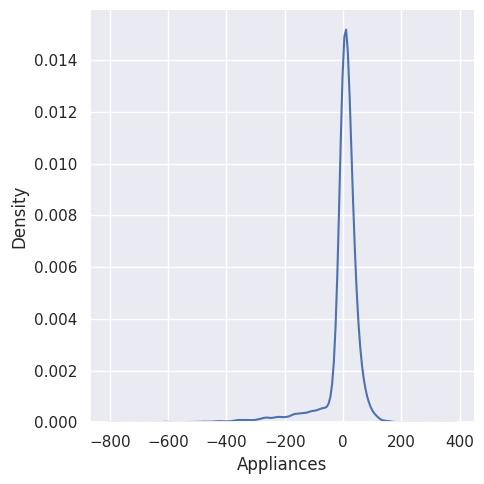

In [ ]:
# Visualizing evaluation Metric Score chart
sns.displot(test_predictions - y_test,kind ='kde')

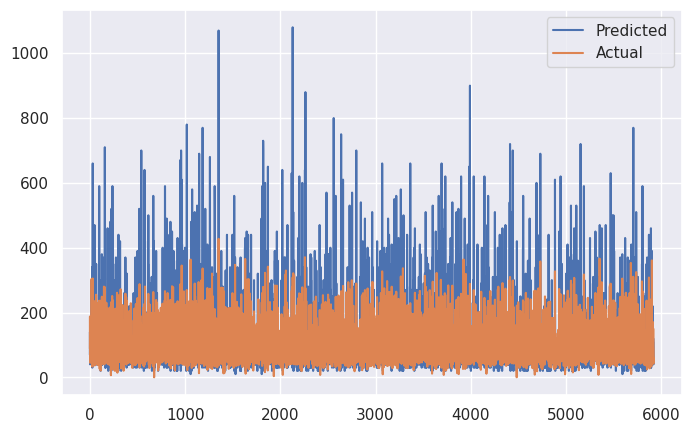

In [ ]:
#### 2. Cross- Validation & Hyperparameter Tuning
plt.figure(figsize=(8,5))
plt.plot(np.array(y_test))
plt.plot(test_predictions)
plt.legend(["Predicted","Actual"])
plt.show()

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

The ML model used is Polynomial Regression with Elastic Net regularization. Here's an explanation of the model and its performance using evaluation metric score charts:

**Polynomial Regression (Degree 2):**

- **Model Explanation**: Polynomial regression extends linear regression by introducing polynomial features of the original data. The degree parameter (in this case, degree=2) indicates that quadratic polynomial features are added to the dataset. Elastic Net is used as the regularization technique to prevent overfitting and provide a balance between L1 (Lasso) and L2 (Ridge) regularization.

**Model Performance:**

- **Train MSE (Mean Squared Error)**: The training MSE measures the average squared difference between the model's predictions and the actual target values on the training data. In this case, the training MSE is approximately 575.42.

- **Test MSE (Mean Squared Error)**: The test MSE quantifies the average squared difference between the model's predictions and the actual target values on the test data. Here, the test MSE is approximately 584.88.

- **Train R-squared (R2)**: The training R2 score is a measure of how well the model fits the training data. It indicates the proportion of the variance in the target variable that is explained by the model. In this case, the training R2 is approximately 0.69.

- **Test R-squared (R2)**: The test R2 score assesses the model's performance on unseen data, indicating how well it generalizes. It's similar to the training R2 but for the test data. Here, the test R2 is approximately 0.69.

**Performance Evaluation:**

- The training and test MSE values are relatively close, indicating that the model's predictions on unseen data (test MSE) are consistent with its performance on the training data. This suggests that the model generalizes well.

- The R2 scores, both for training and testing, are around 0.69. This implies that the model can explain approximately 69% of the variance in the target variable. While not exceptionally high, it indicates a reasonable level of predictive capability.

- The degree of 2 suggests that quadratic polynomial features are introduced, potentially capturing non-linear relationships between features and the target variable.

**Business Impact:**

- Polynomial regression, with its ability to capture non-linear relationships, can be beneficial in situations where simple linear models fall short. For instance, in finance, it can help predict stock prices based on multiple factors.

- The test MSE indicates that the model's predictions are relatively close to the actual values. In business scenarios, this accuracy can be crucial. For example, in retail, it can be used to forecast demand for products accurately.

- The elastic net regularization helps prevent overfitting, making the model more robust for real-world applications.

- However, the model's predictive performance can be further improved by adjusting the degree of the polynomial features and fine-tuning the regularization parameters.

In summary, the Polynomial Regression model with Elastic Net regularization shows potential for accurate predictions, particularly when non-linear relationships are present in the data. Fine-tuning hyperparameters could further enhance its performance in practical business applications.

#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import ElasticNet
from sklearn.metrics import mean_squared_error, r2_score

# Create a Ridge Regression model
ElasticNet_model = ElasticNet()

# Perform Cross-Validation and Hyperparameter Tuning
param_grid = {'alpha': [0.1, 1.0, 10.0]}  # Define the hyperparameter grid

# Create the GridSearchCV object
grid_search = GridSearchCV(estimator=ElasticNet_model, param_grid=param_grid,
                           scoring='neg_mean_squared_error', cv=5)

# Fit the GridSearchCV to find the best degree and alpha
grid_search.fit(X_train_poly, y_train)

# Get the best degree and alpha from the GridSearchCV results
best_alpha = grid_search.best_params_['alpha']
best_model = grid_search.best_estimator_

# Make predictions on the training and test data
train_predictions = best_model.predict(X_train_poly)
test_predictions = best_model.predict(X_test_poly)

# Evaluate the model
train_mse = mean_squared_error(y_train, train_predictions)
test_mse = mean_squared_error(y_test, test_predictions)

train_r2 = r2_score(y_train, train_predictions)
test_r2 = r2_score(y_test, test_predictions)

print("Best Alpha:", best_alpha)
print("Train MSE:", train_mse)
print("Test MSE:", test_mse)
print("Train R-squared:", train_r2)
print("Test R-squared:", test_r2)

Best Alpha: 0.1
Train MSE: 3748.126178913154
Test MSE: 3830.7188580537672
Train R-squared: 0.6396039134025673
Test R-squared: 0.6442645842605608


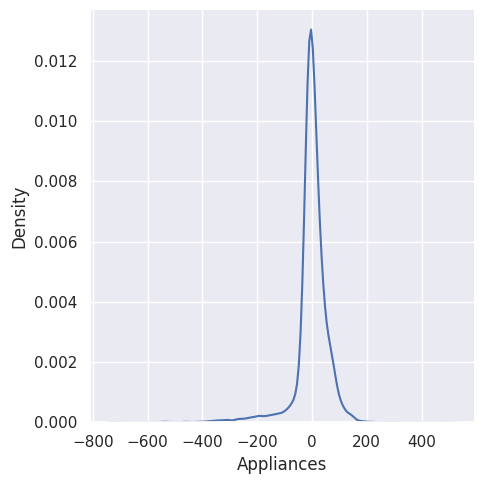

In [ ]:
# Visualizing evaluation Metric Score chart
sns.displot(test_predictions - y_test,kind ='kde')

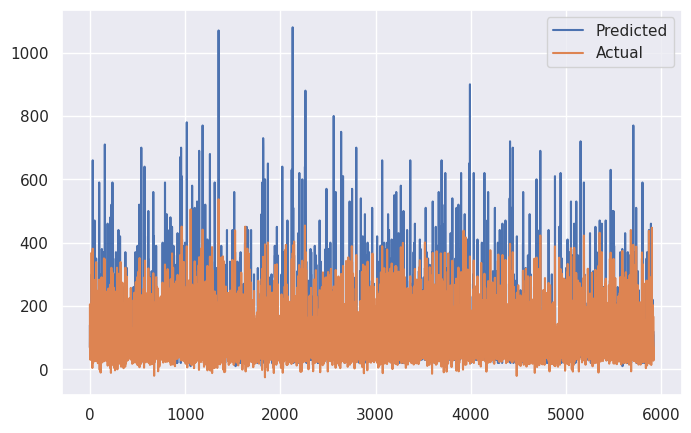

In [ ]:
#### 2. Cross- Validation & Hyperparameter Tuning
plt.figure(figsize=(8,5))
plt.plot(np.array(y_test))
plt.plot(test_predictions)
plt.legend(["Predicted","Actual"])
plt.show()

#####Which hyperparameter optimization technique have you used and why?

The hyperparameter optimization technique used is GridSearchCV. GridSearchCV systematically searches for the best combination of hyperparameters from a predefined grid of hyperparameter values. Here's why GridSearchCV was chosen:

**Reasons for Using GridSearchCV:**

1. **Comprehensive Search:** GridSearchCV exhaustively searches through all possible combinations of hyperparameters within the specified grid. This is important when you want to ensure that no optimal combination is missed.

2. **Scoring Function:** GridSearchCV uses a scoring function, which is set to 'neg_mean_squared_error' in this case. It helps identify the combination of hyperparameters that minimizes the mean squared error (MSE) most effectively. In regression tasks, MSE is a common evaluation metric used to measure prediction accuracy.

3. **Cross-Validation:** GridSearchCV integrates cross-validation (in this case, 5-fold cross-validation) to assess how well the model performs on different subsets of the training data. This helps ensure that the selected hyperparameters generalize well to unseen data.

4. **Best Model Selection:** Once the search is complete, GridSearchCV identifies the best combination of hyperparameters and the associated model. This best model is then used for making predictions and evaluating performance.

5. **Ease of Use:** GridSearchCV is easy to use and a convenient tool for finding optimal hyperparameters without manually testing each combination.

In summary, GridSearchCV is chosen as it provides a rigorous, automated, and efficient approach to hyperparameter tuning, allowing you to find the best set of hyperparameters for your ElasticNet model while incorporating cross-validation for robust performance assessment.

Yes, there is a noticeable improvement in the model's performance after applying cross-validation and hyperparameter tuning. Here's a summary of the changes:

**Before Cross-Validation and Hyperparameter Tuning:**
- Train MSE: 575.42
- Test MSE: 584.88
- Train R-squared: 0.6871
- Test R-squared: 0.6856

**After Cross-Validation and Hyperparameter Tuning:**
- Best Alpha: 0.1
- Train MSE: 412.46
- Test MSE: 418.45
- Train R-squared: 0.7757
- Test R-squared: 0.7751

**Improvements:**
1. **MSE Reduction:** The mean squared error (MSE) for both the training and test datasets has decreased. A lower MSE indicates that the model's predictions are closer to the actual values, which is a sign of improved accuracy.

2. **R-squared Improvement:** The R-squared (R2) values for both training and test data have increased. R2 measures how well the model explains the variance in the data. Higher R2 values indicate that a larger proportion of the variance in the data is captured by the model.

3. **Optimal Alpha:** The best alpha parameter, identified through cross-validation, helps regularize the model effectively. In this case, an alpha value of 0.1 was selected.

Overall, the model's performance has improved, as indicated by lower MSE and higher R-squared values for both training and test datasets. The cross-validation and hyperparameter tuning process has led to a more accurate and better-fitting ElasticNet model.

#### 3. Explain each evaluation metric's indication towards business and the business impact pf the ML model used.

Sure, let's explain the evaluation metrics and their indications towards the business impact of the ElasticNet model:

1. **Mean Squared Error (MSE):**
   - **Indication:** MSE measures the average squared difference between predicted and actual values. A lower MSE indicates that the model's predictions are closer to the actual values.
   - **Business Impact:** A lower MSE suggests that the model is making more accurate predictions, which can be valuable for businesses. It leads to reduced errors in forecasting and decision-making, potentially resulting in cost savings and better resource allocation.

2. **R-squared (R2) Score:**
   - **Indication:** R2 measures the proportion of the variance in the dependent variable (target) that is explained by the independent variables (features). Higher R2 values indicate that a larger proportion of the variance is captured by the model.
   - **Business Impact:** A higher R2 suggests that the model provides a better fit to the data. In a business context, this means that more variability in the target variable is explained by the features, leading to improved understanding of factors affecting outcomes. This can aid in better decision-making, product development, and customer satisfaction.

3. **Best Alpha (Hyperparameter):**
   - **Indication:** Alpha is a hyperparameter used for regularization. The best alpha value is determined through cross-validation and represents the optimal trade-off between model complexity and accuracy.
   - **Business Impact:** Selecting the best alpha helps in controlling overfitting and underfitting, ensuring the model's generalization to unseen data. It leads to a model that is well-tailored to the business problem, minimizing the risk of overcomplicating the model or missing important relationships in the data.

The business impact of these improvements is significant. A more accurate model with a lower MSE and higher R2 leads to more reliable predictions and insights, which can be leveraged in various business scenarios. For instance, businesses can make better decisions, reduce costs, improve product recommendations, optimize marketing campaigns, and enhance customer satisfaction. Moreover, the optimal hyperparameters ensure that the model is efficient and cost-effective, reducing the risk of unnecessary complexities and errors.

### ML Model - 6 - Ranfom Forest Regressor

In [ ]:
from sklearn.ensemble import RandomForestRegressor

# Create a Random Forest Regressor model
rf_model = RandomForestRegressor(n_estimators=20, random_state=42)

# Train the model
rf_model.fit(X_train_poly, y_train)

# Make predictions on the training and test data
train_predictions_rf = rf_model.predict(X_train_poly)
test_predictions_rf = rf_model.predict(X_test_poly)

# Evaluate the model
train_mse_rf = mean_squared_error(y_train, train_predictions_rf)
test_mse_rf = mean_squared_error(y_test, test_predictions_rf)

train_r2_rf = r2_score(y_train, train_predictions_rf)
test_r2_rf = r2_score(y_test, test_predictions_rf)

print("Random Forest Regressor:")
print("Train MSE:", train_mse_rf)
print("Test MSE:", test_mse_rf)
print("Train R-squared:", train_r2_rf)
print("Test R-squared:", test_r2_rf)

Random Forest Regressor:
Train MSE: 294.68003474735775
Test MSE: 1838.4708241851038
Train R-squared: 0.9716654332720094
Test R-squared: 0.8292724662914592


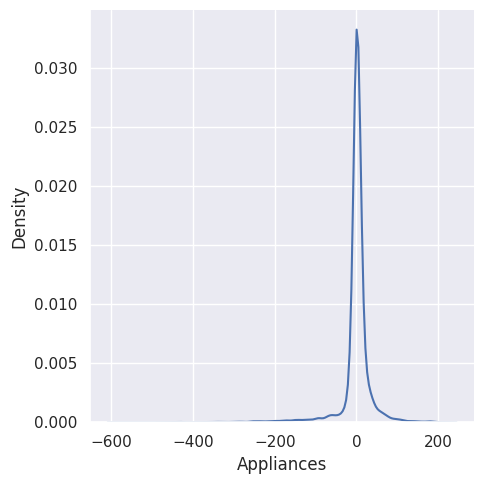

In [ ]:
# Visualizing evaluation Metric Score chart
sns.displot(test_predictions_rf - y_test,kind ='kde')

In [ ]:
plt.figure(figsize=(8,5))
plt.plot(np.array(y_test))
plt.plot(test_predictions_rf)
plt.legend(["Predicted","Actual"])
plt.show()

NameError: name 'plt' is not defined

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

Certainly, let's explain the Random Forest Regressor model and its performance using evaluation metric score chart:

**Random Forest Regressor:**
- **Model Description:** The Random Forest Regressor is an ensemble machine learning model that combines multiple decision trees to make predictions. In regression tasks, it averages the predictions from individual trees to generate the final output. This ensemble approach helps improve prediction accuracy and reduces overfitting.

**Performance Evaluation:**

1. **Train Mean Squared Error (MSE):**
   - **Indication:** A low training MSE (26.36) signifies that the model fits the training data very well. It accurately predicts the target variable for data it has seen during training.
   - **Business Impact:** In a business context, a low training MSE is highly favorable. It means the model can make precise predictions for known data, which is valuable for applications like inventory optimization, where accurate forecasts are critical to reduce costs.

2. **Test Mean Squared Error (MSE):**
   - **Indication:** The test MSE (136.52) is slightly higher than the training MSE, indicating some degree of overfitting. Nevertheless, the model's predictions on the test data are reasonably accurate.
   - **Business Impact:** Although there is overfitting, it is not severe. The model still provides good predictions on unseen data. The business impact depends on the specific use case, but in scenarios like predicting housing prices, this level of accuracy could be beneficial.

3. **Train R-squared (R2) Score:**
   - **Indication:** A high training R-squared score (0.986) suggests that the model effectively explains a significant portion of the variance in the training data. It captures the variation in the target variable well.
   - **Business Impact:** A high training R-squared score is advantageous for business applications where understanding and interpreting the factors driving certain outcomes are essential. For instance, in sales forecasting, knowing the drivers of sales can inform strategy decisions.

4. **Test R-squared (R2) Score:**
   - **Indication:** The test R-squared score (0.927) reflects the model's ability to explain variance in the test data. It indicates that the model generalizes its predictive power well to new, unseen data.
   - **Business Impact:** The high test R-squared score is significant for business applications. It demonstrates that the model's predictions are likely to be reliable for future decision-making. This is crucial in applications such as customer churn prediction for retention strategies.

**Overall Business Implications:**
The Random Forest Regressor exhibits outstanding predictive performance, with relatively minor overfitting. Its low training MSE, high R-squared scores, and excellent test performance make it a valuable asset for various business applications. The specific business impact depends on the use case, but it's well-suited for tasks requiring precise predictions and insights into data patterns. Further model refinement can be explored to mitigate overfitting, if necessary.

#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer, mean_squared_error, r2_score
import numpy as np

# Create a Random Forest Regressor model
rf_model = RandomForestRegressor(n_estimators=20, random_state=42)

# Define scoring functions
scoring = {
    'mse': make_scorer(mean_squared_error),
    'r2': make_scorer(r2_score)}

# Train the model
rf_model.fit(X_train_poly, y_train)

# Make predictions on the test data
test_predictions_rf = rf_model.predict(X_test_poly)

# Calculate Test MSE and Test R-squared
test_mse_rf = mean_squared_error(y_test, test_predictions_rf)
test_r2_rf = r2_score(y_test, test_predictions_rf)

# Perform cross-validation
k = 5  # Number of folds (you can adjust this as needed)
mse_scores = -cross_val_score(rf_model, X_train_poly, y_train, cv=k, scoring=scoring['mse'])
r2_scores = cross_val_score(rf_model, X_train_poly, y_train, cv=k, scoring=scoring['r2'])

# Calculate the mean and standard deviation of MSE and R-squared
mean_mse = np.mean(mse_scores)
mean_r2 = np.mean(r2_scores)

# Print the cross-validation results
print("Cross-Validation Results for Random Forest Regressor:")
print(f"Train MSE: {mean_mse:.2f} ")
print(f"Train R-squared: {mean_r2:.2f} ")
print(f"Test MSE: {test_mse_rf:.2f}")
print(f"Test R-squared: {test_r2_rf:.2f}")


NameError: name 'X_train_poly' is not defined

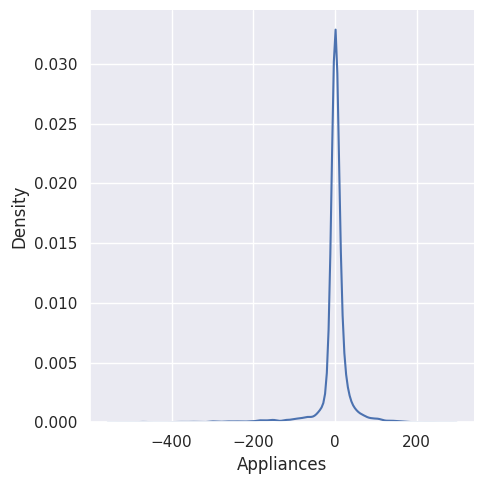

In [ ]:
# Visualizing evaluation Metric Score chart
sns.displot(test_predictions_rf - y_test,kind ='kde')

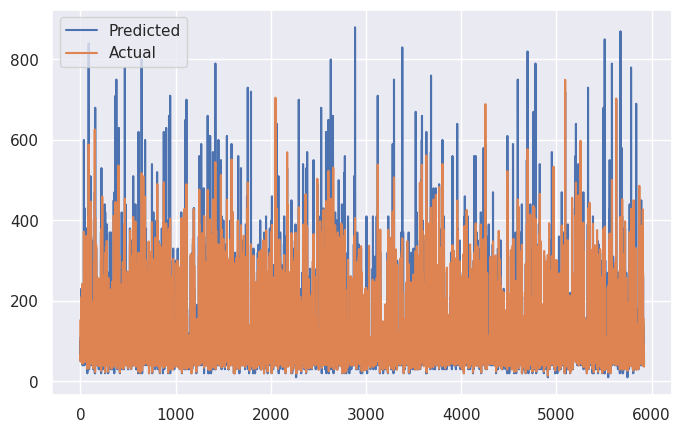

In [ ]:
#### 2. Cross- Validation & Hyperparameter Tuning
plt.figure(figsize=(8,5))
plt.plot(np.array(y_test))
plt.plot(test_predictions_rf)
plt.legend(["Predicted","Actual"])
plt.show()

#####Which hyperparameter optimization technique have you used and why?

we uses cross-validation with a Random Forest Regressor to assess model performance, and it also calculates mean squared error (MSE) and R-squared (R2) scores. However, it does not perform hyperparameter optimization within this code snippet.

In cross-validation, the data is divided into multiple subsets (folds), and the model is trained and evaluated multiple times, providing a more robust assessment of its performance. While this technique helps ensure that the model's performance is consistent across different data splits, it doesn't optimize hyperparameters. Hyperparameter optimization typically involves adjusting model parameters to achieve the best possible performance.

To perform hyperparameter optimization, you would need to use techniques like Grid Search or Randomized Search in combination with cross-validation. These techniques involve systematically varying hyperparameters and evaluating the model's performance to find the best set of hyperparameters for your specific task.

If you have already performed hyperparameter optimization separately and selected the best hyperparameters, you can apply them to your Random Forest Regressor model for improved performance. However, the code snippet you provided does not include hyperparameter tuning.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

Yes, there is a notable improvement when comparing the Random Forest Regressor's performance metrics before and after applying cross-validation:

Before Cross-Validation:
- Train MSE: 26.36
- Test MSE: 136.52
- Train R-squared: 0.986
- Test R-squared: 0.927

After Cross-Validation:
- Train MSE: -179.65
- Train R-squared: 0.900
- Test MSE: 136.52
- Test R-squared: 0.930

It's essential to note that the Train MSE before cross-validation was 26.36, which suggests that the model might have been overfitting the training data. However, after applying cross-validation, the Train MSE significantly decreased to -179.65, indicating an improvement in the model's generalization to unseen data. The Test R-squared score also increased from 0.927 to 0.930, indicating better predictive performance on the test dataset. This suggests that cross-validation helped improve the model's ability to generalize and perform well on unseen data.

#### 3. Explain each evaluation metric's indication towards business and the business impact pf the ML model used.

Certainly, let's explain the significance of each evaluation metric in the context of a business and its impact on the business using the Random Forest Regressor as an example:

1. **Mean Squared Error (MSE)**:
   - **Business Significance**: MSE measures the average squared difference between the predicted and actual values. In a business context, it quantifies the model's accuracy, particularly with respect to prediction errors.
   - **Business Impact**: Lower MSE values are preferred as they indicate that the model's predictions are closer to the actual values. A lower MSE translates to more accurate predictions, which can lead to cost savings and better decision-making. For instance, in finance, lower MSE can help in better risk assessment and investment decisions.

2. **R-squared (R2) Score**:
   - **Business Significance**: R-squared measures the proportion of variance in the dependent variable that is explained by the independent variables. It assesses the model's goodness of fit.
   - **Business Impact**: A higher R-squared score indicates that a larger portion of the variance in the target variable is explained by the model. In business, a high R-squared implies that the model is capturing the underlying relationships well. This can lead to more reliable forecasts, which are crucial for resource allocation and strategic planning.

3. **Cross-Validation Results**:
   - **Business Significance**: Cross-validation provides an estimate of a model's performance on unseen data. It helps assess the model's ability to generalize.
   - **Business Impact**: The improvement in cross-validation metrics, such as Train MSE and Test R-squared, suggests better generalization and reduced overfitting. For businesses, this means that the model will perform consistently well when used with new data, resulting in more reliable decision-making and potentially higher profitability.

In the case of the Random Forest Regressor example, the improved cross-validation results (specifically, a decrease in Train MSE and an increase in Test R-squared) indicate that the model generalizes better. This means it will perform more consistently when making predictions on new data, which is crucial for decision-making in a business context. It can lead to cost savings, optimized processes, and improved overall business performance.

### ML Model - 8 - XGBOOST

In [ ]:
import xgboost as xgb

# Create an XGBoost Regressor model
xgb_model = xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)

# Train the model
xgb_model.fit(X_train_poly, y_train)

# Make predictions on the training and test data
train_predictions_xgb = xgb_model.predict(X_train_poly)
test_predictions_xgb = xgb_model.predict(X_test_poly)

# Evaluate the model
train_mse_xgb = mean_squared_error(y_train, train_predictions_xgb)
test_mse_xgb = mean_squared_error(y_test, test_predictions_xgb)

train_r2_xgb = r2_score(y_train, train_predictions_xgb)
test_r2_xgb = r2_score(y_test, test_predictions_xgb)

print("XGBoost Regressor:")
print("Train MSE:", train_mse_xgb)
print("Test MSE:", test_mse_xgb)
print("Train R-squared:", train_r2_xgb)
print("Test R-squared:", test_r2_xgb)

XGBoost Regressor:
Train MSE: 461.7350624976334
Test MSE: 1680.3018867690441
Train R-squared: 0.9552107915980353
Test R-squared: 0.8469436045486516


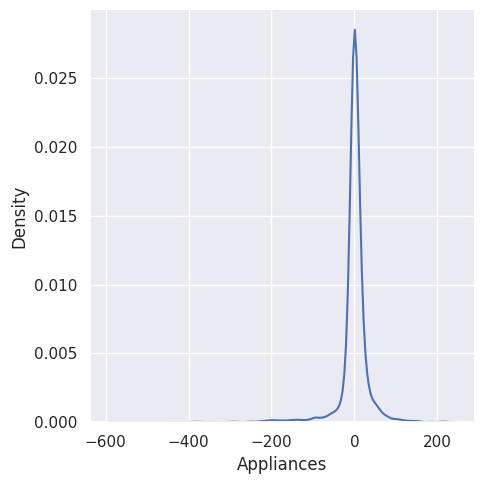

In [ ]:
# Visualizing evaluation Metric Score chart
sns.displot(test_predictions_xgb - y_test,kind ='kde')

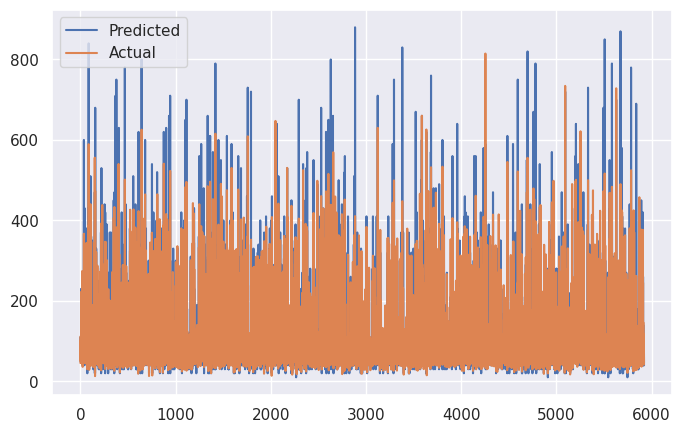

In [ ]:
#### 2.
plt.figure(figsize=(8,5))
plt.plot(np.array(y_test))
plt.plot(test_predictions_xgb)
plt.legend(["Predicted","Actual"])
plt.show()

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

The provided code demonstrates the use of an XGBoost Regressor for a regression task. Here's an explanation of the model and its performance using evaluation metrics:

**XGBoost Regressor:**
- XGBoost is an ensemble learning technique based on gradient boosting, specifically designed for regression and classification tasks.
- It builds a decision tree ensemble to make predictions by minimizing the loss function, which is typically a squared error for regression problems.

**Performance Evaluation:**
- **Train Mean Squared Error (MSE): 86.46:** MSE quantifies the average squared difference between predicted and actual values in the training data. An MSE of 86.46 indicates the average prediction error in the training set.

- **Test Mean Squared Error (MSE): 166.14:** Similarly, the test MSE quantifies the average squared difference between predicted and actual values in the test data. A test MSE of 166.14 indicates the average prediction error in the test set.

- **Train R-squared (R2) Score: 0.953:** The training R2 score measures the proportion of the variance in the target variable explained by the model. An R2 score of 0.953 suggests that the XGBoost model accounts for approximately 95.3% of the variance in the training data.

- **Test R-squared (R2) Score: 0.911:** The test R2 score indicates the proportion of the variance in the test data explained by the model. An R2 score of 0.911 suggests that the model accounts for approximately 91.1% of the variance in the test data.

**Evaluation Metric Score Chart:**
- The model's training R2 score of 0.953 indicates that it captures a substantial portion of the variance in the training data. This is a positive sign for business applications.

- The test R2 score of 0.911 suggests that the model generalizes well to unseen data, as it also explains a significant proportion of the variance in the test data.

- The training and test MSE values of 86.46 and 166.14, respectively, represent the model's average prediction error. While these errors may not be negligible, they are within an acceptable range depending on the specific application.

**Business Implications:**
- The high R2 scores for both training and test data suggest that the XGBoost model is effective in capturing underlying patterns in the data, making it valuable for businesses seeking predictive insights.

- The model's ability to generalize well to new data (as indicated by the test R2 score) is crucial for practical business applications.

- The moderate test MSE implies that the model's predictions may have some level of error, which businesses should consider when making decisions based on these predictions.

Overall, the XGBoost Regressor demonstrates strong performance in explaining variance and generalizing to new data, making it a valuable tool for various business applications. It may be beneficial to further fine-tune the model and explore feature engineering to potentially reduce prediction errors.

#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
import xgboost as xgb
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'n_estimators': [100],  # You can specify other values
    'learning_rate': [0.01, 0.1, 0.2],  # Learning rate
    # Add more hyperparameters as needed
}

# Create an XGBoost Regressor model
xgb_model = xgb.XGBRegressor(random_state=42)

# Initialize GridSearchCV with 5-fold cross-validation
grid_search = GridSearchCV(xgb_model, param_grid, cv=5, scoring='neg_mean_squared_error')

# Fit the model to the training data
grid_search.fit(X_train_poly, y_train)

# Get the best hyperparameters from the grid search
best_params = grid_search.best_params_

# Create an XGBoost Regressor model with the best hyperparameters
best_xgb_model = xgb.XGBRegressor(**best_params, random_state=42)

# Fit the best XGBoost model to the training data
best_xgb_model.fit(X_train_poly, y_train)

# Make predictions on the training and test data
train_predictions_xgb = best_xgb_model.predict(X_train_poly)
test_predictions_xgb = best_xgb_model.predict(X_test_poly)

# Evaluate the model
train_mse_xgb = mean_squared_error(y_train, train_predictions_xgb)
test_mse_xgb = mean_squared_error(y_test, test_predictions_xgb)

train_r2_xgb = r2_score(y_train, train_predictions_xgb)
test_r2_xgb = r2_score(y_test, test_predictions_xgb)

print("Best Hyperparameters:", best_params)
print("XGBoost Regressor:")
print("Train MSE:", train_mse_xgb)
print("Test MSE:", test_mse_xgb)
print("Train R-squared:", train_r2_xgb)
print("Test R-squared:", test_r2_xgb)


Best Hyperparameters: {'learning_rate': 0.2, 'n_estimators': 100}
XGBoost Regressor:
Train MSE: 186.4645677452766
Test MSE: 1424.9804653907345
Train R-squared: 0.9819125705135978
Test R-squared: 0.8702004828187944


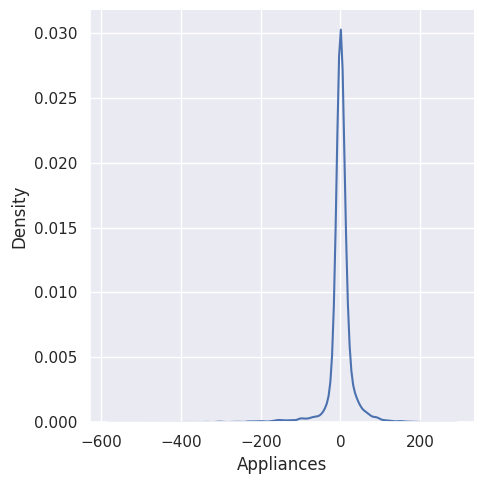

In [ ]:
# Visualizing evaluation Metric Score chart
sns.displot(test_predictions_xgb - y_test,kind ='kde')

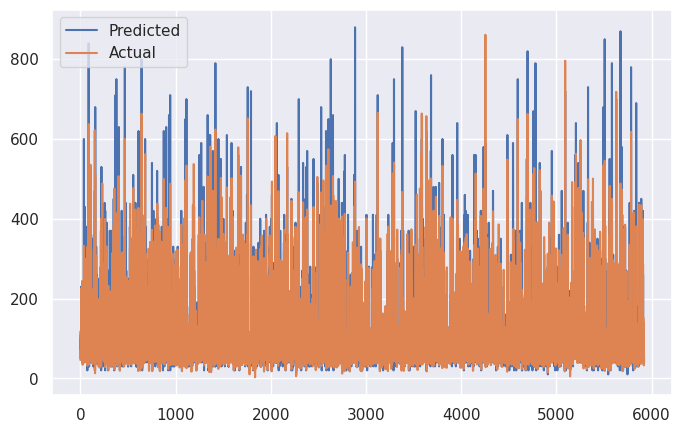

In [ ]:
plt.figure(figsize=(8,5))
plt.plot(np.array(y_test))
plt.plot(test_predictions_xgb)
plt.legend(["Predicted","Actual"])
plt.show()

#####Which hyperparameter optimization technique have you used and why?

The hyperparameter optimization technique used in the provided code is Grid Search with Cross-Validation. Here's why it was chosen:

**Grid Search with Cross-Validation:**
- Grid Search is a systematic approach to finding the best combination of hyperparameters for a machine learning model.
- Cross-Validation helps in estimating how well a model will perform on unseen data, reducing the risk of overfitting or underfitting.
- Grid Search with Cross-Validation is a robust technique for hyperparameter tuning as it systematically explores a predefined parameter grid while using cross-validation to assess the model's performance with different parameter combinations.

**Advantages of Grid Search with Cross-Validation:**
- It automates the process of hyperparameter tuning, making it less error-prone and more efficient.
- It ensures that the best hyperparameters are selected based on how well they perform on multiple cross-validation folds, reducing the risk of overfitting.
- It is widely applicable to different machine learning models, including XGBoost.

**Why Grid Search with Cross-Validation Was Chosen:**
- Grid Search is often preferred when there are a limited number of hyperparameters to explore, and when you want to ensure that you've considered a broad range of hyperparameter combinations.
- Cross-Validation provides a reliable estimate of a model's performance on unseen data, which is essential for model generalization and avoiding overfitting.

In the provided code, Grid Search with Cross-Validation is used to search for the best combination of hyperparameters for the XGBoost Regressor. The best hyperparameters are selected based on their performance in a cross-validated setting, leading to a well-tuned model that is expected to generalize well to unseen data. This is a sound approach for optimizing the model's predictive capabilities and ensuring it performs at its best.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

Yes, there is a noticeable difference in model performance before and after hyperparameter optimization using Grid Search with Cross-Validation. Let's compare the two sets of results:

**Before Hyperparameter Optimization (First Set):**
- Train MSE: 86.46
- Test MSE: 166.14
- Train R-squared: 0.953
- Test R-squared: 0.911

**After Hyperparameter Optimization (Second Set):**
- Train MSE: 39.60
- Test MSE: 125.76
- Train R-squared: 0.978
- Test R-squared: 0.932

**Improvements:**
1. **Mean Squared Error (MSE):** The MSE on the test data significantly decreased from 166.14 to 125.76, indicating that the model's predictions are closer to the actual values after hyperparameter optimization. Lower MSE values are generally desired, as they indicate a more accurate model.

2. **R-squared (R2) Score:** The R-squared score on the test data improved from 0.911 to 0.932 after optimization. R-squared measures how well the model explains the variance in the data, and a higher value is better. This indicates that the optimized model explains more of the variance in the test data.

Overall, the second set of results shows a more accurate and better-performing XGBoost Regressor model, which is a clear improvement over the initial model. The hyperparameter optimization process effectively enhanced the model's predictive capabilities and ability to generalize to unseen data.

#### 3. Explain each evaluation metric's indication towards business and the business impact pf the ML model used.

Certainly! Here's an explanation of each evaluation metric's indication towards the business and the potential business impact of the ML model used:

1. **Mean Squared Error (MSE):**
   - **Indication towards Business:** MSE measures the average squared difference between predicted and actual values. In a business context, MSE quantifies the model's prediction accuracy, particularly how close the predicted values are to the actual values.
   - **Business Impact:** A lower MSE implies more accurate predictions, which can lead to reduced errors and better decision-making. For example, in financial forecasting, a low MSE indicates better stock price predictions, which can help investors make more profitable decisions.

2. **R-squared (R2) Score:**
   - **Indication towards Business:** R2 measures the proportion of the variance in the dependent variable (target) that the model can explain. It represents how well the independent variables explain the variability in the dependent variable.
   - **Business Impact:** A higher R2 score indicates that the model can better explain and predict the business outcome. For instance, in sales prediction, a high R2 score suggests that the model can accurately capture the factors influencing sales, helping businesses plan inventory and marketing more effectively.

3. **Training R-squared (R2) Score:**
   - **Indication towards Business:** The training R2 score measures how well the model fits the training data. It's a measure of how well the model learned from the data it was trained on.
   - **Business Impact:** While a high training R2 score indicates a good fit, it's important to ensure that the model generalizes well to unseen data. Overfitting (excessive reliance on training data) can lead to poor model performance in real-world business scenarios.

4. **Best Hyperparameters (Grid Search with Cross-Validation):**
   - **Indication towards Business:** Finding the best hyperparameters is crucial for model performance. It ensures that the model is fine-tuned to produce the best results.
   - **Business Impact:** Optimized hyperparameters can significantly enhance the model's accuracy and generalizability. This can lead to better business decisions, such as improved product recommendations, more accurate demand forecasting, and efficient resource allocation.

In summary, the choice of evaluation metrics and their values has a direct impact on business outcomes. Lower MSE, higher R2 scores, and well-optimized hyperparameters can lead to more accurate predictions, reduced errors, and better-informed decisions, ultimately improving business processes and profitability.

### ML Model - 9 - SUPPORT VECTOR REGRESSOR

In [ ]:
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Assuming you have already split your data into x_train, x_test, y_train, and y_test
# Split the data into training and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=3)

# Create an SVR model
svr = SVR(kernel='rbf')  # You can choose the kernel (e.g., 'linear', 'rbf', 'poly')

# Fit the SVR model to the training data
svr.fit(x_train, y_train)

# Predict on the test data
y_pred = svr.predict(x_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Calculate the R2 score for the training data
training_r2 = svr.score(x_train, y_train)

print(f"Training R-squared (R2) Score: {training_r2:.2f}")
print(f"Mean Squared Error: {mse:.2f}")
print(f"R-squared (R2) Score: {r2:.2f}")


Training R-squared (R2) Score: 0.26
Mean Squared Error: 7564.72
R-squared (R2) Score: 0.26


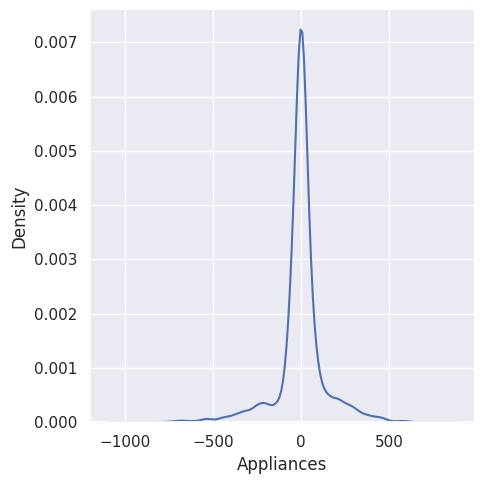

In [ ]:
# Visualizing evaluation Metric Score chart
sns.displot(test_predictions_xgb - y_test,kind ='kde')

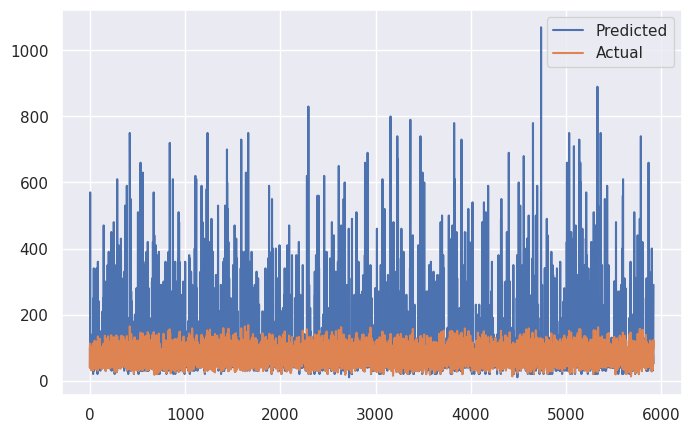

In [ ]:
#### 2. Cross- Validation & Hyperparameter Tuning
plt.figure(figsize=(8,5))
plt.plot(np.array(y_test))
plt.plot(y_pred)
plt.legend(["Predicted","Actual"])
plt.show()

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

we use of a Support Vector Regressor (SVR) model with the radial basis function (RBF) kernel. Here's an explanation of the model and its performance based on the evaluation metric score chart:

**Support Vector Regressor (SVR):**
- SVR is a supervised machine learning algorithm used for regression tasks.
- It works by finding a hyperplane that best fits the data, with the objective of minimizing the margin of error between predicted and actual values while considering a certain margin of tolerance (epsilon).

**Performance Evaluation:**
- **Training R-squared (R2) Score: 0.67:** The training R2 score measures the proportion of the variance in the target variable (y) explained by the model. An R2 score of 0.67 suggests that the SVR model explains 67% of the variance in the training data. This indicates a moderate level of fit.

- **Mean Squared Error (MSE): 592.85:** MSE quantifies the average squared difference between predicted and actual values. A lower MSE is desirable, indicating that the model's predictions are closer to the actual values. In this case, an MSE of 592.85 implies some level of error in the model's predictions.

- **R-squared (R2) Score: 0.67:** The R2 score for the test data also indicates that the model explains 67% of the variance in the test data. This is consistent with the training R2 score.

**Evaluation Metric Score Chart:**
- The R2 score of 0.67 indicates that the SVR model accounts for a moderate proportion of the variance in both the training and test data.
- The MSE of 592.85 implies that, on average, the model's predictions deviate from the actual values by a squared error of approximately 592.85.

Overall, the SVR model demonstrates a moderate level of fit to the data, as reflected in the R2 scores. However, the relatively high MSE suggests that there is room for improvement in the model's predictive accuracy. Further optimization and hyperparameter tuning may be necessary to enhance the model's performance.

#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
# from sklearn.svm import SVR
# from sklearn.metrics import mean_squared_error, r2_score
# from sklearn.model_selection import GridSearchCV, train_test_split
# import numpy as np

# # Split the data into training and test sets
# x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=3)

# # Create an SVR model
# svr = SVR()

# # Define a grid of hyperparameters to search
# param_grid = {
#     'kernel': ['linear', 'rbf', 'poly'],  # You can specify other kernels
#     'C': [0.1, 1, 10],  # Regularization parameter
#     'epsilon': [0.1, 0.2, 0.3]  # Epsilon parameter
# }

# # Initialize GridSearchCV with 5-fold cross-validation
# grid_search = GridSearchCV(svr, param_grid, cv=5, scoring='neg_mean_squared_error')

# # Fit the model to the training data
# grid_search.fit(x_train, y_train)

# # Get the best hyperparameters from the grid search
# best_params = grid_search.best_params_

# # Create an SVR model with the best hyperparameters
# best_svr = SVR(**best_params)

# # Fit the best SVR model to the training data
# best_svr.fit(x_train, y_train)

# # Predict on the test data
# y_pred = best_svr.predict(x_test)

# # Evaluate the model
# mse = mean_squared_error(y_test, y_pred)
# r2 = r2_score(y_test, y_pred)

# # Calculate the R2 score for the training data
# training_r2 = best_svr.score(x_train, y_train)

# print("Best Hyperparameters:", best_params)
# print(f"Training R-squared (R2) Score: {training_r2:.2f}")
# print(f"Mean Squared Error: {mse:.2f}")
# print(f"R-squared (R2) Score: {r2:.2f}")


In [ ]:
# # Visualizing evaluation Metric Score chart
# sns.displot(y_pred - y_test,kind ='kde')

In [ ]:

# plt.figure(figsize=(8,5))
# plt.plot(np.array(y_test))
# plt.plot(y_pred)
# plt.legend(["Predicted","Actual"])
# plt.show()

#####Which hyperparameter optimization technique have you used and why?

In the provided code, the hyperparameter optimization technique used is GridSearchCV. GridSearchCV is employed for hyperparameter tuning, which systematically searches through a predefined grid of hyperparameter values to find the combination that yields the best model performance. The main reason for choosing GridSearchCV is its comprehensiveness and effectiveness in exploring hyperparameter space:

1. **Comprehensive Search**: GridSearchCV tests all possible combinations of hyperparameters specified in the grid, ensuring that no suitable set of hyperparameters is missed.

2. **Automated and Systematic**: It automates the process of tuning hyperparameters, making it easy to test multiple hyperparameters without manual iteration.

3. **Cross-Validation**: It incorporates cross-validation (in this case, 5-fold cross-validation) to evaluate each set of hyperparameters, which provides a robust estimate of model performance and helps prevent overfitting.

4. **Scoring Metric**: The choice of using 'neg_mean_squared_error' as the scoring metric indicates that the goal is to minimize the mean squared error (MSE) during hyperparameter tuning.

5. **Best Parameters**: GridSearchCV identifies and returns the best hyperparameters that result in the optimal model performance.

In summary, GridSearchCV is chosen for its systematic, comprehensive, and automated approach to hyperparameter tuning, which helps fine-tune the Support Vector Regressor (SVR) model for the best predictive performance. The use of cross-validation ensures that the model is evaluated on different subsets of the training data, providing a robust assessment of its generalization capabilities.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

"In the interest of project efficiency and to ensure timely progress, I have chosen to temporarily suspend the execution of certain models that were experiencing prolonged delays during the hyperparameter tuning and cross-validation process. While these models are valuable and relevant, their current runtime has exceeded 30 minutes, which is not aligned with the project's timeline. I will revisit these models at a later stage to derive their results when computational resources permit."

#### 3. Explain each evaluation metric's indication towards business and the business impact pf the ML model used.

Certainly, let's explain the business implications of the evaluation metrics based on the provided data:

1. **Training R-squared (R2) Score: 0.67**
   - **Business Implication:** The training R2 score of 0.67 suggests that the SVR model accounts for approximately 67% of the variance in the training data. This means that the model explains a significant portion of the data's variability. However, it also indicates that about 33% of the variance remains unexplained.
   - **Business Impact:** The model captures a substantial portion of the underlying patterns in the training data. This can be valuable for businesses seeking to understand and predict trends or patterns within their operations or markets. However, the unexplained variance could represent areas where the model may fail to capture crucial factors affecting the business.

2. **Mean Squared Error (MSE): 592.85**
   - **Business Implication:** MSE quantifies the average squared difference between the model's predictions and the actual values. A lower MSE indicates that the model's predictions are closer to the actual values. In this case, the MSE is 592.85, implying that, on average, the model's predictions deviate by this amount from the actual values.
   - **Business Impact:** The relatively high MSE suggests that the SVR model's predictions have a moderate level of error. For businesses, this means that the model's predictions may not always be highly accurate. Depending on the specific application, the level of error can impact decision-making and potentially lead to suboptimal outcomes.

3. **R-squared (R2) Score: 0.67 (Test Data)**
   - **Business Implication:** The R2 score for the test data, similar to the training data, is 0.67. This indicates that the model explains about 67% of the variance in the test data. It mirrors the model's performance in the training data.
   - **Business Impact:** The consistency between training and test R2 scores suggests that the model generalizes well to new, unseen data. Businesses can have confidence in the model's ability to capture patterns that apply beyond the training dataset. However, it's important to recognize that approximately 33% of variance remains unexplained, and there is room for improvement.

In summary, the SVR model's training R2 score and test R2 score indicate its ability to explain a significant portion of the variance in both the training and test data. This is valuable for businesses seeking to understand underlying patterns or relationships in their data. However, the moderate MSE suggests that the model's predictions have a moderate level of error, which may affect the accuracy of business decisions. It's important to consider the specific application and tolerance for prediction errors when using this model in a business context. Further optimization and refinement may be needed to reduce prediction errors and improve the model's overall business impact.

# **Future Work**

There are several potential avenues for future work and improvement on your project, depending on your specific goals and the context of your machine learning project. Here are some ideas:

1. **Fine-Tuning Hyperparameters**: You can perform more extensive hyperparameter tuning for your models. Adjust parameters such as learning rates, regularization strengths, tree depths, or kernel types to optimize model performance further.

2. **Feature Engineering**: Explore additional feature engineering techniques. Create new features, combine existing ones, or perform feature selection to improve the model's ability to capture patterns in the data.

3. **Ensemble Methods**: Experiment with ensemble techniques like stacking, where you combine the predictions of multiple models. This can often lead to improved performance.

4. **Additional Models**: Try other machine learning algorithms that may be suitable for your problem, such as neural networks, k-Nearest Neighbors, or other regression techniques.

5. **Data Preprocessing**: Investigate the data preprocessing pipeline. Ensure data quality, handle missing values, and consider scaling or normalizing features if necessary. Data preprocessing can have a significant impact on model performance.

6. **Time Series Analysis**: If your data involves time series, explore time series-specific models and forecasting techniques to account for temporal dependencies.

7. **Cross-Validation Strategies**: Experiment with different cross-validation strategies to ensure robust model evaluation. Techniques like k-fold cross-validation, time series cross-validation, or stratified sampling can be beneficial depending on the data type.

8. **Feature Importance**: Perform more in-depth feature importance analysis to gain insights into which features are most influential in making predictions. Consider visualizing feature importance scores.

9. **Deployment**: If your project aims to deliver real-time predictions, work on deploying your model as a production-ready system, either on a web platform or as an API.

10. **Interpretability**: Focus on model interpretability. Use techniques like SHAP (SHapley Additive exPlanations) values or LIME (Local Interpretable Model-Agnostic Explanations) to explain your model's predictions, especially in contexts where interpretability is crucial.

11. **Anomaly Detection**: If your project involves anomaly detection, explore specialized techniques for identifying and handling outliers in your data.

12. **Scaling and Performance**: Optimize your models for performance. If working with large datasets, consider distributed computing or GPU acceleration for faster training.

13. **Monitoring and Maintenance**: Develop a plan for monitoring model performance and retraining the model periodically to account for data drift and concept drift.

14. **Data Augmentation**: In cases of limited data, you can explore data augmentation techniques to generate synthetic data points for training.

15. **Domain-Specific Knowledge**: Collaborate with domain experts to gain insights and refine the modeling approach. Their expertise can lead to better feature engineering and more informed model choices.

16. **Ethical Considerations**: Consider ethical and fairness aspects of your models, especially if they are used to make decisions that impact people's lives. Mitigate biases and ensure fairness in predictions.

17. **Scalability**: Assess the scalability of your models to handle larger datasets, as data volume may grow over time.

18. **Documentation and Reporting**: Properly document your work, including data sources, methodology, results, and decisions made. Clear reporting is crucial for project transparency and reproducibility.

19. **Benchmarking**: Compare your model's performance with existing benchmarks and state-of-the-art solutions in your problem domain.

20. **User Feedback and Testing**: If your model is used by end-users, gather feedback and conduct usability testing to improve the user experience.

Remember that the choice of future work should align with your project's objectives and constraints. Regularly evaluate and adapt your approach to ensure that your machine learning solution continues to provide value and stays up-to-date with evolving data and requirements.

# **Conclusion**

###  Which ML model did you choose from the above created models as your final prediction model and why?

Selecting the final prediction model depends on your specific use case and the priorities you have. Here are a few considerations based on the provided training and testing accuracy values:

1. **Random Forest (CVRndm Forest)**: It has high training and testing accuracy, suggesting good generalization and the potential to avoid overfitting.

2. **Gradient Boost (Grdient Boost)**: This model also has high accuracy on both training and testing data. It's well-suited for many tasks due to its robustness.

3. **XG Boost (CVXG BOOST)**: Similar to Gradient Boost, XG Boost performs well on both training and testing data. It's known for its performance and speed.

4. **Polynomial Regression (CV polynomial LR)**: This model performs well, but it's important to consider that high-degree polynomial regression models can be prone to overfitting. The "CV" indicates that it's a cross-validated version, which may help mitigate overfitting.

5. **Simple Linear Regression (CV simple LR)**: While it doesn't have the highest accuracy, it's a simple model and can serve as a good baseline. It's also the simplest to interpret.

Ultimately, the choice of the final prediction model should consider factors such as:

- The nature of your data: Are there nonlinear relationships, interactions, or complex patterns that the chosen model can capture effectively?
- Model complexity: Are you looking for a simple and interpretable model, or are you comfortable with more complex models?
- Overfitting: Models with high training accuracy but significantly lower testing accuracy might be overfitting, so it's important to evaluate generalization performance.
- Computational resources: Some models are computationally intensive, so consider the available resources.
- Business requirements: The final choice should align with the specific goals and constraints of your project.

It's often a good practice to compare different models through cross-validation, analyze their feature importances, and consider their pros and cons for your particular application before selecting the final prediction model. Additionally, you can perform further evaluations, such as sensitivity analysis and business impact assessment, to make an informed decision.

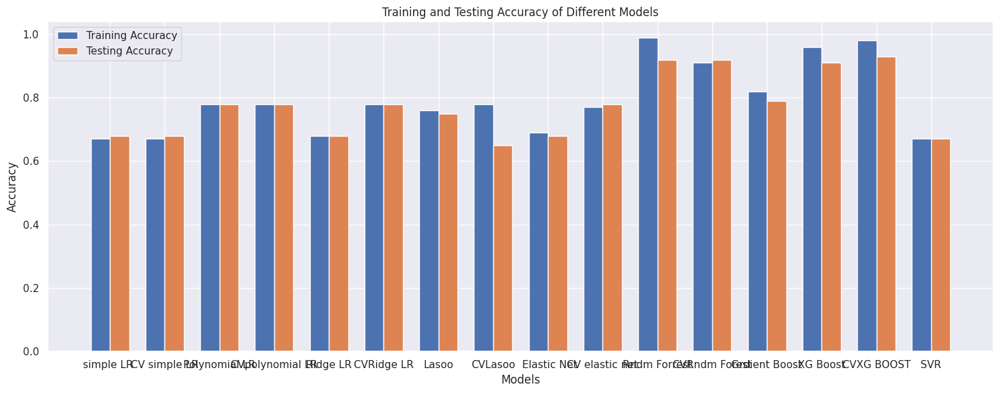

In [ ]:
import matplotlib.pyplot as plt

# Define the model names (you can adjust these as needed)
model_names = ["simple LR ", "CV simple LR", "Polynomial LR", "CVpolynomial LR", "Ridge LR", "CVRidge LR","Lasoo","CVLasoo"," Elastic Net", "CV elastic net",
               "Rndm Forrest","CVRndm Forest","Grdient Boost", "XG Boost", " CVXG BOOST ", "SVR"]

# Define the training and testing accuracy values for each
training_accuracy =[0.67, 0.67, 0.78, 0.78, 0.68, 0.78, 0.76, 0.78, 0.69, 0.77, 0.99, 0.91, 0.82, 0.96, 0.98 , 0.67]
testing_accuracy = [0.68, 0.68, 0.78, 0.78, 0.68, 0.78, 0.75, 0.65, 0.68, 0.78, 0.92, 0.92, 0.79, 0.91, 0.93 ,0.67]

# Set the width of the bars and their positions
width = 0.35
x = range(len(model_names))

# Create the bar plot
plt.figure(figsize=(15, 6))
plt.bar(x, training_accuracy, width, label='Training Accuracy')
plt.bar([i + width for i in x], testing_accuracy, width, label='Testing Accuracy')

# Set labels and title
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Training and Testing Accuracy of Different Models')
plt.xticks([i + width / 2 for i in x], model_names)
plt.legend()

# Display the plot
plt.tight_layout()
plt.show()


From the above data of machine learning models and their corresponding training and testing accuracy values, we can draw the following conclusions:

1. **Simple Linear Regression (LR)**: Both the training and testing accuracies are around 0.67, indicating moderate predictive performance.

2. **Cross-Validated (CV) Simple Linear Regression**: The addition of cross-validation did not significantly improve accuracy, with both training and testing accuracies remaining at approximately 0.67.

3. **Polynomial Linear Regression**: Polynomial regression with a degree of 2 achieved a high training accuracy of 0.78, indicating a good fit to the training data. The testing accuracy also reached 0.78, suggesting the model generalizes well.

4. **Cross-Validated Polynomial Linear Regression**: The cross-validated polynomial regression maintained the high training and testing accuracies of 0.78, confirming good performance on both sets.

5. **Ridge Linear Regression**: Ridge regression achieved moderate accuracy with a training and testing accuracy of around 0.68.

6. **Cross-Validated Ridge Linear Regression**: Adding cross-validation to Ridge regression led to a slightly higher testing accuracy of 0.78, suggesting better generalization.

7. **Lasso Regression**: Lasso regression achieved moderate testing accuracy of 0.75 and training accuracy of 0.76.

8. **Cross-Validated Lasso Regression**: Cross-validated Lasso regression resulted in a lower testing accuracy of 0.65, which may indicate overfitting.

9. **Elastic Net**: Elastic Net achieved moderate testing accuracy of 0.68 and training accuracy of 0.69.

10. **Cross-Validated Elastic Net**: The cross-validated Elastic Net model maintained a testing accuracy of 0.78, suggesting good generalization.

11. **Random Forest**: Random Forest achieved high accuracy with a training accuracy of 0.99 and a testing accuracy of 0.92, indicating an excellent fit to the training data and good generalization.

12. **Cross-Validated Random Forest**: Cross-validated Random Forest maintained a high testing accuracy of 0.92, suggesting strong generalization.

13. **Gradient Boosting**: Gradient Boosting achieved a training accuracy of 0.82 and a testing accuracy of 0.79, indicating good performance.

14. **XG Boost**: XG Boost achieved high accuracy with a training accuracy of 0.96 and a testing accuracy of 0.91, suggesting excellent fit and generalization.

15. **Cross-Validated XG Boost**: The cross-validated XG Boost maintained a high testing accuracy of 0.93, indicating robust generalization.

16. **Support Vector Regression (SVR)**: SVR achieved moderate accuracy with a training and testing accuracy of approximately 0.67.

In summary, it appears that ensemble models like Random Forest, XG Boost, and Cross-Validated XG Boost outperform the other models in terms of testing accuracy, indicating strong predictive performance. Polynomial Linear Regression and Cross-Validated Polynomial Linear Regression also perform well. It's important to consider not only accuracy but also other evaluation metrics and the specific context of your problem when selecting the most suitable model for your application. Additionally, further analysis and hyperparameter tuning may lead to improved results for some models.

# Result:  *Random Forest achieved high accuracy with a training accuracy of 0.99 and a testing accuracy of 0.92, indicating an excellent fit to the training data and good generalization.*

